In [1]:
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

device = "cuda" if torch.cuda.is_available() else "cpu"

In [2]:
class MSMRBFNN_ver2(nn.Module):
    def __init__(self, in_feature, add_rbf_num, multi_rbf_num, device):
        super(MSMRBFNN_ver2, self).__init__()

        self.add_rbf_num = add_rbf_num  # additional RBFs number
        self.in_feature = in_feature    # count features
        self.device = device
        self.multi_rbf_num = multi_rbf_num
        self.centers_list = []
        self.sigmas_list = []
        self.weights_list = []
        self.Mulitcenters_list = []
        self.Multisigmas_list = []
        self.Multiweights_list = []


        self.change_th = 3

    def first_rbf_parameter(self, input_data, target, masking): # done

        # input_data shape : (data_num)
        # target data shape : (self.in_feature, data_num)
        
        # first layer centers, weights, sigmas
        # centers, sigmas : (self.add_rbf_num, 1)
        # weights : (self.in_feature, self.add_rbf_num)

        find_index_input = input_data.clone().detach()
        fine_index_target = target.clone().detach()
        find_multi_sigma = self.time_matrix.clone().detach()

        find_sigma = masking.clone().detach()
        find_weight = target.clone().detach()
        center_index_list = []

        # first MultiRBFs initial centers and weights parameters
        long_term_missing_index = []
        MultiCenter_list = []
        for i in range(self.rbf_masking.size(0)):
            a = torch.where(self.rbf_masking[i] == 1)[0][1:] - torch.where(self.rbf_masking[i] == 1)[0][:-1]
            b = torch.where(a > 100)[0]
            if len(b) > 0:
                for index in b:
                    start_index = torch.where(self.rbf_masking[i] == 1)[0][index]
                    end_index = torch.where(self.rbf_masking[i] == 1)[0][index + 1]
                    long_term_missing_index.append([start_index, end_index])
                    tensor_ = torch.arange(start_index, end_index)
                    top_values, top_indices = torch.topk(torch.max(torch.abs(find_weight[:,tensor_]), axis = 0)[0], k=self.multi_rbf_num)
                    indices = top_indices + start_index
                    MultiCenter_list.append(indices.to(int))

        masked = torch.tensor([])
        for list_ in long_term_missing_index:
            long_index = torch.arange(list_[0], list_[1])
            masked = torch.cat([masked, long_index])

        unique_tensor = torch.unique(masked)

        Multicenter = torch.cat(MultiCenter_list).to(device)

        Multiweight = torch.index_select(find_weight, 1, Multicenter)
        Multiweight_index = torch.max(torch.abs(Multiweight), dim = 0)[1]
        Multiweight = Multiweight[Multiweight_index, torch.arange(Multiweight.shape[1])].unsqueeze(0)
        
        Multisigma = torch.index_select(find_multi_sigma, 0, Multicenter).reshape(Multicenter.size(0), 1)
        Multicenter = Multicenter.reshape(Multicenter.size(0),1).float()

        fine_index_target[:,unique_tensor.to(int)] = 0

        masked = torch.tensor([])
        for list_ in long_term_missing_index:
            long_index = torch.arange(list_[0], list_[1])
            masked = torch.cat([masked, long_index])

        for i in range(self.add_rbf_num):
            index_ = torch.argmax(torch.sum(torch.abs(fine_index_target), dim = 0)).cpu().detach().tolist()
            fine_index_target[:,index_] = 0
            center_index_list.append(index_)

        center_index_list = torch.tensor(center_index_list, device= device)
        initcenter = torch.index_select(find_index_input, 0, center_index_list)[-self.add_rbf_num:].reshape(self.add_rbf_num,1)
        initweight = torch.index_select(find_weight, 1, center_index_list)[::,-self.add_rbf_num:].reshape(self.in_feature, self.add_rbf_num)              

        initsigma = torch.index_select(find_sigma, 0, center_index_list)[-self.add_rbf_num:].reshape(self.add_rbf_num,1)

        return initcenter, initweight, initsigma, Multicenter, Multiweight, Multisigma
    
    def add_rbf_parameter(self, input_data, error, masking):
        
        find_index_input = input_data.clone().detach()
        find_index_error = error.clone().detach()
        find_multi_sigma = self.time_matrix.clone().detach()

        find_weight = error.clone().detach()
        find_sigma = masking.clone().detach()

        long_term_missing_index = []
        MultiCenter_list = []
        for i in range(self.rbf_masking.size(0)):
            a = torch.where(self.rbf_masking[i] == 1)[0][1:] - torch.where(self.rbf_masking[i] == 1)[0][:-1]
            b = torch.where(a > 100)[0]
            if len(b) > 0:
                for index in b:
                    start_index = torch.where(self.rbf_masking[i] == 1)[0][index]
                    end_index = torch.where(self.rbf_masking[i] == 1)[0][index + 1]
                    long_term_missing_index.append([start_index, end_index])
                    tensor_ = torch.arange(start_index, end_index)
                    top_values, top_indices = torch.topk(torch.max(torch.abs(find_weight[:,tensor_]), axis = 0)[0], k=self.multi_rbf_num)
                    indices = top_indices + start_index
                    MultiCenter_list.append(indices.to(int))

        Multicenter = torch.cat(MultiCenter_list).to(device)

        Multiweight = torch.index_select(find_weight, 1, Multicenter)
        Multiweight_index = torch.max(torch.abs(Multiweight), dim = 0)[1]
        Multiweight = Multiweight[Multiweight_index, torch.arange(Multiweight.shape[1])].unsqueeze(0)
        print(Multiweight)
        
        Multisigma = torch.index_select(find_multi_sigma, 0, Multicenter).reshape(Multicenter.size(0), 1)
        Multicenter = Multicenter.reshape(Multicenter.size(0),1).float()

        masked = torch.tensor([])
        for list_ in long_term_missing_index:
            long_index = torch.arange(list_[0], list_[1])
            masked = torch.cat([masked, long_index])
        unique_tensor = torch.unique(masked)
        find_index_error[:,unique_tensor.to(int)] = 0
        center_index_list = []

        for i in range(self.add_rbf_num * (self.change_time + 1)):
            index_ = torch.argmax(torch.sum(torch.abs(find_index_error), dim = 0)).cpu().detach().tolist()
            find_index_error[:,index_] = 0
            center_index_list.append(index_)

        center_index_list = torch.tensor(center_index_list, device=self.device)
        initcenter = torch.index_select(find_index_input, 0, center_index_list)[-self.add_rbf_num:].reshape(self.add_rbf_num,1)
        initweight = torch.index_select(find_weight, 1, center_index_list)[::,-self.add_rbf_num:].reshape(self.in_feature, self.add_rbf_num)

        initsigma = torch.index_select(find_sigma, 0, center_index_list)[-self.add_rbf_num:].reshape(self.add_rbf_num,1)

        return initcenter, initweight, initsigma, Multicenter, Multiweight, Multisigma
    
    def masking_of_target(self, target, ratio):
        rbf_masking = target.clone().detach()
        indices = torch.nonzero(rbf_masking == 1)  # 배열에서 값이 1인 인덱스 추출
        num_ones = indices.size(0)  # 값이 1인 요소의 개수

        num_zeros_to_replace = int(num_ones * ratio)  # 바꿀 1의 개수 계산
        if num_zeros_to_replace > 0:
            chosen_indices = torch.randperm(num_ones)[:num_zeros_to_replace]  # 바꿀 1의 인덱스를 무작위로 선택

            for index in chosen_indices:
                rbf_masking[indices[index][0], indices[index][1]] = 0  # 선택된 인덱스의 값을 0으로 변경

        return rbf_masking
    
    
    def rbf_gaussian(self, input_data):
        out = torch.exp(-1 *(torch.pow((input_data - self.centers), 2)) / (2 * torch.pow(self.sigma, 2)))

        return out
    
    def rbf_multi(self, input_data):
        out = torch.exp(-1*(torch.pow((input_data - self.Multicenter), 2)) / (2 * torch.pow(self.Multisigma, 2)))
        
        return out

    def forward(self, input_data):
        R = self.rbf_gaussian(input_data)
        R_multi = self.rbf_multi(input_data)

        pred = torch.mm(self.weights, R) + torch.mm(self.Multiweight, R_multi)

        return R, R_multi, pred

    def rbf_gaussian_derivative_centers(self, input_data): # done
        output = ((input_data - self.centers) / (torch.pow(self.sigma, 2))) * self.rbf_gaussian(input_data)

        return output  # size = (add_rbf_num, data_num)

    def rbf_gaussian_derivative_sigma(self, input_data): # done
        output = (4 * torch.pow((input_data - self.centers), 2) / (torch.pow(self.sigma, 3))) * self.rbf_gaussian(input_data)

        return output  # size = (add_rbf_num, data_num)
    
    def Multi_derivative_centers(self, input_data):
        output = ((input_data - self.Multicenter) / (torch.pow(self.Multisigma, 2))) * self.rbf_multi(input_data)

        return output  # size = (num_radial, 1)
    
    def Multi_derivative_sigma(self, input_data):
        output = (4 * torch.pow((input_data - self.Multicenter), 2) / (torch.pow(self.Multisigma, 3))) * self.rbf_multi(input_data)

        return output  # size = (num_radial, 1)
    
    # FUNCTION GRADIENT
    def rbf_gradient(self, input_data, centers, sigmas, weights):
        rbf_output = (-2 * (input_data-centers) / torch.pow(sigmas,2)) * \
                        (torch.exp(-1 * (torch.pow((input_data - centers), 2) / (torch.pow(sigmas, 2)))))
        rbf_grad = torch.mm(weights, rbf_output)
        
        return rbf_grad
    
    def first_grad(self, input_data, target):
        space = (input_data,)
        for i in range(target.size(0)):
            if i == 0:
                f_grad = torch.gradient(target[i], spacing = space, edge_order  = 1)[0]
            else:
                f_grad = torch.vstack([f_grad, torch.gradient(target[i], spacing = space, edge_order  = 1)[0]])
        return f_grad
    
    def target_grad_compute(self, input_data, centers, sigmas, weights, f_grad):
        true_grad = f_grad - self.rbf_gradient(input_data, centers, sigmas, weights)
        
        return true_grad
    

    def L2_F(self, input_data):
        return -2 * (input_data - self.centers) / torch.pow(self.sigma, 2)
    
    def L2_2_derivateive_weight(self, input_data, radial_output):
        return (-2 *(input_data - self.centers) / torch.pow(self.sigma,2)) * radial_output
    
    def masking(self, target):
    
        # value_masking vector
        value_masking = torch.where(target.isnan(), 0.0, 1.0).to(torch.float64)
        
        return value_masking
    
    def time_interval(self, masking):
        interval = torch.zeros_like(masking)
        for m in range(masking.size(0)):
            for i in range(masking.size(1)):
                after = 0
                before = 0
                after_index = i + 1
                before_index = i - 1
                if i == 0:
                    while after == 0 and after_index < masking.size(1):
                        if masking[m][after_index] != 1:
                            after_index += 1
                        else:
                            after = 1
                            interval[m][i] = (after_index - i) / 2
                elif i == masking.size(1)-1:
                    while before == 0 and before_index > -1:
                        if masking[m][before_index] != 1:
                            before_index -= 1
                        else:
                            before = 1
                            interval[m][i] = (i - before_index) / 2 
                else:
                    after = 0
                    before = 0
                    while before == 0 and before_index > -1:
                        if masking[m][before_index] != 1:
                            before_index -= 1
                        else:
                            before = 1
                    while after == 0 and after_index < masking.size(1):
                        if masking[m][after_index] != 1:
                            after_index += 1
                        else:
                            after = 1
                    interval[m][i] = (after_index - before_index) / 2
        return torch.mean(interval, axis = 0), torch.sum(interval * masking , axis = 0) / torch.sum(masking, axis = 0)
                
    # Backpropagation and train

    def BP(self, input_data, target, R, R_multi, pred):

        pred = pred * self.rbf_masking

        L2_1_error = -2 * (target - pred)

        observation_len = torch.sum(self.rbf_masking)

        # sigma update
        deltaSigma1 = self.rbf_gaussian_derivative_sigma(input_data) * L2_1_error.reshape(self.in_feature, 1, input_data.size(0))
        deltaSigma1 *= self.weights.reshape(self.in_feature, self.add_rbf_num, 1)

        deltaSigma = torch.sum(torch.sum(deltaSigma1, dim=2), dim = 0) / observation_len

        # center update
        deltaCenter1 = self.rbf_gaussian_derivative_centers(input_data) * L2_1_error.reshape(self.in_feature, 1, input_data.size(0))
        deltaCenter1 *= self.weights.reshape(self.in_feature, self.add_rbf_num, 1)

        deltaCenter =  torch.sum(torch.sum(deltaCenter1, dim=2), dim = 0) / observation_len
        
        # weight update
        delta_weight1 = torch.sum((R * L2_1_error.reshape(self.in_feature, 1, input_data.size(0))), dim=2)
        delta_weight = delta_weight1 / observation_len

        # Multi RBF update
        MultiSigma1 = self.Multi_derivative_sigma(input_data) * L2_1_error.reshape(self.in_feature, 1, input_data.size(0))
        MultiSigma1 *= self.Multiweight.reshape(1, self.Multiweight.size(-1), 1)

        MultiSigma = torch.sum(torch.sum(MultiSigma1, dim=2), dim = 0) / observation_len

        MultiCenter1 = self.Multi_derivative_centers(input_data) * L2_1_error.reshape(self.in_feature, 1, input_data.size(0))
        MultiCenter1 *= self.Multiweight.reshape(1, self.Multiweight.size(-1), 1)

        MultiCenter =  torch.sum(torch.sum(MultiCenter1, dim=2), dim = 0) / observation_len

        Multiweight1 = torch.sum((R_multi * L2_1_error.reshape(self.in_feature, 1, input_data.size(0))), dim=2)
        Multiweight = torch.sum(Multiweight1, dim = 0) / observation_len

        # BP update
        self.weights -= self.lr * delta_weight
        self.centers -= self.lr * deltaCenter.reshape(self.add_rbf_num, 1)
        self.sigma -= self.lr * deltaSigma.reshape(self.add_rbf_num, 1)

        self.Multiweight -= self.lr * Multiweight.reshape(1, self.Multiweight.size(-1))
        self.Multicenter -= self.lr * MultiCenter.reshape(self.Multicenter.size(0), 1)
        self.Multisigma -= self.lr * MultiSigma.reshape(self.Multisigma.size(0), 1)


    def change_init(self, na):
        if na == 1:
            loss_list = self.train_loss_list[-self.change_th:]
            if self.number > self.change_th and max(loss_list) == min(loss_list):
                self.change_time += 1
            elif self.number > self.change_th and loss_list[0] < loss_list[1] and loss_list[1] < loss_list[2]:
                self.change_time += 1
            else:
                self.change_time = 0
        else:
            self.change_time += 1
    '''
    def plot_train(self, input_data, best_pred, pred_single, pred_multi): #done
        masking_index = torch.ones_like(self.rbf_masking) - self.rbf_masking
        best_pred_masking = best_pred
        if self.in_feature != 1:
            fig, ax = plt.subplots(1, self.in_feature, figsize = (40, 5))
            for i in range(self.in_feature):
                ax[i].scatter(input_data.cpu().detach().numpy(), torch.nan_to_num(self.target[i]).cpu().detach().numpy())
                ax[i].scatter(input_data.cpu().detach().numpy(), best_pred[i].cpu().detach().numpy())
                ax[i].scatter(input_data[masking_index[i] != 0].cpu().detach().numpy(), best_pred[i][masking_index[i] != 0].cpu().detach().numpy())
                ax[i].scatter(input_data.cpu().detach().numpy(), pred_single[i].cpu().detach().numpy())
                ax[i].scatter(input_data.cpu().detach().numpy(), pred_multi[0].cpu().detach().numpy(), c = "darkred")

            plt.show()
        
        else:
            plt.scatter(input_data.cpu().detach().numpy(), torch.nan_to_num(self.target[0]).cpu().detach().numpy())
            plt.scatter(input_data.cpu().detach().numpy(), best_pred_masking[0].cpu().detach().numpy())
            plt.show()
    '''
    def plot_train(self, input_data, best_pred, pred_single, pred_multi): #done
        masking_index = torch.ones_like(self.rbf_masking) - self.rbf_masking
        best_pred_masking = best_pred
        if self.in_feature != 1:
            for i in range(self.in_feature):
                plt.figure(figsize=(30,5))
                plt.scatter(input_data.cpu().detach().numpy(), torch.nan_to_num(self.target[i]).cpu().detach().numpy())
                plt.scatter(input_data.cpu().detach().numpy(), pred_single[i].cpu().detach().numpy())
                plt.scatter(input_data[masking_index[i] == 1].cpu().detach().numpy(), best_pred[i][masking_index[i] == 1].cpu().detach().numpy(), c = 'green')
                plt.scatter(input_data.cpu().detach().numpy(), pred_multi[0].cpu().detach().numpy(), c = "darkred")
                plt.show()
        else:
            plt.scatter(input_data.cpu().detach().numpy(), torch.nan_to_num(self.target[0]).cpu().detach().numpy())
            plt.scatter(input_data.cpu().detach().numpy(), best_pred_masking[0].cpu().detach().numpy())
            plt.show()

    def best_forward(self, input_data, best_center, best_sigma, best_weight,best_MC, best_MS, best_MW): # ?
        rbf_output = torch.exp(-1 * (torch.pow((input_data - best_center), 2) / \
                                        (2 * torch.pow(best_sigma, 2))))
        
        MultiR = torch.exp(-1 * (torch.pow((input_data - best_MC), 2) / \
                                        (2 * torch.pow(best_MS, 2))))
        
        pred = torch.mm(best_weight, rbf_output) + torch.mm(best_MW, MultiR)

        return pred, torch.mm(best_weight, rbf_output), torch.mm(best_MW, MultiR)
    
    def Loss(self, pred, target, pred_grad, true_grad):
        # value L2 loss  
        pred *= self.value_masking
        pred_grad *= self.value_masking

        x_loss = 0
        x_loss += self.value_loss(pred, target)
        x_loss += self.gradinet_loss(pred_grad, true_grad) 

        return x_loss
    
    def value_loss(self, pred, target):
        pred = pred * self.value_masking
        return torch.sum(torch.abs(pred - target)) /torch.sum(self.value_masking)
    
    def gradinet_loss(self, pred_grad, true_grad):
        # pred_grad *= self.value_masking
        return torch.sum(torch.abs(pred_grad - true_grad)) /torch.sum(self.value_masking)
    
    def pred(self, input_data):
        rbf_output = torch.exp(-1 * (torch.pow((input_data - self.done_centers), 2) / \
                                     (2 * torch.pow(self.done_sigma, 2))))
        MR = torch.exp(-1 * (torch.pow((input_data - self.done_MC), 2) / \
                                     (2 * torch.pow(self.done_MS, 2))))

        pred = torch.mm(self.done_weights, rbf_output) + torch.mm(self.done_MW, MR)

        return rbf_output, pred
        
    def train(self, input_data, target, epochs, lr, loss_th, lr_change_th, masking_rate = 0.5):
        self.lr = lr
        self.target = target.clone().detach()
        self.number = 0
        self.train_loss_list = []
        self.loss_th = loss_th
        self.lr_change_th = lr_change_th
        self.target_mape_th = torch.mean(torch.abs(target)) * 0.05
        self.round_number = 5
        self.change_time = 0
        
        count_loss_chage = 0
        count_round_change = 0

        break_time = len(input_data) / self.add_rbf_num

        loss = 100000
        self.value_masking = self.masking(self.target)
        self.time_inter, self.time_matrix = self.time_interval(self.value_masking)

        while self.loss_th < loss:

            print("{}th additional rbflayer".format(self.number))
            
            # first rbflayer
            if self.number == 0:

                self.rbf_masking = self.masking_of_target(self.value_masking, masking_rate)
                self.step_target = torch.nan_to_num(self.target) * self.rbf_masking

                self.centers, self.weights, self.sigma, self.Multicenter, self.Multiweight, self.Multisigma = self.first_rbf_parameter(input_data, self.step_target, self.time_inter)

                for epoch in range(epochs):
                    R, R_multi, pred = self.forward(input_data)
                    rbf_grad = self.rbf_gradient(input_data, self.centers, self.sigma, self.weights) 

                    self.BP(input_data, self.step_target, R,R_multi, pred)
                    R, R_multi, pred = self.forward(input_data)
                    epoch_loss = self.value_loss(pred, torch.nan_to_num(self.target))

                    if epoch == 0:
                        print("{}th additional RBFlayer {}th epoch loss: {}".format(self.number, epoch, epoch_loss))
                        self.best_loss = epoch_loss.clone().detach()
                        self.best_center = self.centers.clone().detach()
                        self.best_sigma = self.sigma.clone().detach()
                        self.best_weight = self.weights.clone().detach()
                        self.best_MW = self.Multiweight.clone().detach()
                        self.best_MS = self.Multisigma.clone().detach()
                        self.best_MC = self.Multicenter.clone().detach()

                    
                    else:
                        if self.best_loss > epoch_loss:
                            self.best_loss = epoch_loss.clone().detach()
                            self.best_center = self.centers.clone().detach()
                            self.best_sigma = self.sigma.clone().detach()
                            self.best_weight = self.weights.clone().detach()
                            self.best_MW = self.Multiweight.clone().detach()
                            self.best_MS = self.Multisigma.clone().detach()
                            self.best_MC = self.Multicenter.clone().detach()


                    if (epoch + 1) % 1000 == 0:
                        print("{}th additional RBFlayer {}th epoch MSE Loss: {}".format(self.number, epoch, epoch_loss))
                    
                # print(self.sigma)

            else:
                self.change_init(na)
                if self.change_time > break_time:
                    break

                # rbf_masking
                self.rbf_masking = self.masking_of_target(self.value_masking, masking_rate)
                self.step_target = torch.nan_to_num(self.target) * self.rbf_masking
                
                self.centers, self.weights, self.sigma, self.Multicenter, self.Multiweight, self.Multisigma = self.add_rbf_parameter(input_data, self.step_target, self.time_inter)

                for epoch in range(epochs):
                    # print('epoch : {}'.format(epoch))
                    R,R_multi, pred = self.forward(input_data)
                    rbf_grad = self.rbf_gradient(input_data, self.centers, self.sigma, self.weights)
                    if epoch == 0:
                        
                        print("{}th additional RBFlayer {}th epoch loss: {}".format(self.number, epoch,
                                                                                        self.value_loss(pred, torch.nan_to_num(self.target))))
                        
                        self.best_loss = self.value_loss(pred, torch.nan_to_num(self.target))
                        self.best_center = self.centers.clone().detach()
                        self.best_sigma = self.sigma.clone().detach()
                        self.best_weight = self.weights.clone().detach()
                        self.best_MW = self.Multiweight.clone().detach()
                        self.best_MS = self.Multisigma.clone().detach()
                        self.best_MC = self.Multicenter.clone().detach()


                    self.BP(input_data, self.step_target, R,R_multi, pred)
                    R, R_multi,pred = self.forward(input_data)

                    epoch_loss = self.value_loss(pred, torch.nan_to_num(self.target))

                    if (epoch + 1) % 1000 == 0:
                        print("{}th additional RBFlayer {}th epoch MSE Loss: {}".format(self.number, epoch, epoch_loss))
                    
                    if self.best_loss > epoch_loss:
                        self.best_loss = epoch_loss.clone().detach()
                        self.best_center = self.centers.clone().detach()
                        self.best_sigma = self.sigma.clone().detach()
                        self.best_weight = self.weights.clone().detach()
                        self.best_MW = self.Multiweight.clone().detach()
                        self.best_MS = self.Multisigma.clone().detach()
                        self.best_MC = self.Multicenter.clone().detach()

            best_pred, pred_single, pred_multi = self.best_forward(input_data, self.best_center, self.best_sigma, self.best_weight, self.best_MC, self.best_MS, self.best_MW)

            if self.number ==0:
                train_loss = self.value_loss(best_pred, torch.nan_to_num(self.target))
            else:
                train_loss = self.value_loss(best_pred, torch.nan_to_num(self.target))

            print("{}th additional RBFlayer best loss : {}".format(self.number, train_loss))

            if self.best_loss < self.lr_change_th:
                count_loss_chage += 1
                self.lr *= 10
                self.lr_change_th *= 0.01
                print("change lr ", self.lr)
                print('----------------------------------------------')
                
            if count_round_change == 0 and train_loss < self.target_mape_th:
                count_round_change += 1
                self.round_number += 1
                print("change round number", self.round_number)
                print('----------------------------------------------')
                
            self.train_loss_list.append(train_loss)

            # additional rbf plot print
            #self.plot_train(input_data, best_pred, pred_single, pred_multi)

            if torch.isnan(train_loss) == False:
                na = 1
                self.target = self.target - best_pred  # target update
                loss = train_loss  # loss update
                self.number += 1  # additional rbf number update
                self.centers_list.append(self.best_center)
                self.sigmas_list.append(self.best_sigma)
                self.weights_list.append(self.best_weight)

                self.Mulitcenters_list.append(self.best_MC)
                self.Multisigmas_list.append(self.best_MS)
                self.Multiweights_list.append(self.best_MW)

                self.done_centers = torch.cat(self.centers_list, dim = 0)
                self.done_sigma = torch.cat(self.sigmas_list, dim = 0)
                self.done_weights = torch.cat(self.weights_list, dim = 1)

                self.done_MC = torch.cat(self.Mulitcenters_list, dim = 0)
                self.done_MS = torch.cat(self.Multisigmas_list, dim = 0)
                self.done_MW = torch.cat(self.Multiweights_list, dim = 1)

            else:
                na = 0

In [3]:
df = pd.read_csv("../dataset/pm25_missing.txt").drop(['datetime'], axis = 1)
df = df[df.columns[6:10]].reset_index(drop=True)
target = torch.tensor(df.values).T.to(device).reshape(4,len(df))
input = torch.tensor(df.index + 1, dtype=float).to(device)

0th additional rbflayer
0th additional RBFlayer 0th epoch loss: 81.22806166747775
0th additional RBFlayer 999th epoch MSE Loss: 68.25839754297601
0th additional RBFlayer 1999th epoch MSE Loss: 67.56278314387781
0th additional RBFlayer best loss : 67.56278314387781


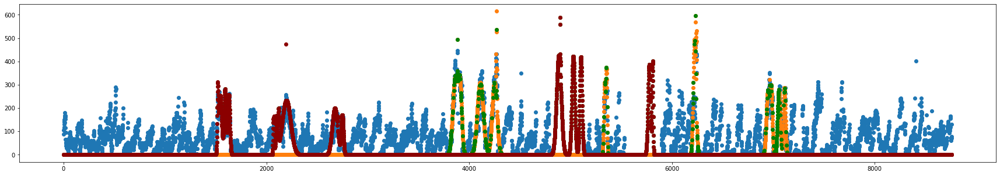

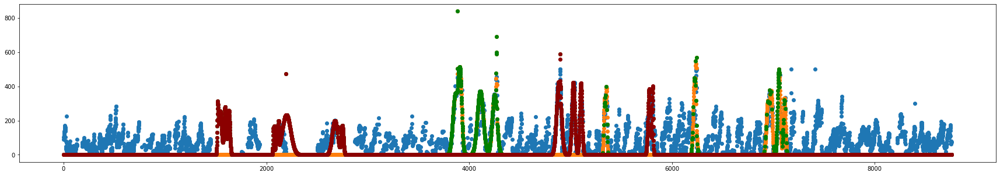

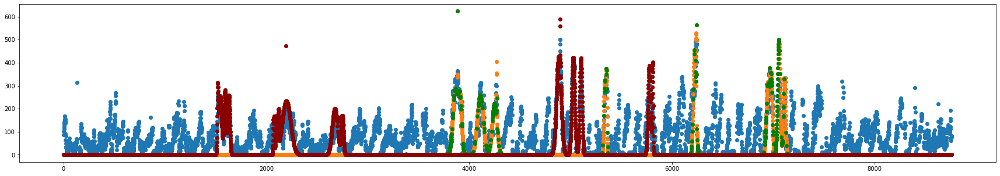

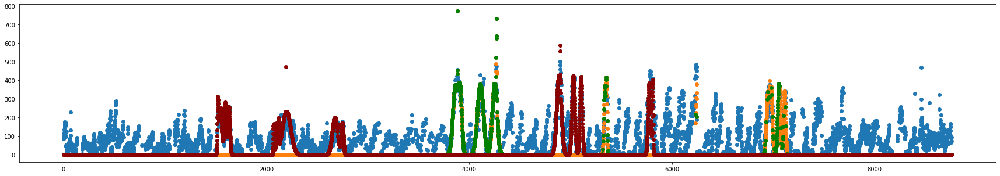

1th additional rbflayer
tensor([[-246.0376, -238.1450,  232.5002,  230.4888,  229.4903, -228.8994,
          213.4566, -212.7612,  209.4575,  199.0108,  247.0000,  242.0000,
          228.0000,  227.0000,  213.0000,  211.9749,  211.0000,  210.9602,
          210.0000,  210.0000,  135.9982,  131.9987,  126.9991,  117.9903,
          114.0000,  113.9994,  111.0000,  105.0000,   95.9996,   93.8185,
          129.7153,  120.7396,  118.6602,  116.9425,  109.9529,  109.7826,
          106.9479,  105.0000,  104.8349,  103.6889, -282.9863, -195.1183,
          177.9996,  164.9997,  146.9996,  142.9995,  134.9994,  131.8442,
          127.8290,  120.8708,  118.0000,  117.0000, -115.0816, -113.8475,
         -113.0311,  113.0000,  113.0000, -107.7005,  107.0000, -105.3255]],
       device='cuda:0', dtype=torch.float64)
1th additional RBFlayer 0th epoch loss: 65.80379299806174
1th additional RBFlayer 999th epoch MSE Loss: 57.819012015989934
1th additional RBFlayer 1999th epoch MSE Loss: 57.370737

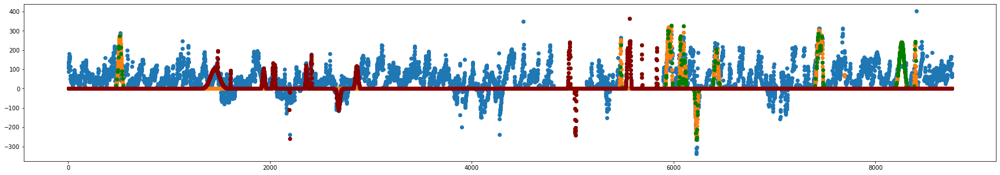

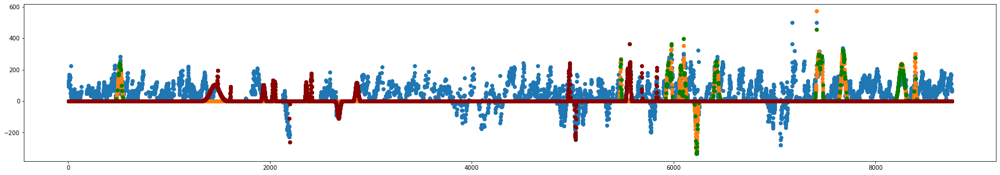

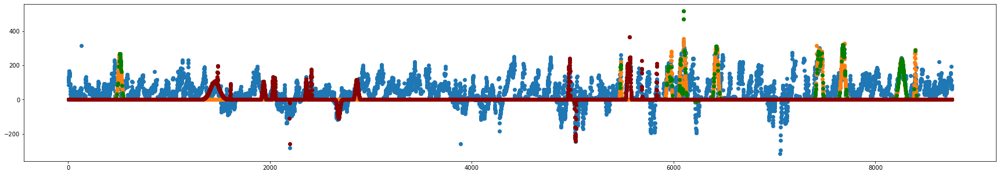

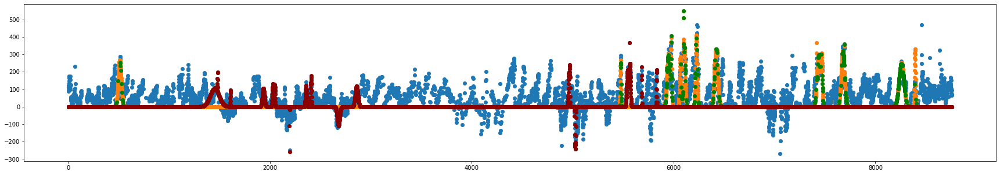

2th additional rbflayer
tensor([[-170.5380,  167.7351, -160.4430, -159.8571, -159.6655,  159.4956,
         -158.4553, -157.0151, -155.1952, -154.6068, -198.0442,  196.5215,
          191.7392,  191.3955, -191.2003, -188.1918, -186.9766, -185.9201,
          184.0000,  183.0000, -104.1403, -103.0349,  -98.8104,  -92.3851,
          -91.6558,  -90.1741,  -86.3035,  -84.3684,  -84.2117,  -83.7565,
          -75.9041,  -64.7930,  -63.9608,  -61.6645,   60.6180,   58.7278,
          -57.0018,  -55.5618,  -55.4772,  -54.7180, -195.6452,  114.3076,
          113.8270,  113.1751,  113.0672,  112.7615,  109.2702,  106.9928,
          104.2838,  103.7550,  105.1144,   80.9767,  -75.7360,   74.7214,
           70.9162,  -69.0804,  -63.7871,  -57.7088,   57.5596,   57.1561]],
       device='cuda:0', dtype=torch.float64)
2th additional RBFlayer 0th epoch loss: 56.98231112755412
2th additional RBFlayer 999th epoch MSE Loss: 50.22349669776677
2th additional RBFlayer 1999th epoch MSE Loss: 49.5354449

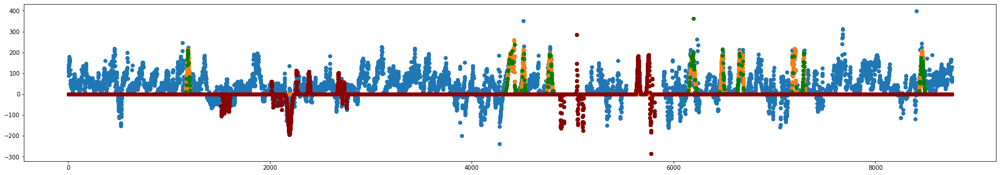

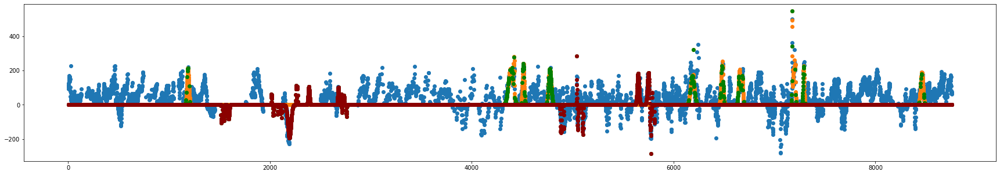

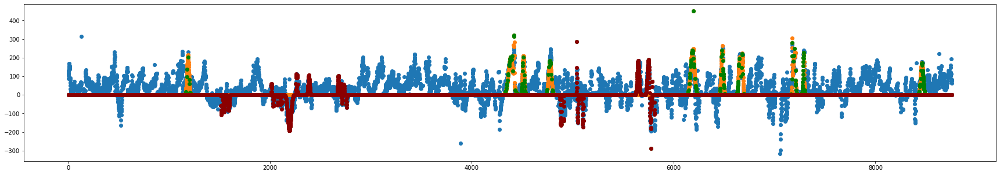

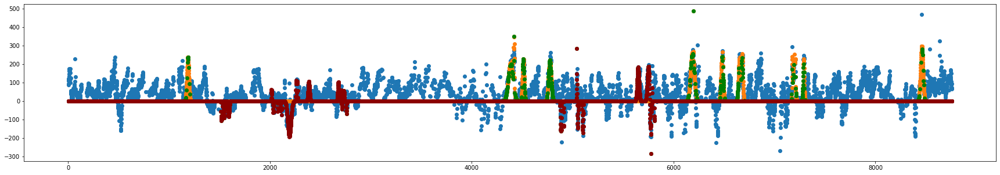

3th additional rbflayer
tensor([[-178.6240, -154.1509,  148.9697,  136.7815,  134.8621,  134.8460,
          128.9705,  120.9243,  119.9100,  114.1724, -162.1947,  159.0352,
          155.3666,  155.2782,  153.9213,  147.8916,  141.3766,  139.2041,
         -138.8093, -137.0320,  111.7192,   80.0000,  -76.7367,   73.9644,
           72.3775,   72.0000,   69.4939,   66.4077,  -66.2858,   63.0000,
          -52.4126,   51.6174,  -51.4560,  -50.0865,  -49.6414,  -49.1827,
           48.9955,   47.9990,  -47.2619,  -47.2567,  200.0744,  195.3981,
          191.6994,  188.9357,  187.8501,  157.9727,  156.0552,  129.5125,
          100.7393,   89.3496, -102.9161, -102.1547,  -95.6610,  -94.6849,
          -81.7002,  -80.6264,   71.1592,   69.1914,  -59.5356,   51.8966]],
       device='cuda:0', dtype=torch.float64)
3th additional RBFlayer 0th epoch loss: 50.61568560693981
3th additional RBFlayer 999th epoch MSE Loss: 43.424538765627496
3th additional RBFlayer 1999th epoch MSE Loss: 42.522266

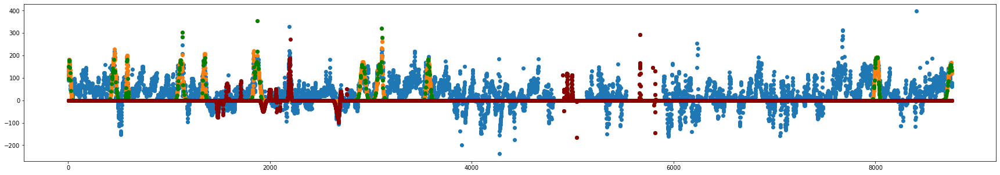

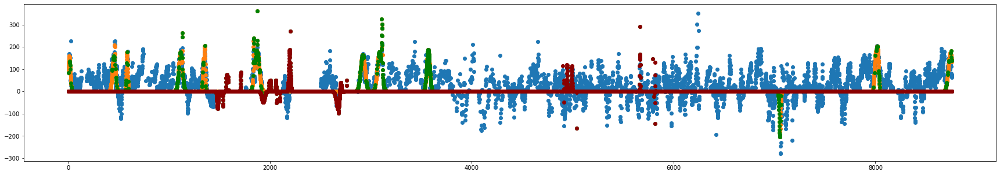

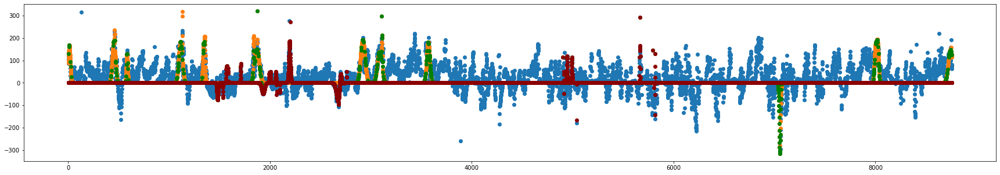

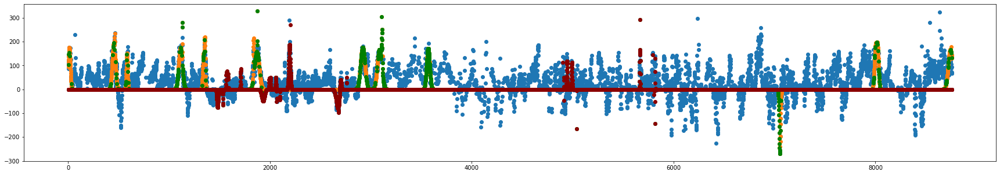

4th additional rbflayer
tensor([[-166.7755, -164.5376,  137.6764, -134.5559,  112.6955, -112.0461,
          112.0449,  110.8389, -107.9907,  107.4494, -214.6540,  185.9258,
         -157.2252,  151.7071,  147.8916, -143.9889, -132.5349, -122.2462,
          118.5510, -115.4192,  -60.9162,   60.2217,   59.9994,  -59.6543,
          -59.1974,  -57.7633,   56.0627,   54.9833,  -54.9582,   53.9998,
           58.4691,   48.4146,   46.9904,   45.5857,   45.5473,   44.8073,
           44.2195,  -44.0966,   42.6473,   42.2650, -191.3715, -138.8682,
           86.8759,   79.0000,   77.0439,   75.1488,   73.4416,   73.0000,
           72.0397,   70.8039,   85.8174,   85.7598,  -61.0074,  -54.7466,
          -50.9879,  -50.6275,  -50.3250,  -49.4632,   49.2216,  -48.2526]],
       device='cuda:0', dtype=torch.float64)
4th additional RBFlayer 0th epoch loss: 43.53147947969998
4th additional RBFlayer 999th epoch MSE Loss: 39.12514427817523
4th additional RBFlayer 1999th epoch MSE Loss: 37.9209247

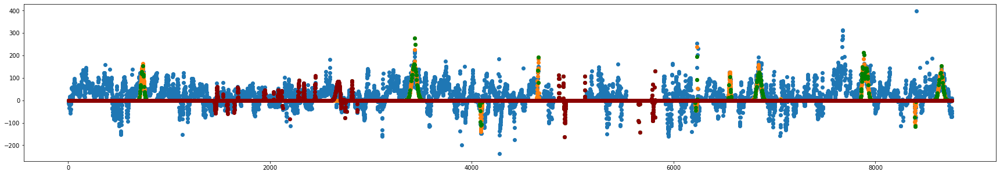

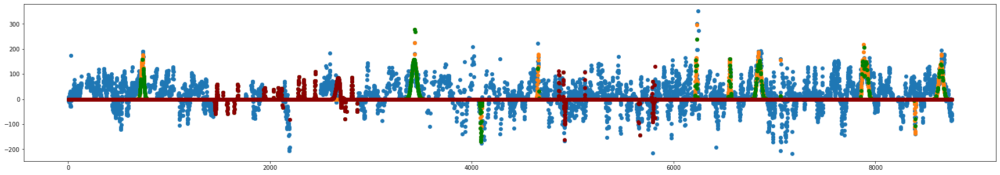

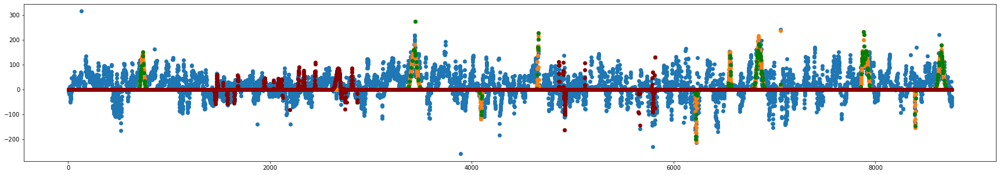

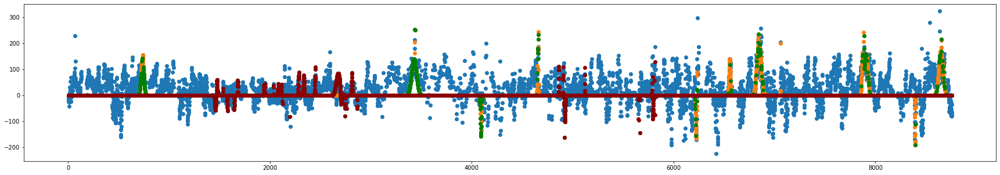

5th additional rbflayer
tensor([[ 249.0749, -158.6468,  142.2881,  107.1792,  104.6403,  104.5733,
          101.9035,  -98.8058,   96.7114,  -94.2108, -160.2252, -159.4927,
         -153.7671, -148.2353, -138.7021, -136.5573, -124.8713,  122.5965,
         -119.3865,  113.0082,   64.8942,   56.0583,   54.9346,   52.0000,
          -50.8566,  -50.5983,   50.5471,   50.4520,   48.2607,   47.3515,
           39.1000,   31.8391,  -31.8088,  -31.6205,   31.5707,  -30.6608,
          -30.0094,  -29.5655,   29.0003,  -28.5768, -109.0051,  -69.8313,
          -68.9589,  -66.8705,  -66.0112,  -63.7996,   62.2242,  -61.1889,
          -60.0985,   59.0462,  -98.8050,  -90.5540,  -88.2126,  -85.8007,
          -84.1286,  -83.8265,  -68.6602,  -57.5173,  -54.7538,  -53.7453]],
       device='cuda:0', dtype=torch.float64)
5th additional RBFlayer 0th epoch loss: 37.71810145818271
5th additional RBFlayer 999th epoch MSE Loss: 35.079889399772846
5th additional RBFlayer 1999th epoch MSE Loss: 34.614674

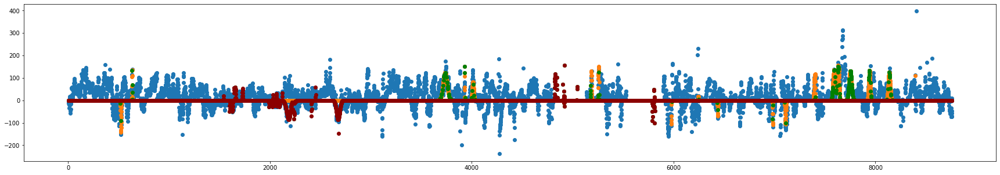

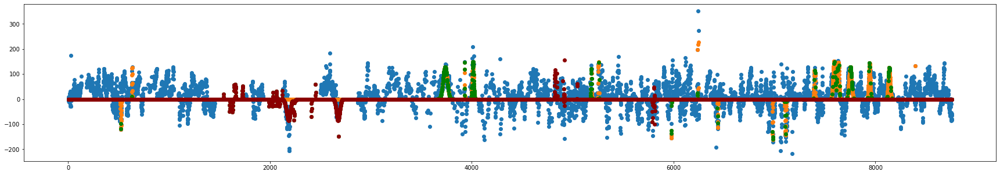

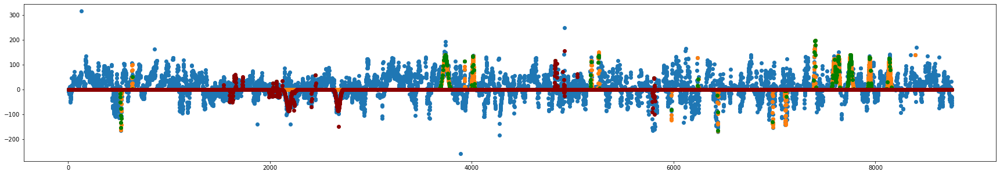

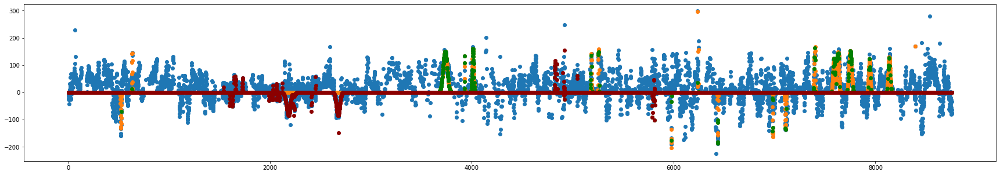

6th additional rbflayer
tensor([[-166.3358, -160.4109,  153.4029, -100.4286,  -99.7043,  -96.1107,
          -88.6172,   85.3647,  -85.2357,   83.5586,  249.1696,  158.6507,
          153.5493,  150.9680, -146.8042, -140.6667, -140.2075, -129.3666,
         -119.3865, -107.5451,   63.4266,   56.0583,   51.0976,   47.3515,
          -46.0936,  -44.8678,  -44.3113,  -43.7399,  -43.5854,   43.2688,
           42.0029,  -41.7826,  -40.8752,   36.3754,  -32.1002,   29.2734,
          -28.4964,   27.5171,  -26.9802,  -26.1052,  183.4420,   95.6053,
           89.0388,   88.4800,   84.2400,   83.3081,   82.2004,  -81.5986,
           79.4075,   69.8193,   86.1571,   84.8164,   72.2456,   60.5429,
          -52.7119,   51.6348,  -50.6192,  -49.7171,  -49.5392,   49.1856]],
       device='cuda:0', dtype=torch.float64)
6th additional RBFlayer 0th epoch loss: 35.412545588120665
6th additional RBFlayer 999th epoch MSE Loss: 32.110925631706344
6th additional RBFlayer 1999th epoch MSE Loss: 31.72397

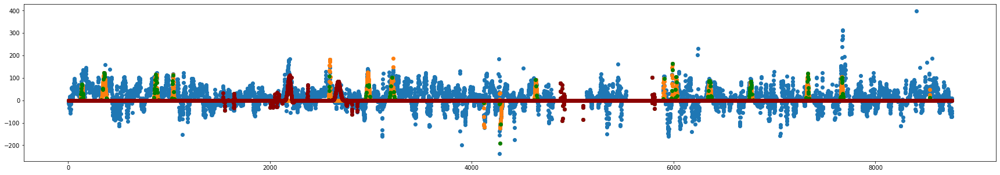

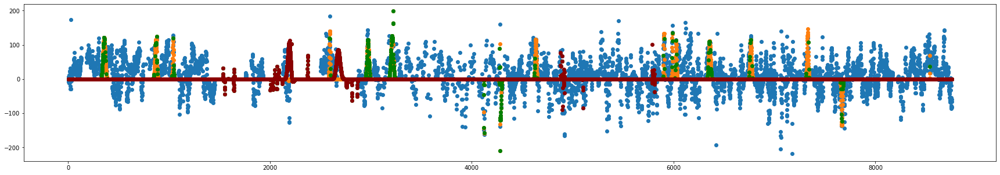

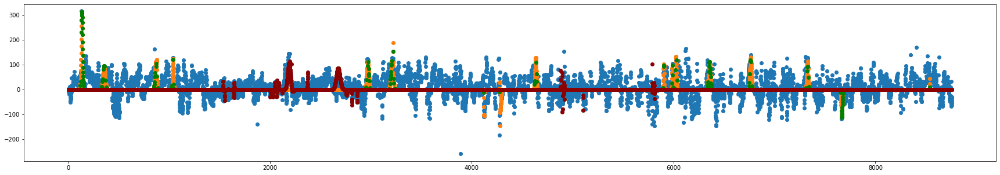

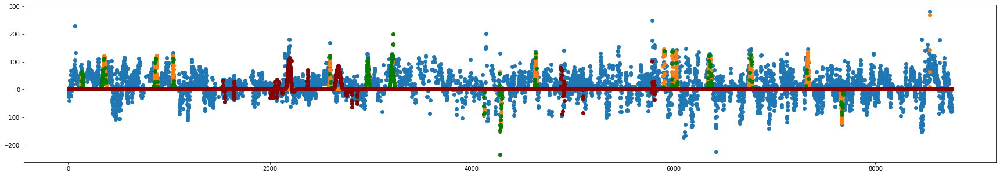

7th additional rbflayer
tensor([[-168.9409, -125.9125, -119.3016, -115.4254,  -98.2906,  -85.6208,
           80.9721,  -80.8089,   80.7963,   80.7247,  161.8447, -157.2980,
          150.3331,  147.7765,  135.4285, -134.9596, -121.0720,  120.7624,
         -109.9104, -108.9699,   59.8268,  -52.6016,   51.0488,   48.0151,
           47.3514,   47.1185,  -46.7729,  -45.8663,   43.2231,   43.0591,
           42.0029,   38.0157,  -37.5447,  -30.1474,  -25.8599,   25.7217,
           25.5863,  -25.3349,  -24.8297,  -24.3408, -161.0553, -147.4981,
          -78.3928,   70.0402,   68.7532,  -68.0360,  -64.2367,   56.9974,
           56.9698,   56.9291,  -99.1436,  -96.4300,  -91.8445,  -85.9088,
          -79.0649,  -70.7630,   61.2499,  -60.0585,  -58.6504,  -53.4794]],
       device='cuda:0', dtype=torch.float64)
7th additional RBFlayer 0th epoch loss: 32.598702494432395
7th additional RBFlayer 999th epoch MSE Loss: 29.617378646673238
7th additional RBFlayer 1999th epoch MSE Loss: 29.25832

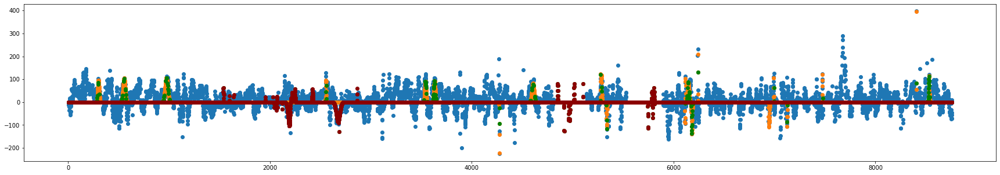

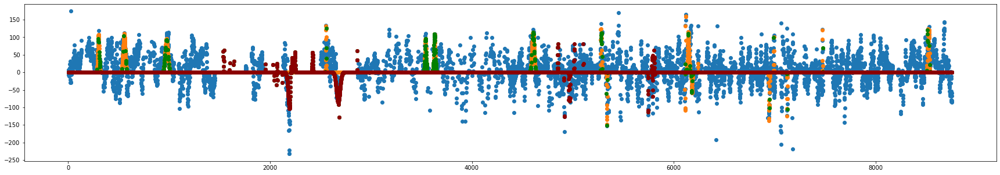

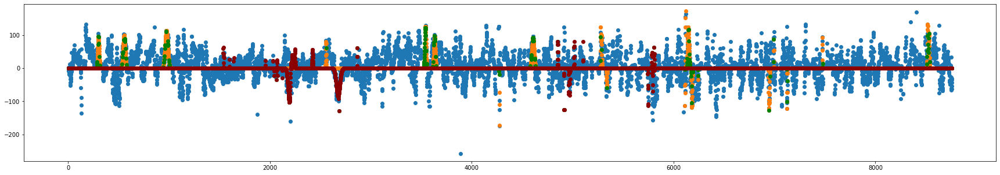

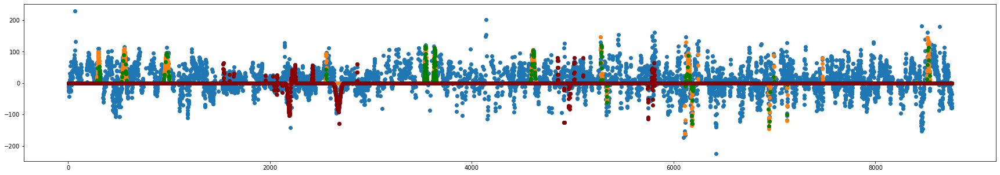

8th additional rbflayer
tensor([[ 251.9982,  249.7432, -168.8539, -102.6898,  -94.2108,   79.9708,
          -79.0193,  -76.1963,  -76.1455,  -75.5000,  186.9940,  167.0522,
          157.9915, -154.7165, -142.9176, -141.7312, -139.9696,  115.8269,
         -112.6268,  109.5775,  -92.5056,  -74.6887,  -52.6016,   50.1438,
           47.9595,   47.3514,  -46.5763,  -45.9420,  -45.8663,  -42.4744,
           42.0029,  -40.2124,   35.2017,   34.8881,  -29.2103,  -29.0279,
          -28.0523,   26.2370,  -25.1855,   24.1754,  171.5314,   93.6554,
          -85.0066,   78.7558,   78.6108,  -77.1593,  -77.1361,  -76.3395,
           72.4930,   70.2529,   86.3083,   80.6082,   69.8206,   59.3191,
           58.8159,   53.4520,   53.1225,   51.1646,   47.2131,   43.9341]],
       device='cuda:0', dtype=torch.float64)
8th additional RBFlayer 0th epoch loss: 30.37316575530745
8th additional RBFlayer 999th epoch MSE Loss: 27.714814289581827
8th additional RBFlayer 1999th epoch MSE Loss: 27.231155

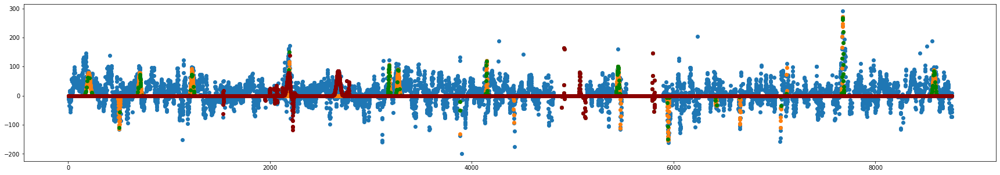

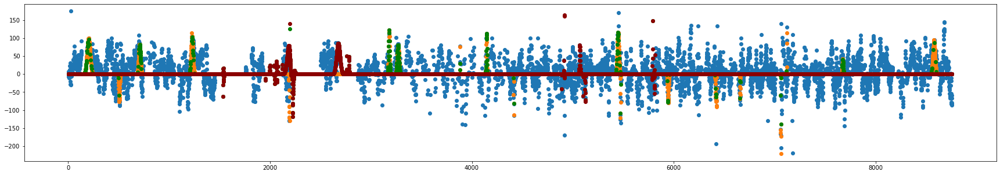

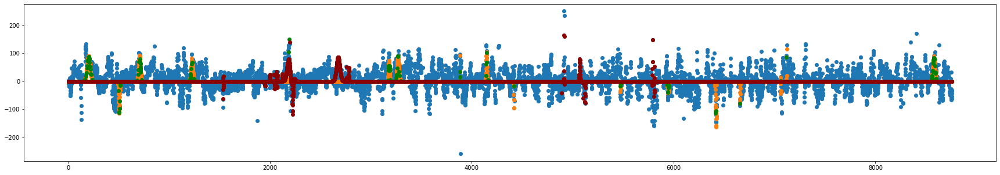

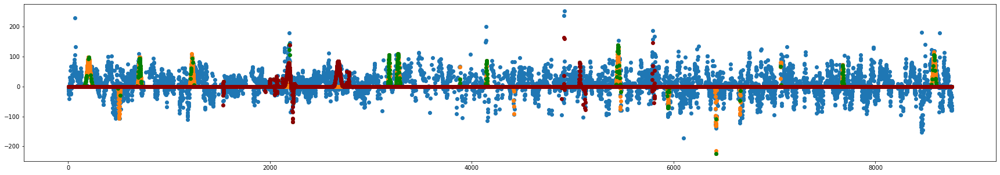

9th additional rbflayer
tensor([[-160.2975, -158.5456, -104.6991,   94.2822,   75.3143,  -73.8331,
           70.1492,   69.9620,  -68.3787,  -66.9521, -194.8990, -144.2885,
          127.5809,  117.5151,  115.1072,  113.3380, -110.5961, -107.0978,
          105.5631,  104.8300,  -62.8616,  -58.7035,  -52.6016,  -50.6374,
           46.9710,  -46.4499,  -45.8663,  -42.4761,  -42.3284,  -42.0313,
           42.7946,  -39.4838,   39.2824,   36.5420,   31.8913,  -27.5152,
          -26.2531,  -25.8692,  -25.4166,  -24.4368, -140.3216,   98.3263,
          -97.1738,   78.3934,   73.8340,  -69.1766,  -68.6879,   67.7168,
           64.8931,  -63.8693,  -99.1464,  -92.1006,  -88.2839,  -88.2637,
          -85.7722,  -60.3211,  -58.7230,   53.0826,  -52.6331,  -51.1986]],
       device='cuda:0', dtype=torch.float64)
9th additional RBFlayer 0th epoch loss: 27.031173138627604
9th additional RBFlayer 999th epoch MSE Loss: 25.5139957272676
9th additional RBFlayer 1999th epoch MSE Loss: 25.3294827

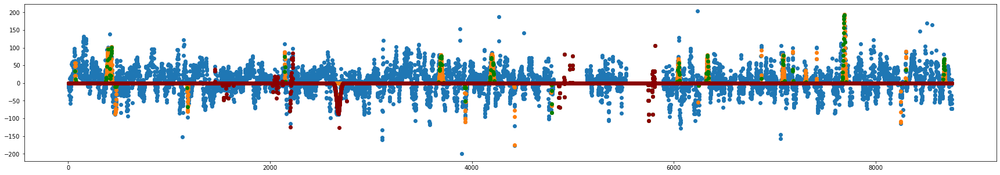

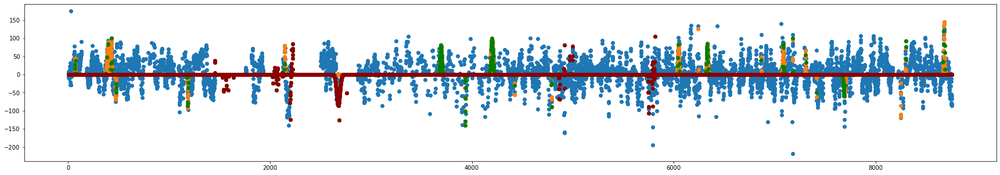

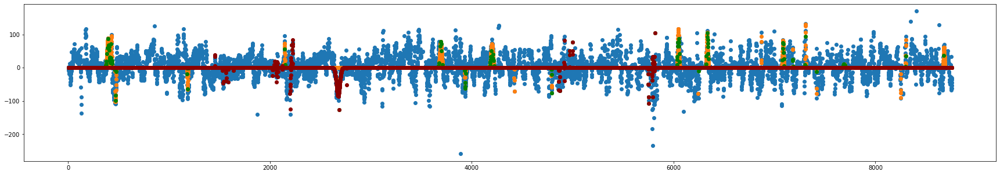

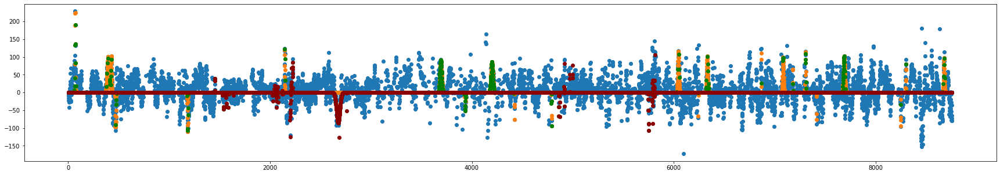

10th additional rbflayer
tensor([[-164.3910, -156.9999,  133.6885, -127.8557,  103.1473,  -76.1455,
          -74.9502,  -73.8331,   67.3649,   65.0266, -167.3528, -147.0520,
         -146.5957, -136.4608, -133.4864,  131.5100,  125.5635, -116.8008,
         -107.5707, -107.0669,   89.6749,   88.2660,   74.0430,  -57.5769,
          -52.6016,  -45.8663,   41.6368,   41.5855,   41.0000,  -40.7577,
          -40.6232,   39.4752,   37.6008,   33.5201,   26.6987,   26.6215,
           25.8064,   24.2700,  -24.0792,   24.0760,  -74.4553,  -55.0913,
           54.5124,  -54.3238,  -54.2850,  -54.1952,  -53.6872,  -53.5826,
           52.9850,   52.5523,  125.7683,   86.2522,   77.4118,   67.6967,
           57.5724,   53.0841,   52.3789,  -50.5446,   47.6498,   44.4906]],
       device='cuda:0', dtype=torch.float64)
10th additional RBFlayer 0th epoch loss: 25.192541763504046
10th additional RBFlayer 999th epoch MSE Loss: 23.848938827349727
10th additional RBFlayer 1999th epoch MSE Loss: 23.6

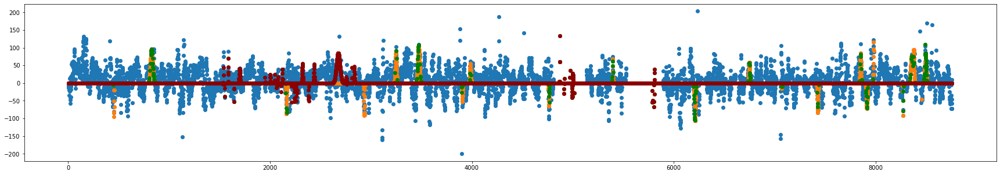

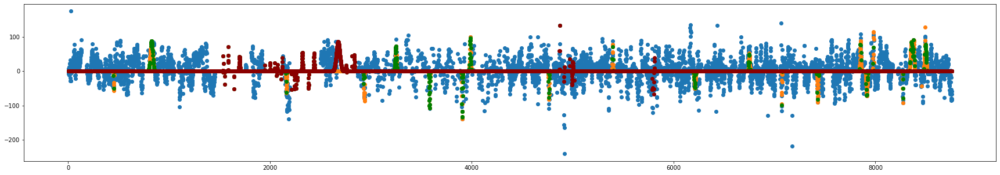

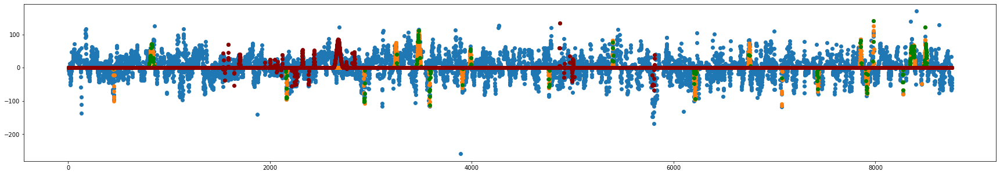

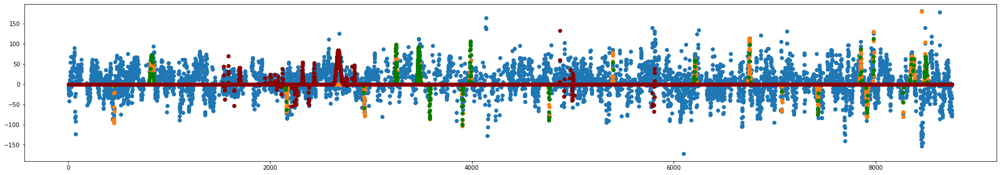

11th additional rbflayer
tensor([[-253.4874, -162.3439, -156.9801, -116.4883,  103.1473,  -76.1277,
           74.3219,   64.9114,  -64.7643,   64.2014,  155.0000,  152.8553,
          152.7718,  146.6667,  140.4328, -135.9260,  126.0580,  112.0664,
         -111.3432,  104.4005,   76.8593,  -71.4968,  -59.6655,   51.4953,
          -47.9475,  -45.8663,   43.7902,  -42.4223,   39.0010,   38.9998,
          -69.0348,  -49.7330,  -37.4620,  -35.8359,  -26.3190,   26.2566,
          -26.0583,   25.1773,   24.1666,   24.0047,  -57.0834,   55.6946,
          -53.6715,   50.0000,   48.8768,  -47.8266,   47.0000,  -46.8105,
          -45.6174,   45.2058,  -99.2138,  -92.5901,  -88.4694,  -84.7159,
          -71.9143,  -69.7456,  -61.3859,  -60.4386,  -55.1271,   53.3184]],
       device='cuda:0', dtype=torch.float64)
11th additional RBFlayer 0th epoch loss: 23.84663580018098
11th additional RBFlayer 999th epoch MSE Loss: 22.692560764008732
11th additional RBFlayer 1999th epoch MSE Loss: 22.55

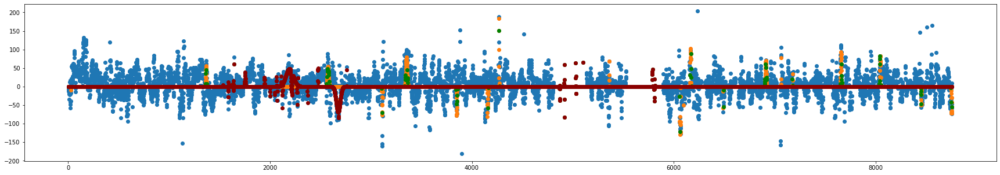

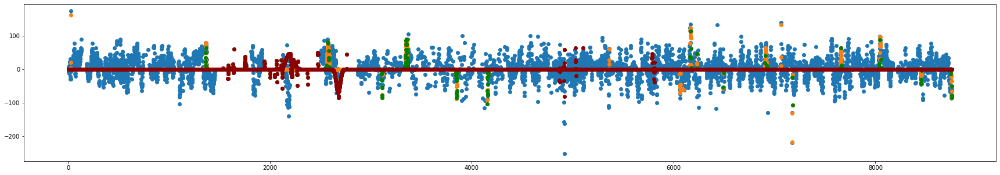

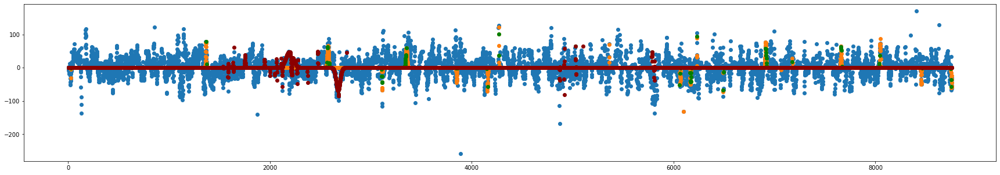

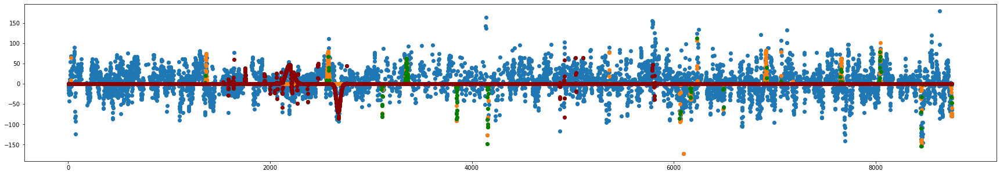

12th additional rbflayer
tensor([[-171.4823, -162.5368, -131.1467, -124.2102,  122.0000, -107.2684,
           80.5688,  -66.6903,   64.8089,   64.0643,  152.8553,  150.6667,
          140.4318, -140.0000, -131.5299,  126.2603,  121.1401, -114.0000,
         -108.4993,  104.0402,  -63.8597,   51.9712,  -50.0184,  -45.1420,
           44.3814,  -43.0522,   38.5745,   37.5371,   37.0694,  -36.3331,
           48.1695,   42.3797,  -39.6966,  -35.0352,   33.1888,   31.4760,
          -27.2180,   27.2119,   26.5053,  -25.3438,  -93.5304,   71.4468,
          -67.5204,  -66.4158,  -65.8423,  -65.7697,  -65.6912,  -63.2270,
          -61.6211,   60.6774,  119.0292,   70.4451,   68.1102,   62.8549,
           60.1634,  -47.5658,  -41.9448,   41.2062,   38.9040,  -38.6163]],
       device='cuda:0', dtype=torch.float64)
12th additional RBFlayer 0th epoch loss: 22.76554850605485
12th additional RBFlayer 999th epoch MSE Loss: 21.629461944196393
12th additional RBFlayer 1999th epoch MSE Loss: 21.41

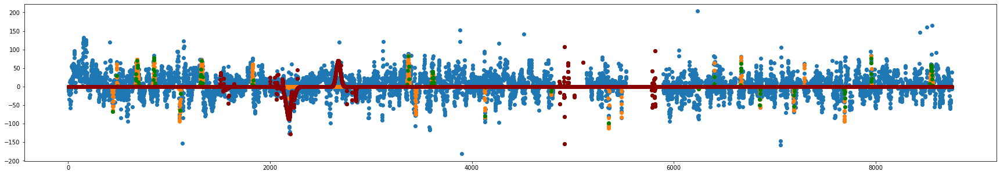

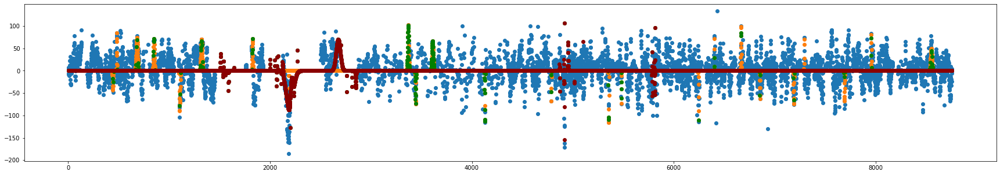

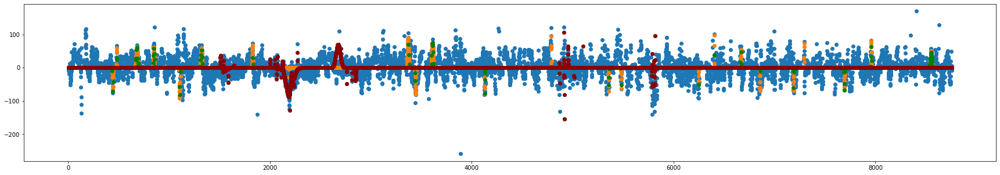

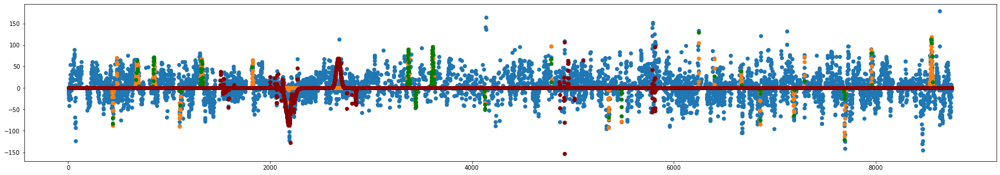

13th additional rbflayer
tensor([[ 243.3273, -228.6273,  163.5408,  -96.7447,  -82.6604,  -76.1277,
           74.5027,   72.7146,  -64.1396,   62.9632,  161.9124,  161.4821,
          151.4819,  150.6665, -149.1826,  129.1214,  127.6002,  122.6183,
         -120.5768,  100.8946,  100.1366,  -66.4404,   53.3062,  -50.1816,
           47.0000,   45.5603,   44.3814,   38.5622,   38.3549,   36.4849,
           45.3598,  -43.9960,   35.7748,  -31.4199,   30.3803,   29.3719,
          -27.3401,  -24.3918,   24.0498,  -23.8464,  108.5643,   82.0268,
           75.8405,   59.5755,   55.1178,   51.1861,   50.6653,   50.0092,
           49.3928,   47.0310,  -93.0497,  -85.9563,  -83.6651,  -72.7705,
          -72.7219,  -62.6159,  -62.2326,  -56.3005,   55.9163,   55.8189]],
       device='cuda:0', dtype=torch.float64)
13th additional RBFlayer 0th epoch loss: 22.058985771623526
13th additional RBFlayer 999th epoch MSE Loss: 20.807932284567443
13th additional RBFlayer 1999th epoch MSE Loss: 20.5

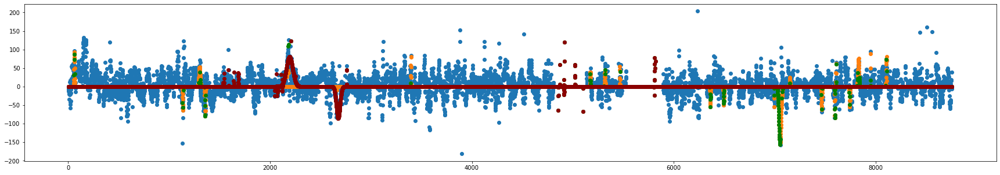

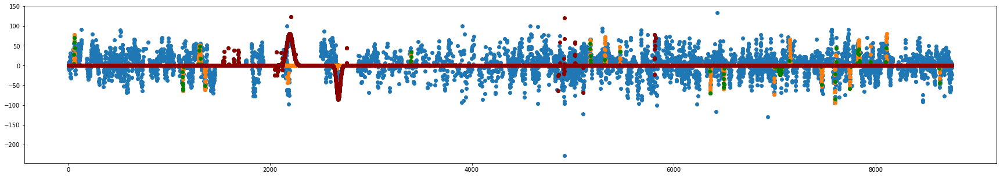

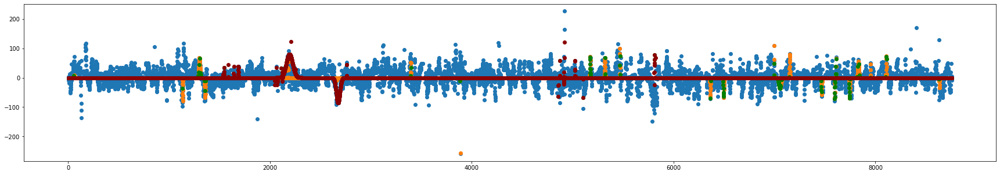

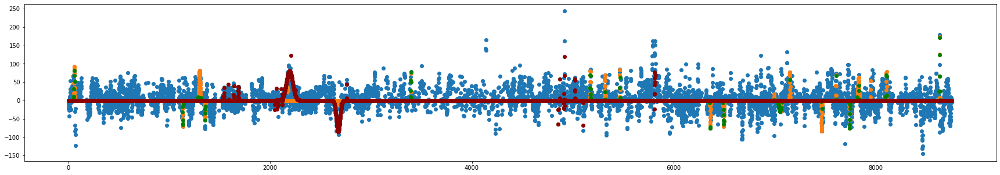

14th additional rbflayer
tensor([[-213.9338, -158.3465,  123.3197, -118.0344,  -93.0868,  -90.9589,
          -82.1507,  -76.8259,   67.0974,  -64.8613, -171.7044,  161.4821,
          151.4951,  150.6165, -149.1826,  148.3308, -133.5128,  121.7628,
         -110.9034, -108.8129,  -72.5555,  -58.6305,   55.6356,  -48.6217,
           47.4231,  -46.6667,  -45.4259,  -44.8802,   44.3814,  -42.4690,
          -41.6107,  -39.6183,   36.2611,  -33.4530,   31.9592,  -31.8241,
           31.7259,   31.5290,  -30.1059,   27.5279, -119.1225, -118.4468,
         -106.2935,  -82.6035,  -82.2886,  -73.3221,  -72.0460,  -71.6077,
          -71.1796,  -69.1897,  125.2501,   86.2839,   83.0853,  -80.4293,
           56.0904,  -43.0827,  -42.1121,   40.9491,   38.9570,  -36.1236]],
       device='cuda:0', dtype=torch.float64)
14th additional RBFlayer 0th epoch loss: 21.08779760228705
14th additional RBFlayer 999th epoch MSE Loss: 19.9915359673892
14th additional RBFlayer 1999th epoch MSE Loss: 19.8046

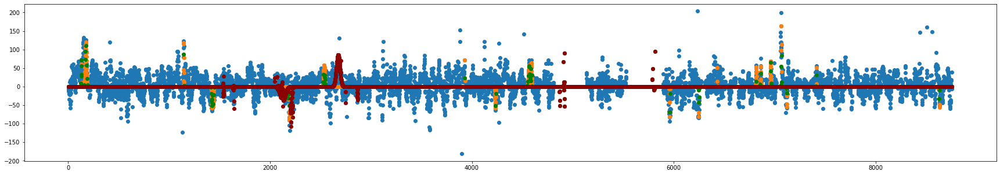

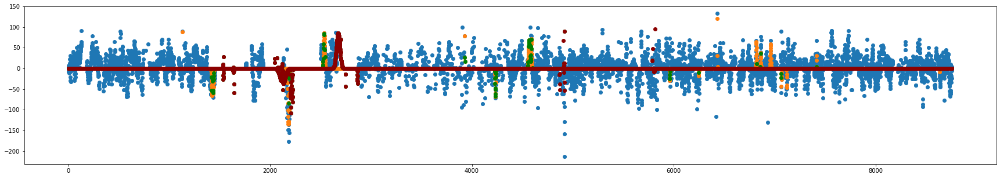

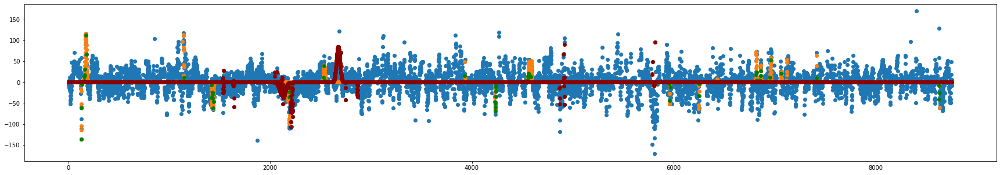

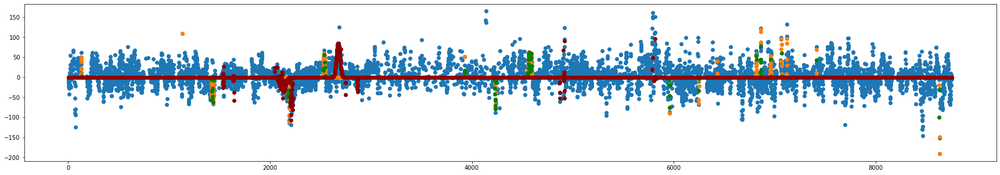

15th additional rbflayer
tensor([[-218.5956, -161.0250,  129.1568, -126.2567, -105.3369,  -76.8259,
          -72.5763,   67.9100,   64.8493,  -64.1500, -171.7044,  161.4821,
         -148.0400,  111.5051,  108.5249, -103.9999, -102.0000, -100.2737,
         -100.0000, -100.0000,  -80.4075,  -55.8892,   55.6356,   51.2269,
           48.7931,  -47.9564,   43.6046,  -42.9496,  -42.4717,   42.3143,
           56.7871,   50.7202,   44.4960,   41.2427,   40.8717,   37.8211,
           36.3186,   34.8958,   33.6749,  -33.4034,  -89.3028,  -72.1048,
          -66.8468,  -65.5064,  -61.5332,  -61.1727,  -60.5240,   54.6380,
          -53.3760,  -52.0929,  -92.6623,  -85.8215,  -83.5027,  -72.5559,
          -72.4318,  -72.1374,  -61.9766,  -61.4437,  -60.4916,   56.6732]],
       device='cuda:0', dtype=torch.float64)
15th additional RBFlayer 0th epoch loss: 20.570720811846677
15th additional RBFlayer 999th epoch MSE Loss: 19.132668837139292
15th additional RBFlayer 1999th epoch MSE Loss: 18.7

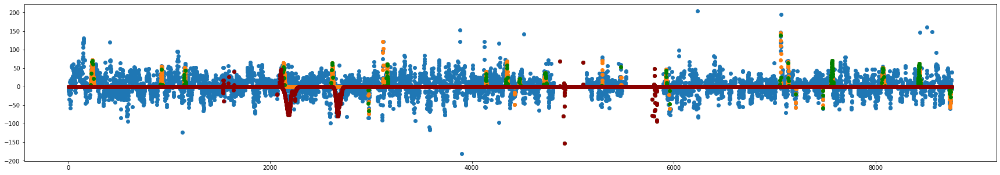

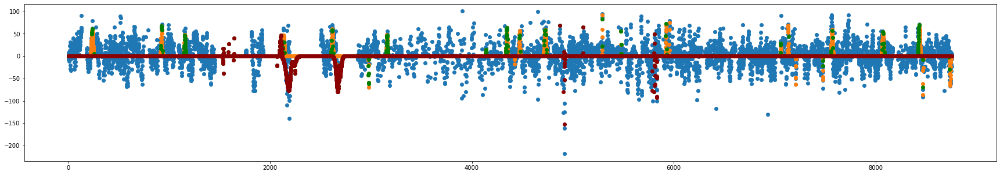

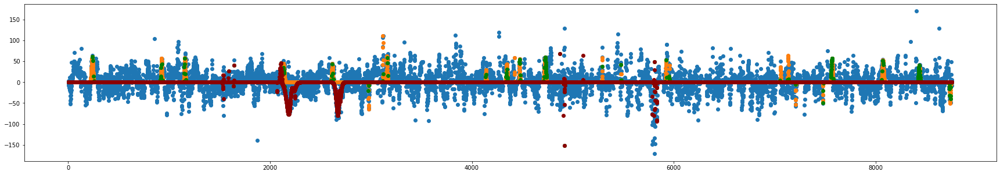

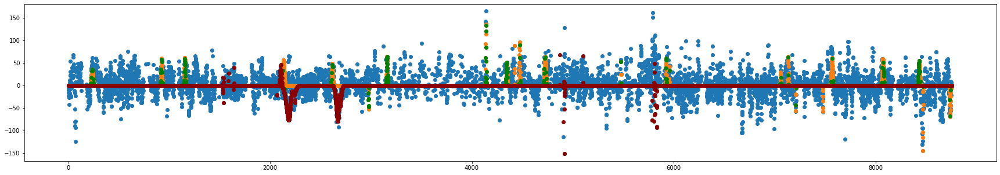

16th additional rbflayer
tensor([[ 234.9182, -165.7466, -131.6606, -120.7821, -119.6188,  -89.5811,
          -76.8259,   73.0360,  -69.5001,   67.2506,  179.4596,  161.4821,
          150.5800, -139.6214, -138.4085, -125.2047, -123.2903,  116.1689,
          110.2379, -106.3091,  -51.4474,   46.7859,   45.9470,  -42.9496,
          -42.2217,  -41.4661,  -40.3598,   39.0000,  -38.3027,  -36.3019,
          -43.8406,  -36.8961,   31.1716,   30.8967,   30.3563,   28.9150,
          -28.3214,  -28.1497,  -27.8610,  -27.3123,   72.4512,   70.4779,
           62.9615,   59.9588,   59.7533,   57.2075,   49.1730,   48.7348,
           46.3544,   46.3326,  -80.4281,   71.5777,   66.1128,   59.3291,
          -56.9400,   46.8723,   43.3307,   40.4952,   39.2443,  -38.0356]],
       device='cuda:0', dtype=torch.float64)
16th additional RBFlayer 0th epoch loss: 19.428355990466073
16th additional RBFlayer 999th epoch MSE Loss: 18.27965712569086
16th additional RBFlayer 1999th epoch MSE Loss: 18.12

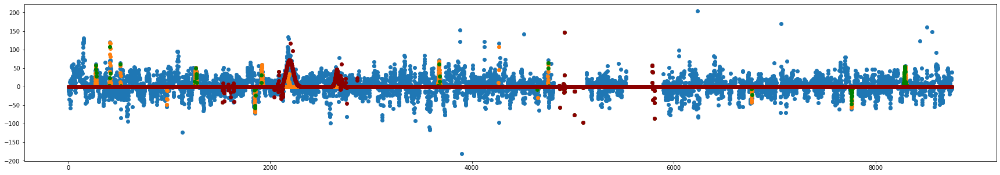

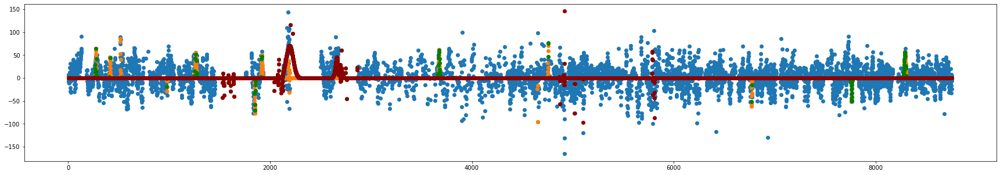

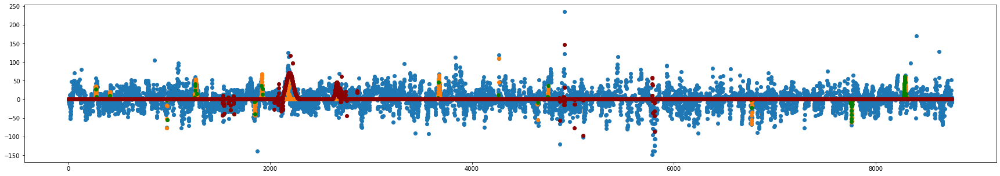

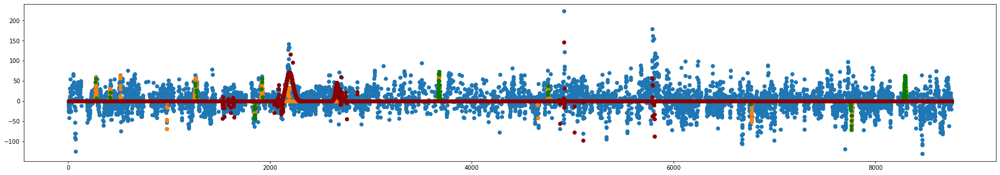

17th additional rbflayer
tensor([[-168.8397, -162.9414, -155.1826,   96.7655,   94.2257,   72.9558,
           67.7661,  -64.5392,   62.3649,  -61.8647, -159.4760,  156.3242,
          155.4184,  148.7994,  136.9559,  122.6765,  118.9172,  116.1689,
          110.2379,  109.4559,   69.2229,   66.6162,   56.0222,   53.4058,
           50.9251,   48.4442,   47.5501,  -47.3689,   45.8406,  -42.6132,
           40.5016,   38.8568,   33.4158,   32.2496,   29.3682,  -28.4120,
           27.4612,   27.4266,  -26.9253,   26.5714, -101.9015,  -99.4597,
          -93.7328,  -83.9327,  -79.2832,  -76.9664,  -74.5425,  -74.2112,
          -73.4219,  -70.3561,  -73.9605,   66.2467,  -63.9097,   56.3790,
           53.6528,  -47.1273,  -44.4050,  -39.6869,   39.4379,  -37.5165]],
       device='cuda:0', dtype=torch.float64)
17th additional RBFlayer 0th epoch loss: 19.03805655897831
17th additional RBFlayer 999th epoch MSE Loss: 17.991796918481146
17th additional RBFlayer 1999th epoch MSE Loss: 17.82

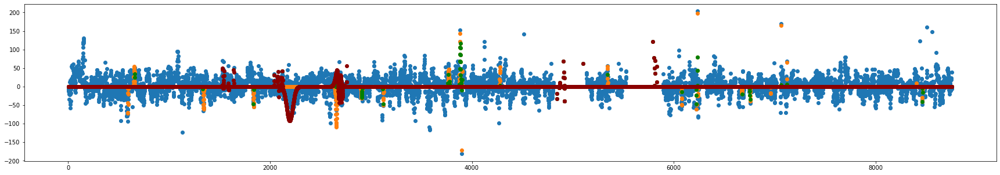

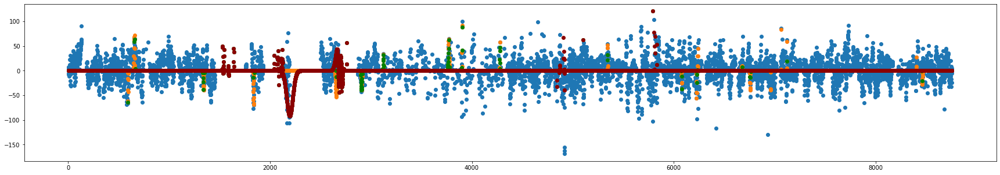

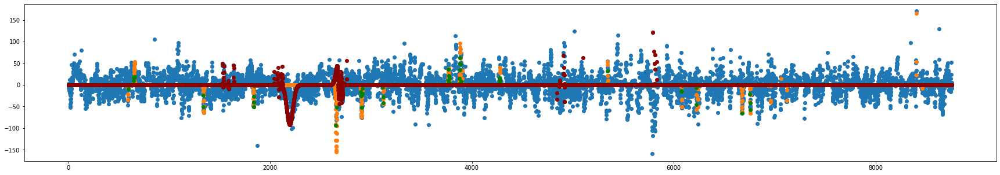

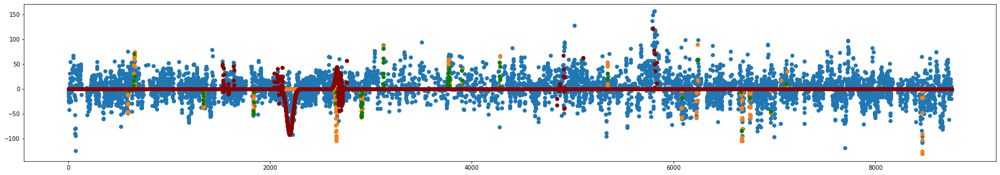

18th additional rbflayer
tensor([[-129.3806,  127.4810, -124.0014, -116.0000, -112.4917,  -97.8368,
          -93.7167,  -93.1162,   88.3981,  -75.4478, -217.8764, -159.4760,
          156.3242, -154.7203,  136.9393,  121.4744, -117.3948, -106.9728,
         -105.2295, -103.0000,  -86.5121,  -75.2678,   48.9986,  -48.9849,
           48.7879,   48.2967,  -48.0362,  -40.4892,   38.6180,   36.1200,
          -54.1395,  -52.7436,  -46.7523,  -43.9963,  -38.5127,  -36.9597,
           32.1847,  -30.5690,  -29.6605,  -26.3905,  104.5065,   99.2544,
           90.9514,   85.6921,   80.3102,   78.5474,   71.3983,   68.4948,
           62.7541,   59.3014,   77.5357,   66.4184,  -60.5333,   59.8560,
           54.1777,  -48.5883,  -45.9343,  -44.5197,  -41.1839,  -40.0957]],
       device='cuda:0', dtype=torch.float64)
18th additional RBFlayer 0th epoch loss: 18.860036600394878
18th additional RBFlayer 999th epoch MSE Loss: 17.592712049736324
18th additional RBFlayer 1999th epoch MSE Loss: 17.4

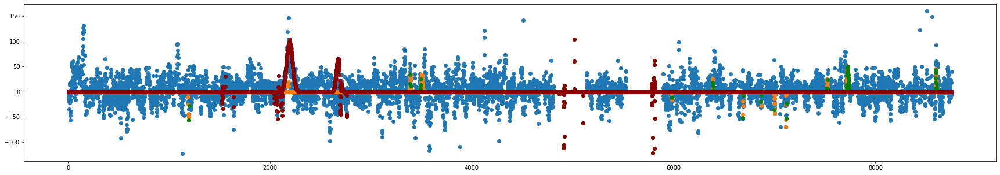

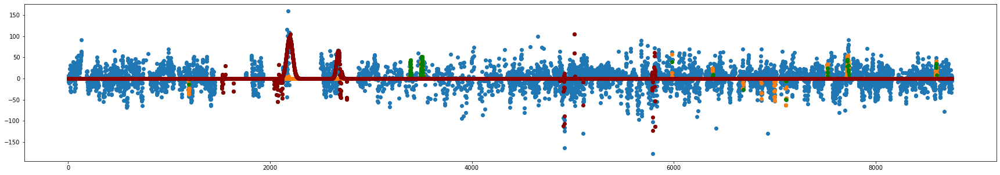

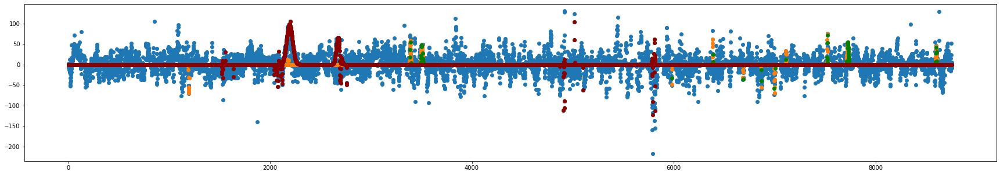

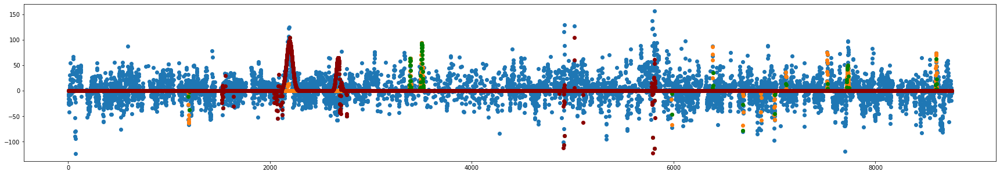

19th additional rbflayer
tensor([[ 233.9345,  218.6686, -141.6124,  118.2727, -109.8800,   84.4664,
          -75.4477,  -70.6005,  -70.0769,  -66.7680,  222.9811,  213.7702,
         -155.4828, -151.7621,  150.6785,  145.0421, -132.5795, -125.1463,
          124.0874, -102.4331,  -65.0241,   53.7737,   50.6246,   49.6776,
           48.2967,   47.5022,  -47.3621,  -46.5499,  -45.4625,   40.8443,
           54.6884,   49.3857,  -49.0932,   38.5694,   32.6900,  -31.7717,
          -29.7092,   24.6712,  -24.2710,  -24.2282, -103.0285,  -99.8239,
          -88.7954,  -88.7240,  -87.4608,  -84.3584,  -79.2818,  -77.0823,
          -74.9975,  -71.5774,  -94.7242,  -84.8613,  -80.7865,  -80.3639,
          -71.1800,  -68.1895,   64.8647,  -61.5162,  -54.2807,   50.7947]],
       device='cuda:0', dtype=torch.float64)
19th additional RBFlayer 0th epoch loss: 18.521358372162208
19th additional RBFlayer 999th epoch MSE Loss: 17.197241493023192
19th additional RBFlayer 1999th epoch MSE Loss: 16.9

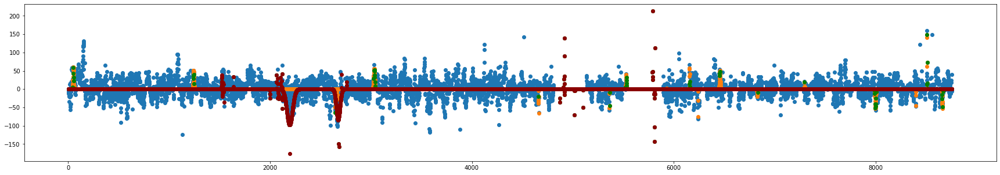

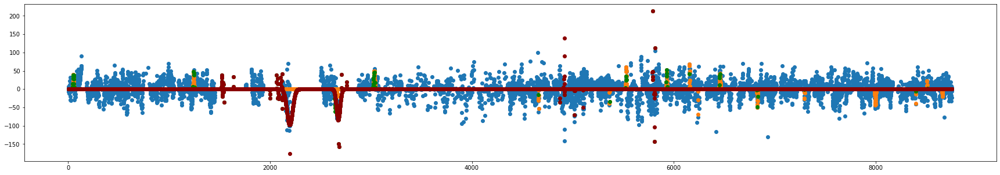

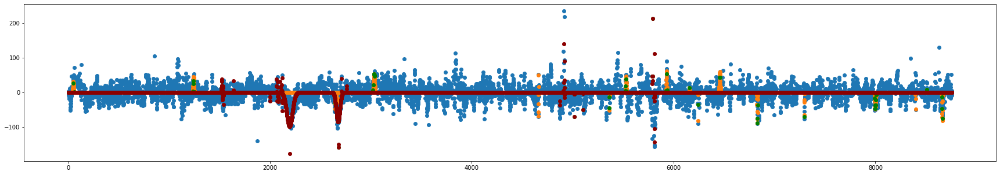

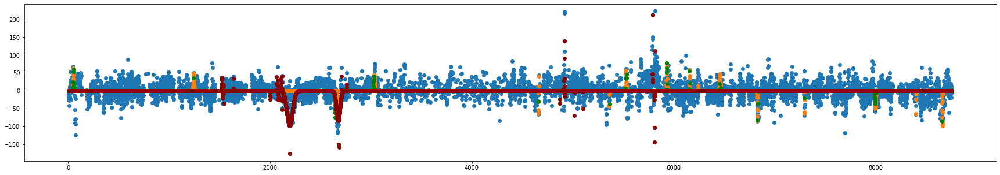

20th additional rbflayer
tensor([[-176.1530, -149.7231,  128.4961, -123.8011,  118.2636,  110.7778,
           99.2540,  -94.3321,   93.1907,  -84.9216, -238.9635,  207.0649,
          184.7882, -132.5795, -130.1047, -126.5000,  117.7127,  115.6369,
          110.9981,  -96.8033,  -61.9350,  -59.9458,  -57.4258,   53.7086,
           49.3834,   48.2967,  -44.9465,  -43.7857,   38.5335,   38.3185,
           77.8652,  -41.7750,   41.0577,   40.6693,   37.4977,  -35.7378,
           29.5225,   28.1884,   27.3065,  -25.3951,  178.4743,   96.1659,
           91.8790,   81.3581,   78.5559,   73.8708,   69.8440,   67.0468,
           64.4715,   60.6264,  141.7430,   96.5729,   82.9045,   78.6690,
           76.3649,   69.1003,   66.4578,   58.4799,   56.7639,   51.6192]],
       device='cuda:0', dtype=torch.float64)
20th additional RBFlayer 0th epoch loss: 19.015917735433153
20th additional RBFlayer 999th epoch MSE Loss: 16.702636438268165
20th additional RBFlayer 1999th epoch MSE Loss: 16.5

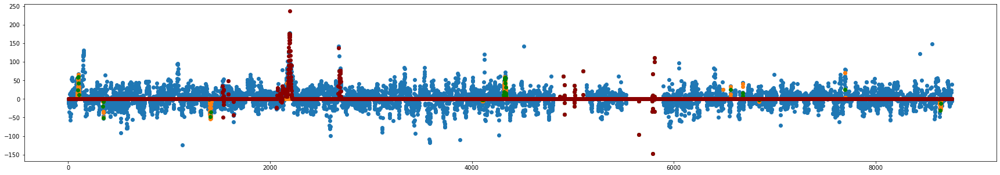

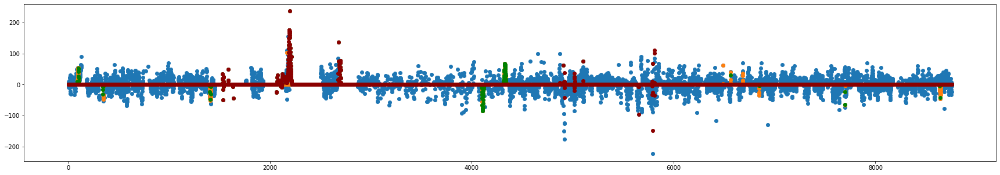

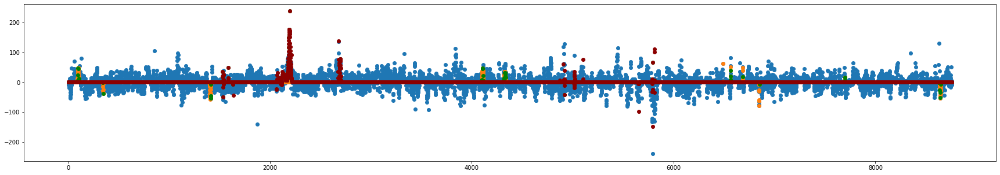

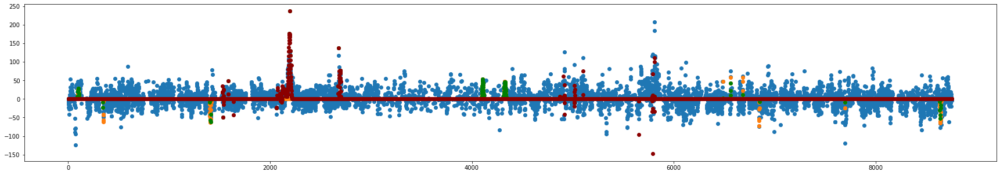

21th additional rbflayer
tensor([[-166.1986, -163.9092, -157.7214, -104.7256, -100.9647,   99.2405,
          -90.8596,   86.7222,  -73.2686,   62.2644, -195.2486,  141.1094,
         -135.3636, -129.9124, -125.1463, -119.1292,  115.6369, -106.0085,
          106.0000, -100.9652,  -75.8452,  -65.0241,  -62.4210,   61.0094,
          -48.4276,   47.7507,  -45.2316,   45.1759,  -44.9465,  -43.7795,
           56.7735,  -44.5294,  -41.8447,   37.3561,  -36.3593,  -35.9088,
          -35.6066,  -32.6792,  -29.9235,  -28.7755, -223.4970, -142.6081,
         -137.5191, -135.2090, -109.7196,  -81.2694,   79.7121,  -62.2623,
           60.5876,   60.3969,   85.0627,  -62.3047,   49.0592,  -41.2046,
           40.5717,   40.4559,   36.8388,   35.4555,  -35.0734,   33.9180]],
       device='cuda:0', dtype=torch.float64)
21th additional RBFlayer 0th epoch loss: 17.107572674218574
21th additional RBFlayer 999th epoch MSE Loss: 16.110300765367104
21th additional RBFlayer 1999th epoch MSE Loss: 15.9

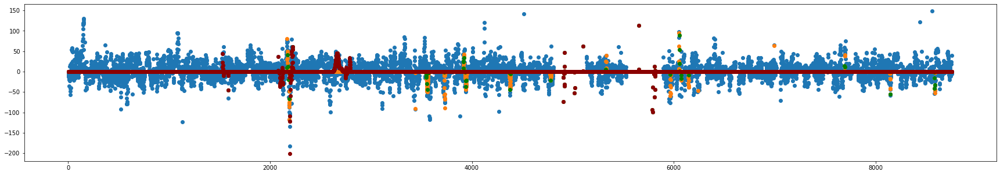

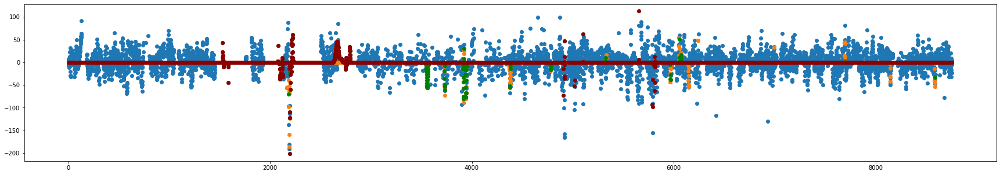

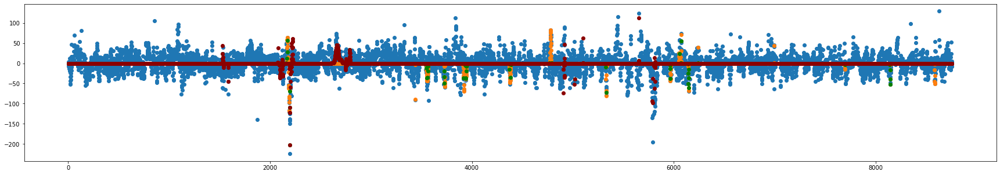

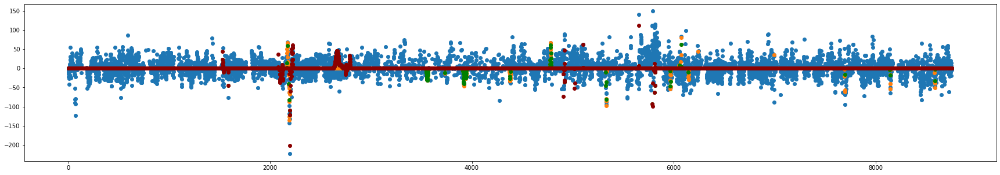

22th additional rbflayer
tensor([[-161.5256, -154.4747, -132.8373,  122.0000,  121.8863,   99.2405,
          -61.8240,  -61.7668,  -61.6579,   61.0677,  203.9999,  155.4018,
          149.1868,  148.3765,  136.2650, -135.3636, -118.9610,  112.6801,
          112.1534, -109.3446,  -67.3774,  -65.0241,  -61.9499,   59.0921,
          -55.6196,   50.7594,  -44.9465,   44.8142,  -44.7492,  -43.7785,
          -47.8825,   34.6620,  -29.9227,   28.6777,   28.4401,  -25.7301,
           24.9773,  -24.0983,  -23.9700,  -23.9078,  -73.7168,  -71.1279,
          -59.6065,   58.1873,  -58.1031,   53.0450,   46.4759,   45.3036,
           44.0000,  -42.8148,  -76.0723,   56.9579,  -41.5888,  -41.2048,
          -37.8034,  -35.1543,  -34.9897,  -34.7147,  -34.5894,   34.4403]],
       device='cuda:0', dtype=torch.float64)
22th additional RBFlayer 0th epoch loss: 16.84484104690784
22th additional RBFlayer 999th epoch MSE Loss: 15.908914677583
22th additional RBFlayer 1999th epoch MSE Loss: 15.71366

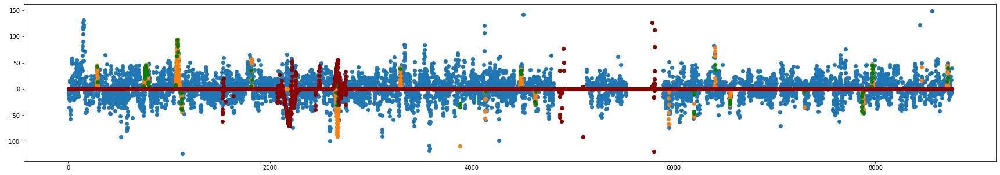

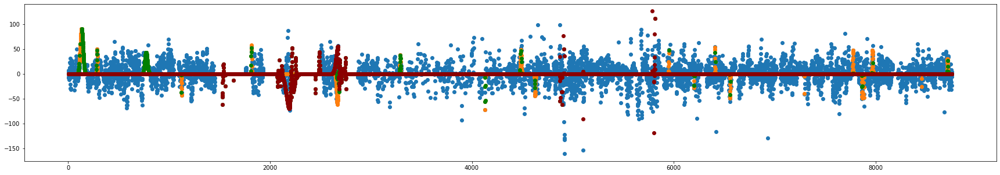

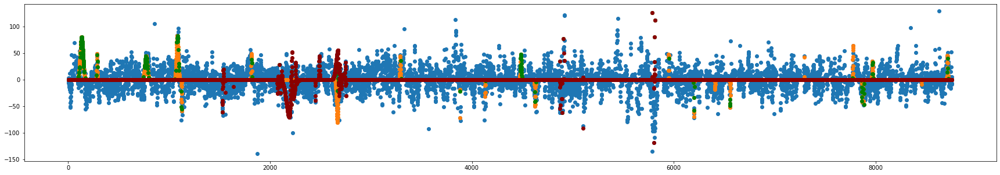

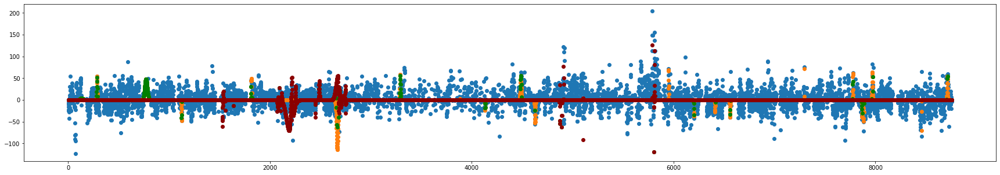

23th additional rbflayer
tensor([[-162.1721, -157.4434, -146.9876, -129.2604,  121.1626,   79.6123,
           64.3890,  -62.8260,   62.4229,  -61.9308,  193.5025, -137.5008,
         -135.3636, -126.5002, -116.2095, -112.7982, -105.4963,  104.6982,
         -103.5035,  103.2339,   83.4898,  -54.1471,  -52.3218,   47.0027,
          -44.9463,  -43.4814,  -42.0221,  -40.6935,  -40.4892,   40.3197,
           52.7862,   43.4838,   41.5139,  -39.2562,  -34.1128,   29.9672,
           28.1282,   25.7964,  -23.4941,  -23.3329,   89.1255,   81.1742,
           80.1028,   77.4142,   73.8852,   67.6569,   67.5054,   66.4866,
           63.7630,   63.7452,   50.7864,   46.3697,   41.3439,   39.3515,
          -38.2136,  -37.3977,  -37.3932,  -35.9006,  -35.1168,   34.7046]],
       device='cuda:0', dtype=torch.float64)
23th additional RBFlayer 0th epoch loss: 17.016594826577588
23th additional RBFlayer 999th epoch MSE Loss: 15.711595765905875
23th additional RBFlayer 1999th epoch MSE Loss: 15.5

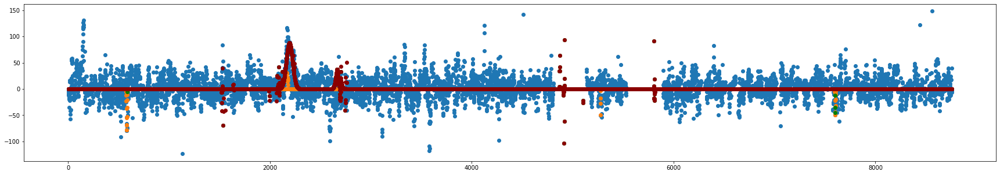

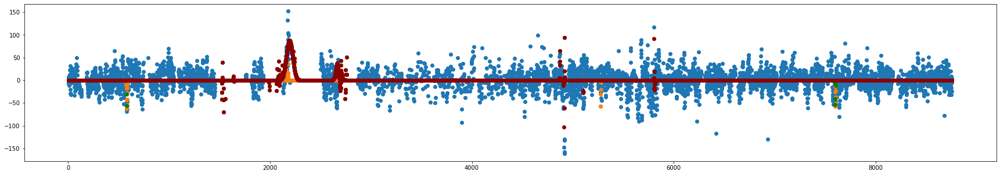

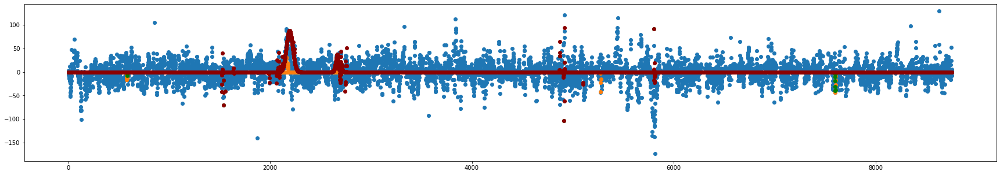

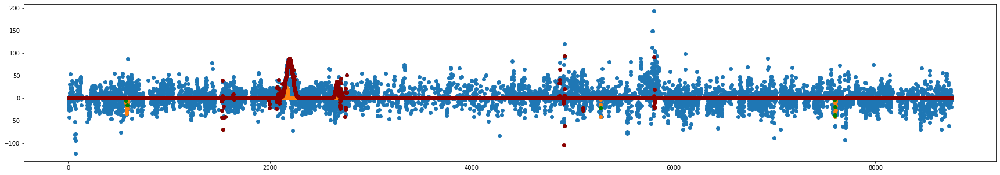

24th additional rbflayer
tensor([[-168.7713, -160.4943, -119.5855,  107.6965,  101.4068,   86.5220,
          -80.8779,  -64.6668,  -61.9164,   61.6554, -165.2126,  149.3422,
          149.1868,  148.3764, -135.3636, -126.5002, -124.5590, -118.5656,
          109.7744, -108.9218,   83.1523,   56.2124,  -52.8360,   47.9832,
           44.8142,   44.1442,  -43.5439,  -40.4892,  -38.8412,   37.0837,
          -49.1614,   42.5204,  -38.6362,   36.4668,  -35.3677,  -34.0476,
          -32.5747,   27.6484,  -25.0050,  -23.4305, -127.9124, -125.6931,
         -125.1542, -119.9727,  -98.8645,  -93.6301,  -93.2394,  -92.4753,
          -91.1506,  -87.6648,  -55.0915,  -53.7376,  -48.8392,  -40.4753,
          -40.1424,  -39.1383,   37.3826,  -36.5442,  -35.9024,  -35.6289]],
       device='cuda:0', dtype=torch.float64)
24th additional RBFlayer 0th epoch loss: 16.28587005761845
24th additional RBFlayer 999th epoch MSE Loss: 15.405527240071745
24th additional RBFlayer 1999th epoch MSE Loss: 15.28

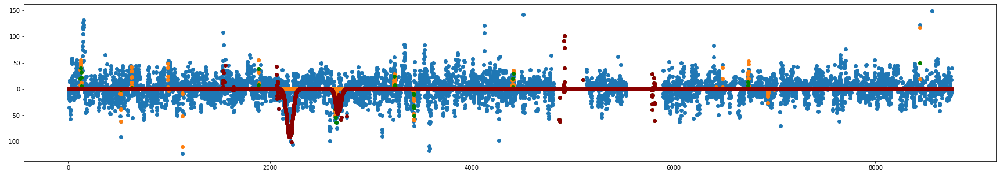

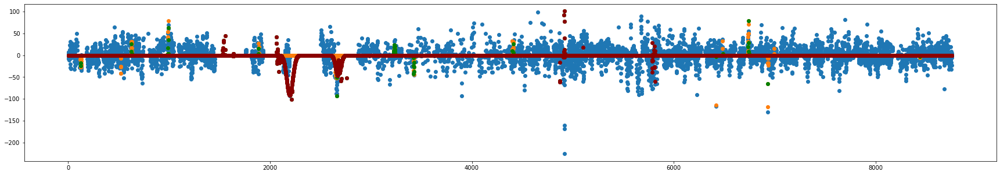

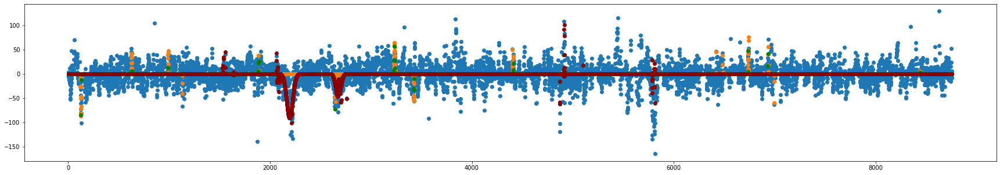

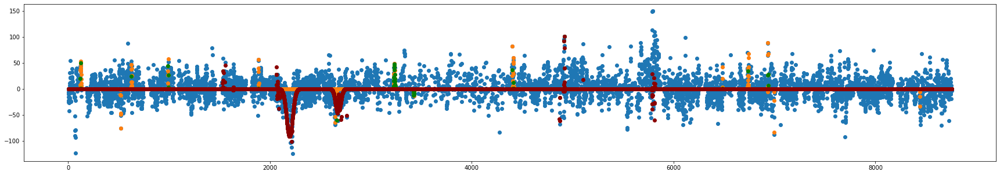

25th additional rbflayer
tensor([[-327.3714, -163.8719, -156.8183, -145.7785, -135.0424,  -97.6369,
           92.1356,   82.5871,   66.5100,   60.5947,  150.6704,  141.7526,
         -119.6874,  117.0215,  112.0340,  111.2731, -111.2490, -104.1390,
         -102.8569, -101.4520,  -69.0616,   52.8245,   44.8142,   44.5766,
           44.1355,   42.2996,  -41.1873,  -40.5383,  -40.4892,  -38.5924,
          -52.8021,   49.0689,   39.3146,   24.8771,   24.2346,  -23.9891,
           23.7152,  -23.3056,  -23.2966,   22.9850,   93.0286,   85.4107,
           84.3971,   84.2380,  -76.0537,   72.1345,   71.9947,   66.6777,
           66.0976,   64.5385,   58.3228,   55.7696,   55.1663,   54.2456,
           52.1605,   48.8259,   48.0589,   47.9480,   47.8666,   43.8815]],
       device='cuda:0', dtype=torch.float64)
25th additional RBFlayer 0th epoch loss: 16.529647170557727
25th additional RBFlayer 999th epoch MSE Loss: 15.196559613555895
25th additional RBFlayer 1999th epoch MSE Loss: 15.0

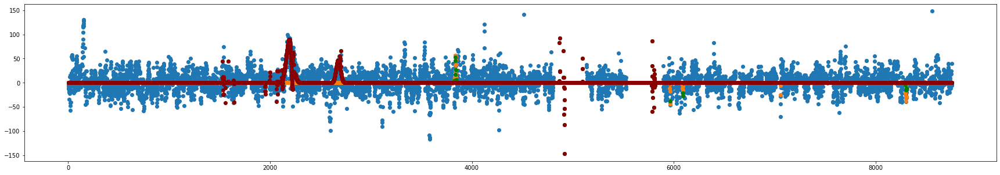

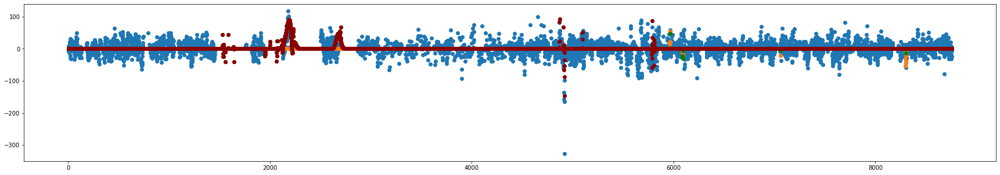

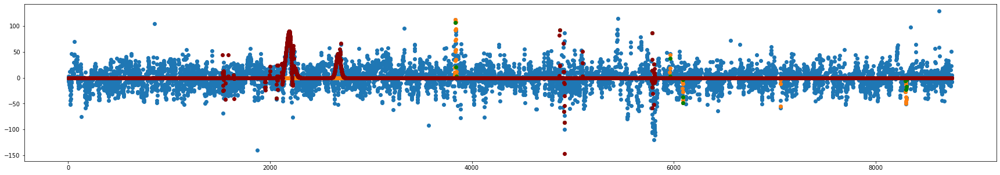

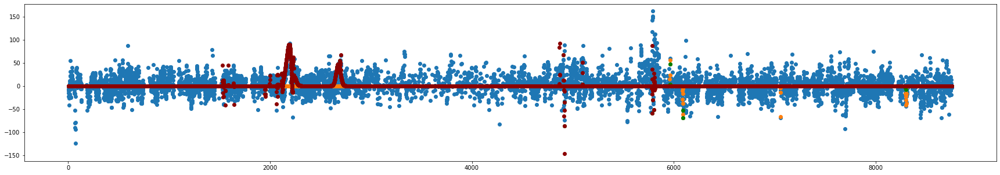

26th additional rbflayer
tensor([[-180.1058, -156.8178, -128.6705, -127.3027, -126.7695,  -97.8039,
           86.4461,   81.5000,   76.7392,  -73.6026,  176.9835, -173.6102,
          161.1826, -141.5644, -111.0148,  110.3843,  110.0120, -108.6286,
         -107.1685, -103.5044,  -75.9311,   64.2312,  -63.0712,   56.3254,
           55.9825,  -54.0277,   52.5226,   45.2651,   42.2996,   42.2988,
          -54.3314,  -45.7543,   45.4321,   42.7233,  -34.2286,  -26.9490,
          -26.5493,   26.1712,   25.5653,   25.2351, -106.5592,  -90.1220,
          -64.5906,  -58.9264,  -57.4702,  -55.9972,  -55.9790,  -53.4211,
          -53.3765,  -52.6315,  -67.9270,  -55.7083,  -53.3696,  -46.6509,
           46.4577,  -44.8914,  -43.7644,  -43.3648,  -43.0184,  -39.9441]],
       device='cuda:0', dtype=torch.float64)
26th additional RBFlayer 0th epoch loss: 15.932940691614865
26th additional RBFlayer 999th epoch MSE Loss: 15.064730431517315
26th additional RBFlayer 1999th epoch MSE Loss: 14.9

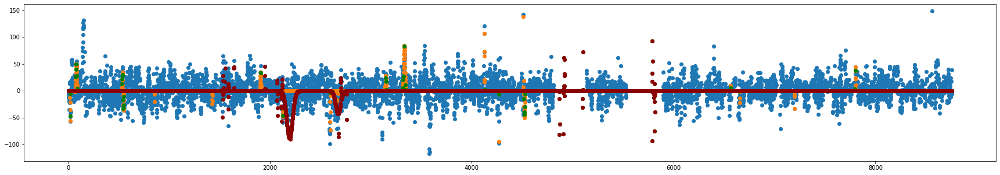

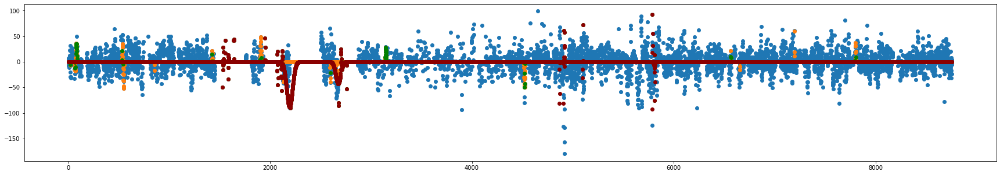

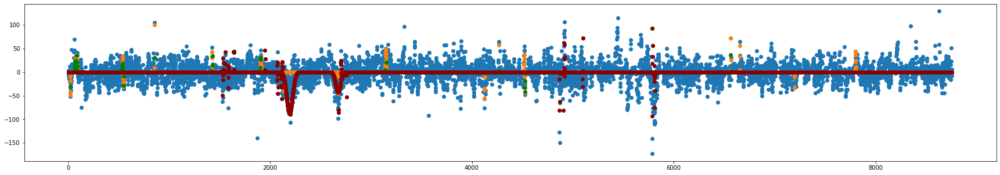

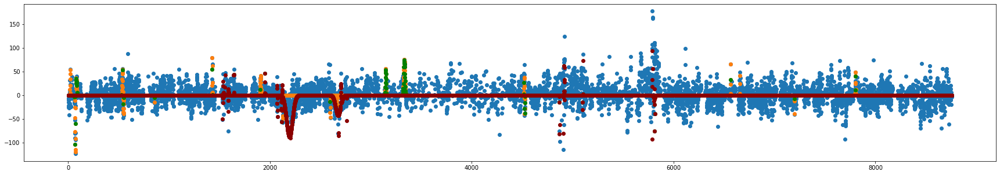

27th additional rbflayer
tensor([[-170.5490, -158.6666, -150.0874,   91.4059,   73.0302,   68.2111,
           62.0840,  -61.1346,  -59.5221,   59.1280,  164.1991,  144.8479,
         -141.6931, -140.2816,  136.3822,  123.5631,  119.1208, -116.8471,
          116.5531,  114.0141,  -81.2787,   69.3586,   53.1702,   50.9098,
          -48.8578,  -46.6008,   43.4780,  -42.3614,  -41.8912,  -40.4743,
           60.6389,  -49.2121,   45.8692,  -38.8912,  -32.7222,   31.8011,
           26.3133,   25.0662,   24.7953,   24.1227,   92.6854,   90.3922,
           90.0518,   89.4362,   88.2344,   88.0661,   87.5129,   85.7823,
           85.7162,   82.8307,   87.5586,  -58.5480,   55.2273,   51.7585,
           50.9206,   48.3160,   47.5405,  -46.6711,   46.3102,   43.5448]],
       device='cuda:0', dtype=torch.float64)
27th additional RBFlayer 0th epoch loss: 15.809401629956124
27th additional RBFlayer 999th epoch MSE Loss: 14.360450648279734
27th additional RBFlayer 1999th epoch MSE Loss: 14.3

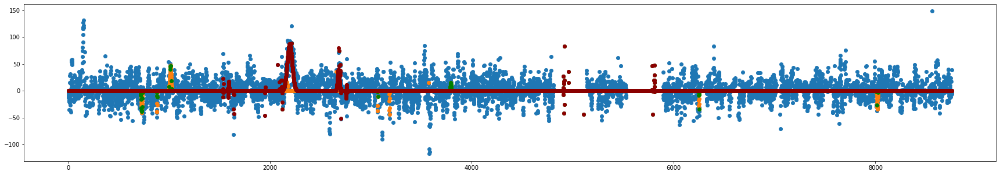

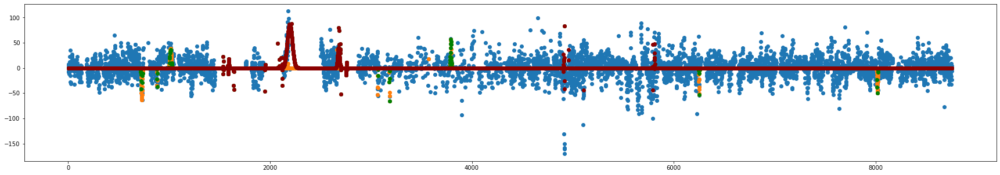

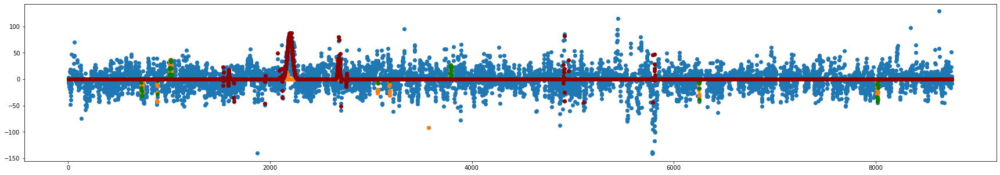

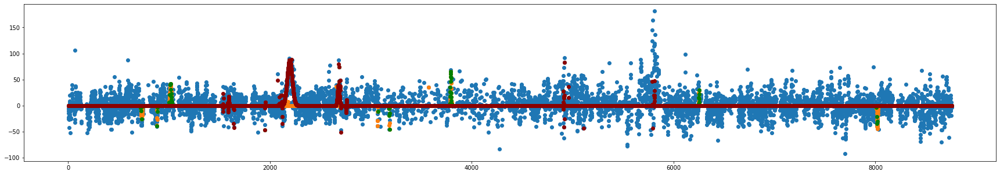

28th additional rbflayer
tensor([[-243.3408, -190.2068,  126.9560, -112.6996,  -87.3797,  -79.3307,
          -73.2505,   68.2111,  -67.0736,   64.3030,  165.9871,  165.0427,
          149.7262, -141.6931, -141.6102,  136.0386,  121.3110, -118.0821,
         -115.1898, -108.5000,  -60.4936,   51.3065,  -46.1663,  -43.4223,
          -42.3595,  -39.9548,  -36.3252,   35.6622,   35.1981,   34.3145,
           64.5201,   34.0313,   26.8429,  -26.8202,  -23.3211,   23.2544,
          -23.1468,  -22.9824,   22.7818,   22.4831,  -99.0230,  -89.3025,
          -71.0411,  -56.8310,  -55.4285,   53.2080,  -52.9851,  -50.8510,
          -49.4781,  -47.9131,  -89.6216,  -64.6356,  -57.1797,   48.0929,
          -46.7539,  -42.2740,  -39.9908,   39.8603,   38.6219,  -38.6156]],
       device='cuda:0', dtype=torch.float64)
28th additional RBFlayer 0th epoch loss: 15.272101736564098
28th additional RBFlayer 999th epoch MSE Loss: 13.866348971254578
28th additional RBFlayer 1999th epoch MSE Loss: 13.7

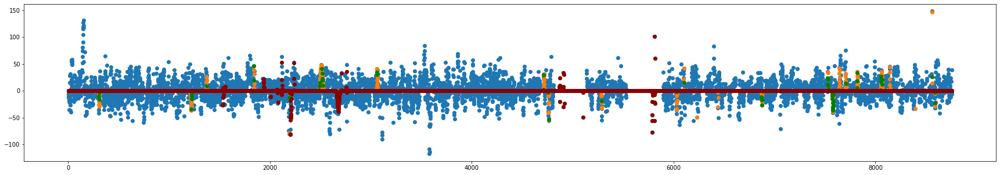

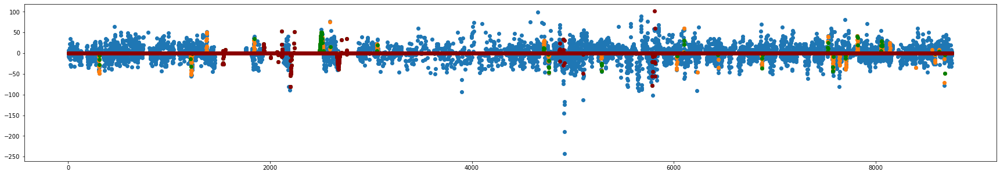

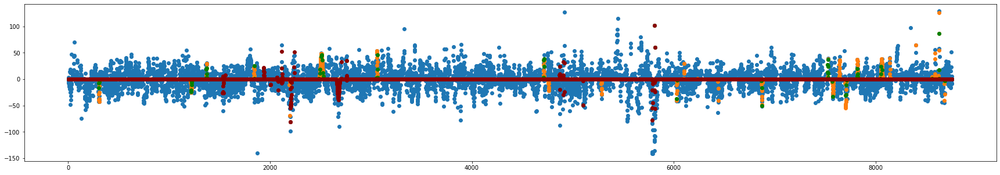

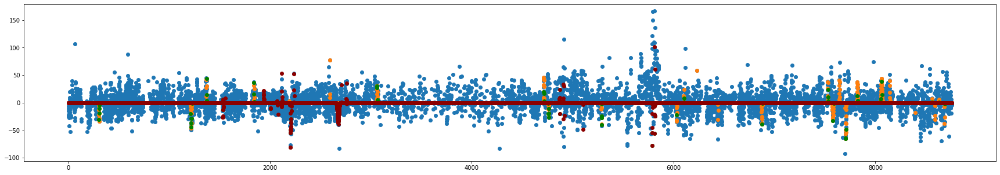

29th additional rbflayer
tensor([[-219.7456, -190.1643, -147.3576, -145.4849, -124.4894,  -79.3314,
          -70.2050,  -69.7776,  -67.3062,   63.1621,  165.7483,  164.2464,
          157.9575,  139.8900, -135.5327, -128.4856, -128.3097,  126.6994,
          122.6558, -118.0821,   71.9730,   70.7930,   49.1766,  -46.6711,
          -43.4223,  -42.3595,  -40.9707,  -39.7666,   36.7263,   35.6457,
           43.1286,   24.6559,   23.7896,   23.2544,   22.5897,   22.3891,
          -22.3470,  -22.3233,   22.1752,  -21.8298,  -57.4781,  -55.4256,
          -54.7402,   47.4157,  -46.9890,   43.8041,  -41.9392,  -41.2266,
          -41.0206,   40.9513,  -68.9586,   40.9256,   39.9396,   38.6219,
           37.9362,   37.2360,   37.2049,   35.5500,  -34.9499,  -33.8551]],
       device='cuda:0', dtype=torch.float64)
29th additional RBFlayer 0th epoch loss: 14.33152126628813
29th additional RBFlayer 999th epoch MSE Loss: 13.526426540958376
29th additional RBFlayer 1999th epoch MSE Loss: 13.47

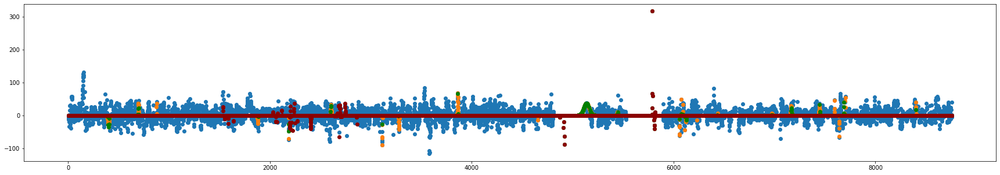

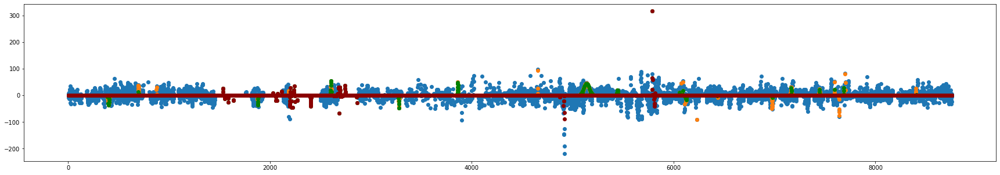

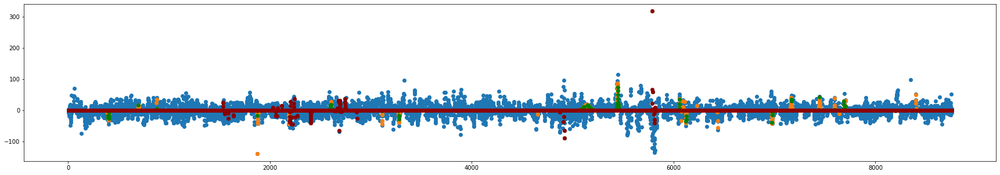

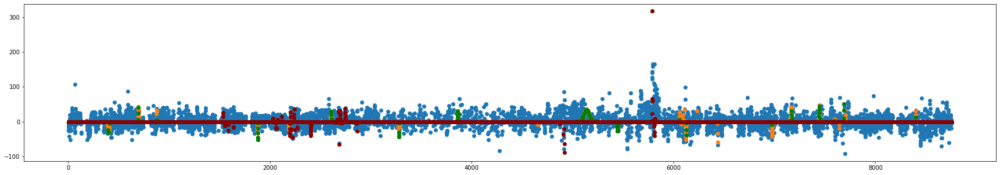

30th additional rbflayer
tensor([[-146.2715, -145.4847, -131.4737,  127.2818, -123.8788,  113.4189,
          -83.1804,  -79.8661,   70.3334,  -70.2050, -413.8249,  164.6573,
          160.8803, -146.6556, -134.1508,  126.6993, -126.0324,  120.8277,
          114.3616,  112.1258,   71.5394,   60.7551,  -60.5954,   49.1764,
           47.1923,  -46.0000,  -43.4223,  -40.9677,   40.5206,   36.7263,
           23.7896,   22.9390,  -22.3233,   21.6804,   21.6428,  -21.3009,
          -21.1853,  -21.0779,   21.0148,  -20.9766,  -87.0636,   63.6643,
           47.3363,   43.4311,  -42.0106,   41.0803,  -39.1815,   38.6789,
           37.7257,   37.3585,  -61.9053,  -44.5891,  -42.1891,  -41.1868,
           40.9261,   32.8719,   32.4545,  -31.8539,  -31.8158,   30.7013]],
       device='cuda:0', dtype=torch.float64)
30th additional RBFlayer 0th epoch loss: 14.522253102554188
30th additional RBFlayer 999th epoch MSE Loss: 13.074969903345096
30th additional RBFlayer 1999th epoch MSE Loss: 12.9

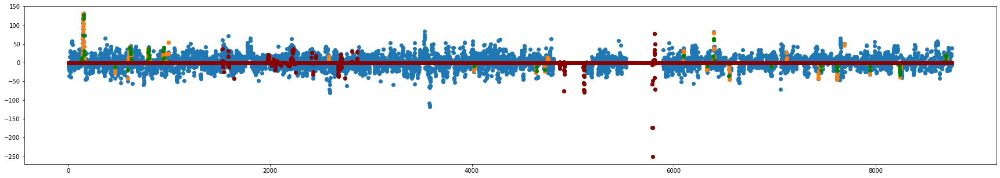

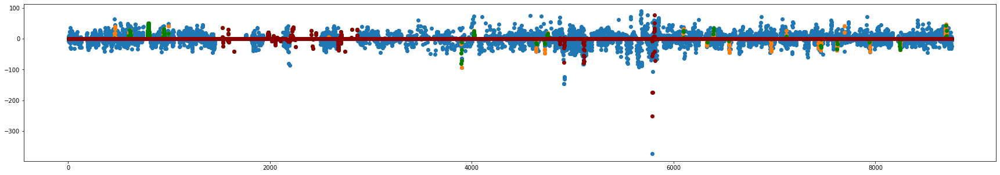

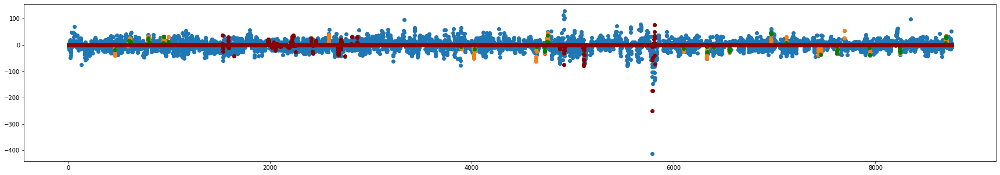

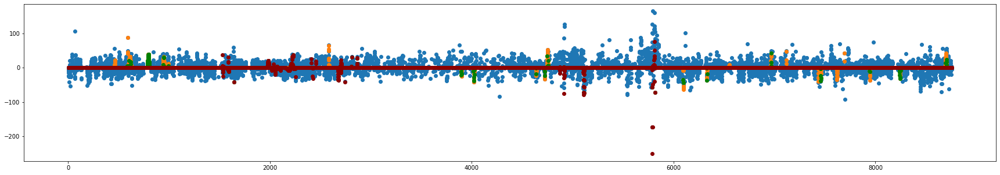

31th additional rbflayer
tensor([[ 132.8456,  128.3068, -126.3000,  113.3679, -100.5932,  -83.1188,
           81.5000,  -79.9567,  -67.1930,  -63.9319,  274.6800,  212.9832,
         -162.5090,  149.7195, -139.8253, -139.3528, -126.4304,  117.4910,
          110.8166,  106.8042,   73.6160,   59.6859,  -55.6398,   50.4116,
          -49.7937,   47.1923,   40.5206,  -36.3108,   34.9810,  -34.7989,
           43.2008,   21.6806,   21.2063,   21.1849,   20.7193,   20.2382,
          -20.2314,  -20.0938,  -20.0394,  -20.0091,  -80.3366,   51.9345,
           44.9624,   40.0706,  -38.3254,   37.3058,   36.7584,   36.6713,
          -36.3865,  -35.8767,   69.4980,  -61.9053,   49.7815,   41.9221,
           40.9261,  -34.8644,  -27.6195,  -26.6812,   25.2726,   24.8827]],
       device='cuda:0', dtype=torch.float64)
31th additional RBFlayer 0th epoch loss: 14.200202623447675
31th additional RBFlayer 999th epoch MSE Loss: 12.558656765409818
31th additional RBFlayer 1999th epoch MSE Loss: 12.5

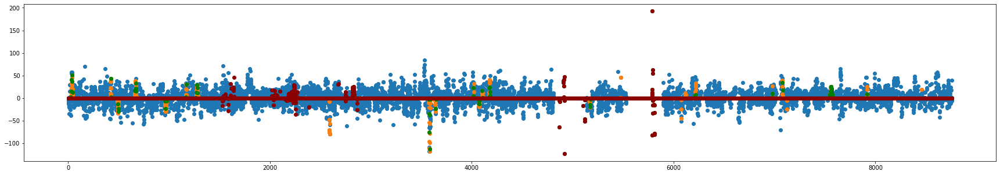

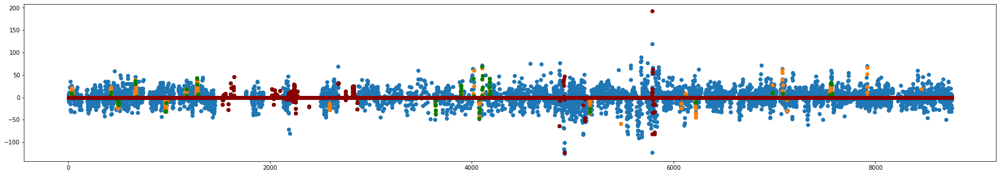

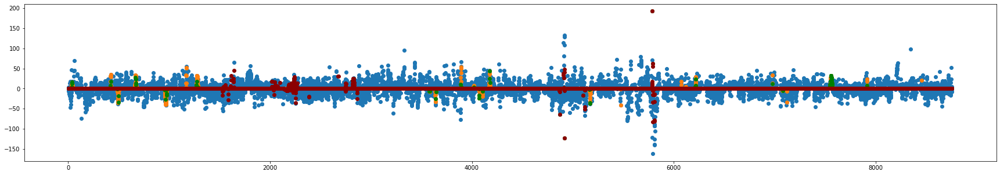

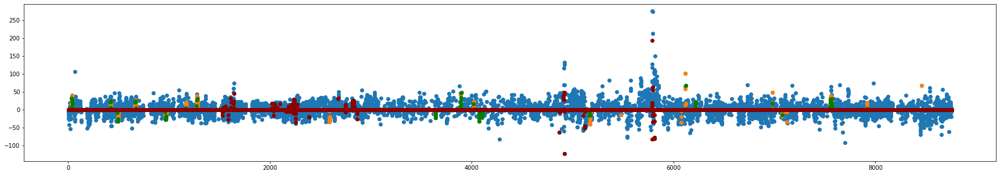

32th additional rbflayer
tensor([[ 249.3069, -168.8409, -156.9582,  123.2652, -101.5136,  -96.1199,
          -95.8100,  -79.9567,   76.7247,   65.8403,  210.4207,  159.6539,
          158.5085,  149.7196, -133.9442,  125.5069,  122.3264, -121.7431,
         -111.9539,  110.8365,   72.8621,   56.4947,  -49.0000,  -46.9072,
           46.8294,  -46.7878,  -43.8859,   40.5269,   36.5283,  -34.6647,
          -23.3029,   21.0067,  -20.6913,  -20.2314,   20.1535,  -20.0940,
          -20.0390,   19.6717,  -19.6260,  -19.5063,  -86.5066,  -46.2628,
           43.6964,  -40.8038,  -40.6333,   38.7124,  -37.0109,   36.8979,
          -36.3993,   35.4167,   41.8580,  -40.6742,   39.0285,   37.0001,
           35.2170,   31.8451,   30.0949,  -26.9555,  -26.7520,  -26.4155]],
       device='cuda:0', dtype=torch.float64)
32th additional RBFlayer 0th epoch loss: 13.682001016816024
32th additional RBFlayer 999th epoch MSE Loss: 12.221575595137779
32th additional RBFlayer 1999th epoch MSE Loss: 12.1

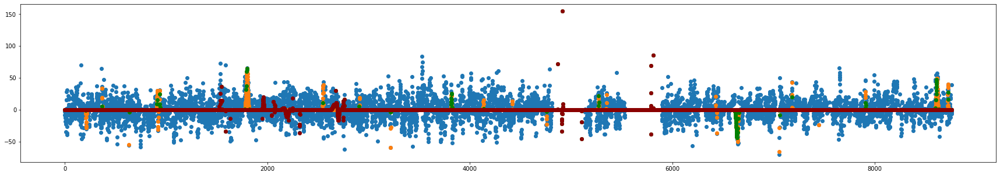

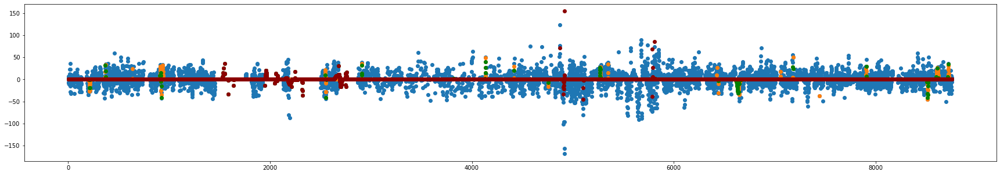

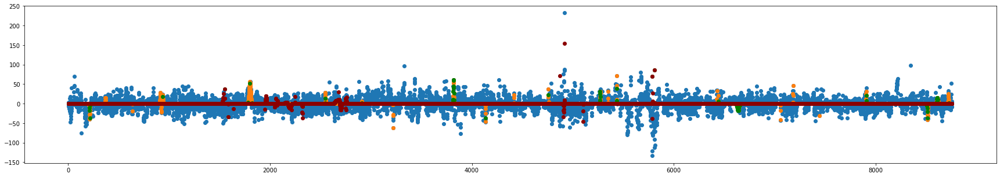

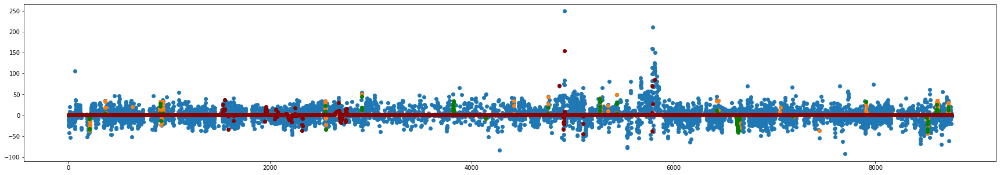

33th additional rbflayer
tensor([[-171.4086, -158.8877, -157.3060,  -96.1320,   87.3358,   80.4056,
           76.7247,   72.0585,   68.5677,  -67.5096,  183.8597,  158.3609,
          153.1899, -144.0915, -133.9448,  122.3264,  120.6991,  117.3200,
         -113.9661, -111.9539,  103.7655,  -59.3083,   47.3333,  -46.6667,
          -45.1706,  -43.8859,  -42.0297,  -35.4607,  -34.2687,   34.1080,
           43.2003,  -24.8641,  -23.7960,   23.7698,   21.6806,  -21.3775,
          -20.2314,  -20.0401,  -19.4731,  -19.4079,  -75.4051,   54.6553,
          -47.1851,  -46.0333,   44.7970,   40.5577,  -38.2659,  -37.2771,
           37.0035,  -36.9693,  -78.1757,  -39.3483,   39.0755,  -36.2251,
           34.8829,   31.8451,   29.4948,   28.7700,   28.1260,   26.6308]],
       device='cuda:0', dtype=torch.float64)
33th additional RBFlayer 0th epoch loss: 13.342357135639258
33th additional RBFlayer 999th epoch MSE Loss: 11.965605623831234
33th additional RBFlayer 1999th epoch MSE Loss: 11.9

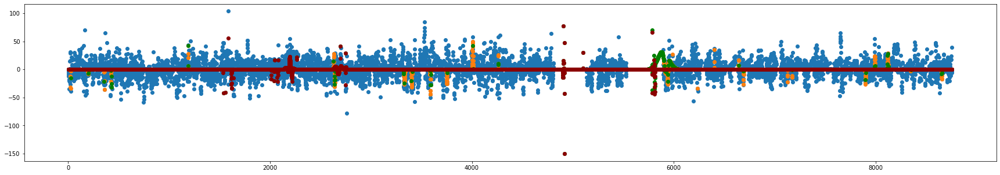

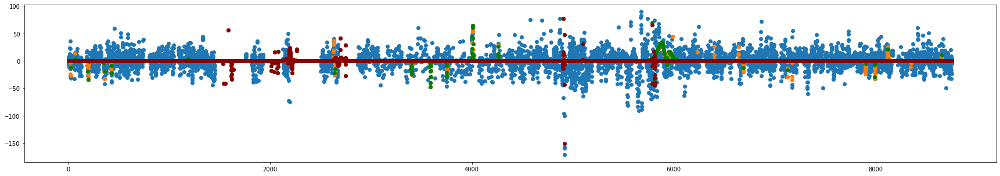

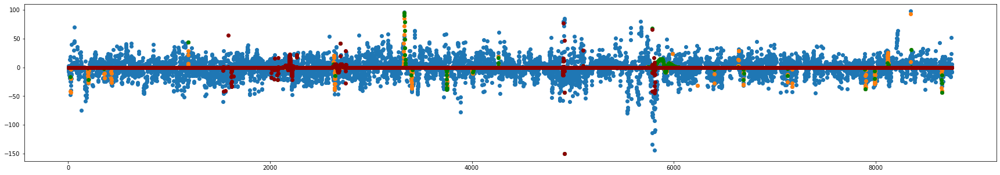

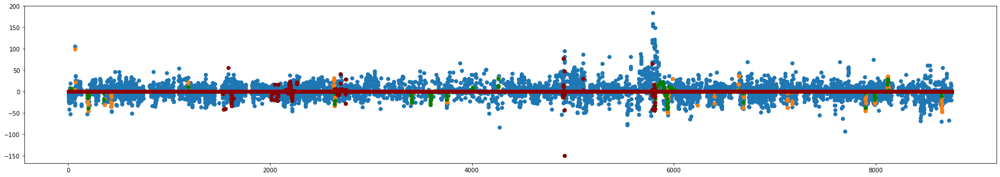

34th additional rbflayer
tensor([[ 245.1893, -152.9512, -147.7747, -127.9025, -116.0865,  -94.4719,
          -83.2622,   76.7247,  -67.4341,  -64.8301,  175.8376,  167.2702,
          154.7217,  147.5660,  141.0186, -140.4390,  137.9664, -135.3976,
          118.6067,  110.5669,   88.3926,   65.6349,  -53.7477,   47.0541,
           47.0000,  -46.9072,  -43.8859,  -34.0817,   33.9357,  -33.4731,
           37.0907,   34.9251,  -29.4917,   26.1052,   23.6877,  -20.0419,
           19.9475,  -19.4273,   19.2792,   19.1760,  -98.3583,   52.3269,
          -44.6681,  -40.9126,   37.7429,  -36.9931,  -35.3071,  -34.8403,
           34.5984,  -34.4615,  -78.1779,  -57.3008,  -40.5475,   37.5610,
          -33.6580,   33.0158,  -32.5152,   32.0055,   28.7898,  -28.3560]],
       device='cuda:0', dtype=torch.float64)
34th additional RBFlayer 0th epoch loss: 13.32864919355027
34th additional RBFlayer 999th epoch MSE Loss: 11.718595888899829
34th additional RBFlayer 1999th epoch MSE Loss: 11.66

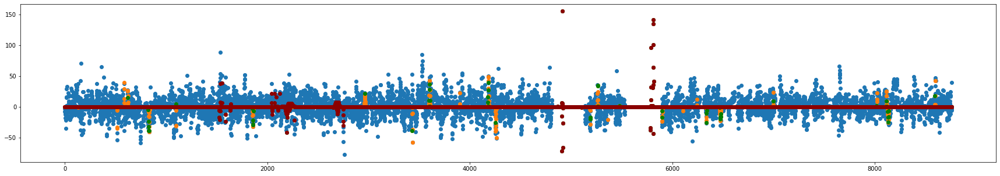

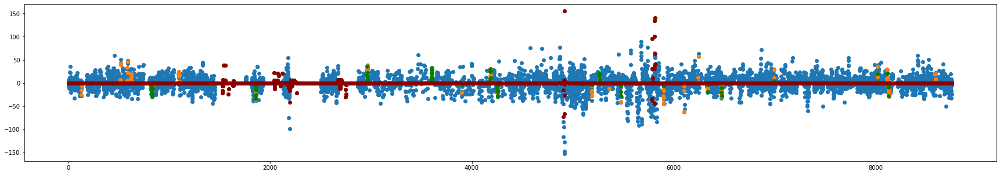

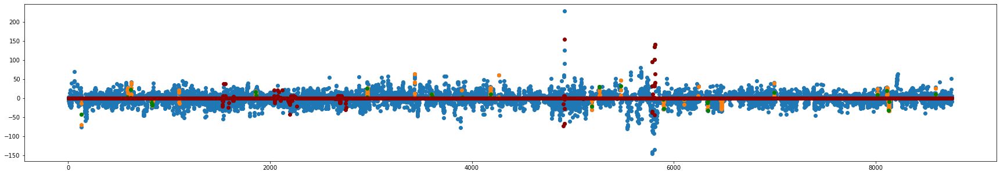

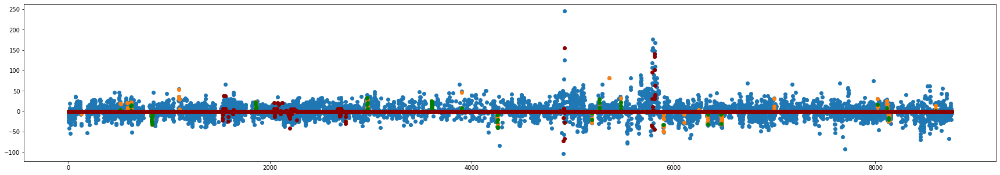

35th additional rbflayer
tensor([[-161.7651, -128.1609,  -97.1558,   87.2399,   85.3983,   76.7247,
           75.1678,  -67.4873,  -65.8403,   64.8869, -214.6402, -187.0540,
         -180.2158, -174.0570,  165.0746,  154.3390,  148.2805, -145.9917,
         -140.4383, -105.7949,   71.5569,   61.6394,  -60.4477,   46.3985,
          -45.4887,   42.5135,  -41.3214,  -39.5599,  -35.5870,   35.4745,
          -28.9588,   26.1052,  -25.2635,  -24.4594,  -24.2185,   22.8347,
          -19.1685,  -19.0961,  -18.8306,   18.6145,   56.7560,  -56.4901,
           44.5452,  -41.1244,   38.1613,  -37.7357,   37.2622,  -36.3830,
          -36.3326,  -35.3622,   48.4466,  -44.9132,  -34.8402,   31.8451,
          -30.2303,   29.4896,  -27.0000,  -26.7356,  -26.3780,  -25.9754]],
       device='cuda:0', dtype=torch.float64)
35th additional RBFlayer 0th epoch loss: 12.548363942911214
35th additional RBFlayer 999th epoch MSE Loss: 11.468320006138379
35th additional RBFlayer 1999th epoch MSE Loss: 11.4

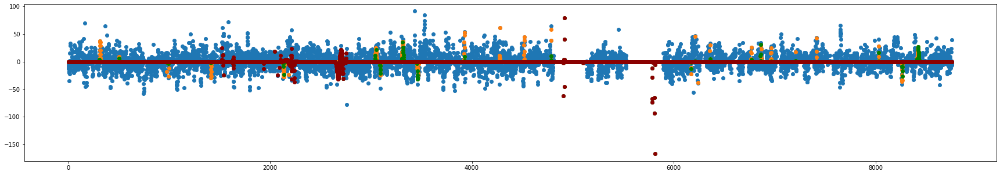

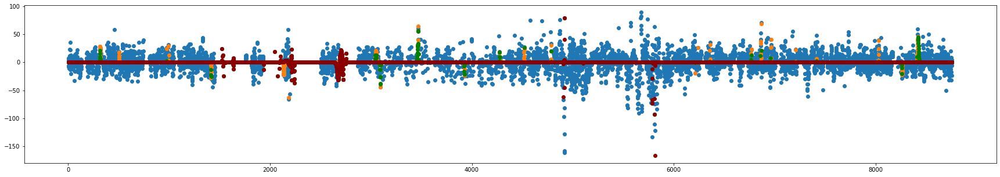

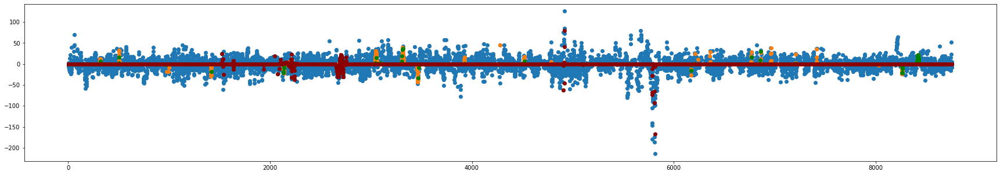

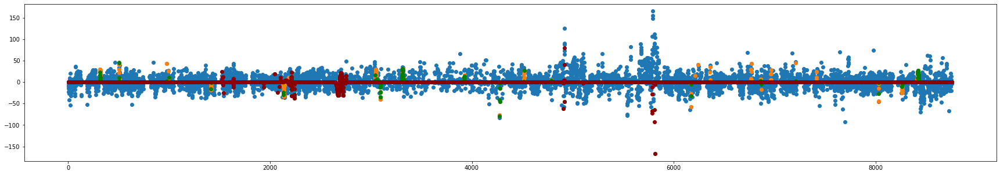

36th additional rbflayer
tensor([[-238.1215,  135.9437,  103.7920,  -97.3411,  -85.9744,   85.3463,
           76.7247,   75.4247,  -65.8403,   64.8566,  167.2875,  165.0750,
          149.7389, -128.4229,  112.7084, -109.2280, -107.0317,   96.9181,
          -92.2732,  -92.2466,   75.6149,   71.5569,   61.6394,  -53.8417,
           48.7503,  -46.9090,  -46.5781,   45.2602,  -44.4021,  -39.5599,
           37.6917,  -35.8980,  -35.4386,   26.1048,  -25.2637,   18.5608,
           18.5218,   18.4440,  -18.2898,   18.2543,  -50.9194,  -41.3296,
          -40.6827,   39.5832,   38.7476,  -36.4426,  -35.4606,  -34.2890,
          -34.1792,   34.1054,  -78.1780,   62.4213,   53.2256,  -43.0426,
           42.0278,   41.4935,  -38.2439,  -36.9283,  -36.1026,  -35.8097]],
       device='cuda:0', dtype=torch.float64)
36th additional RBFlayer 0th epoch loss: 12.360144994020333
36th additional RBFlayer 999th epoch MSE Loss: 11.242003675265394
36th additional RBFlayer 1999th epoch MSE Loss: 11.1

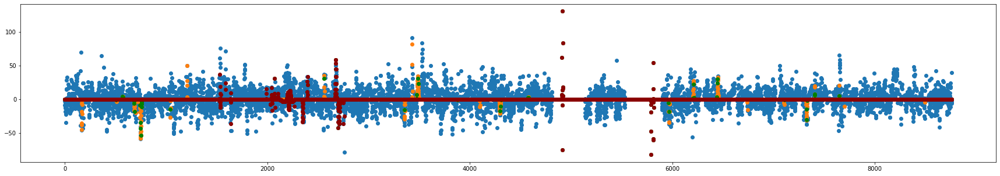

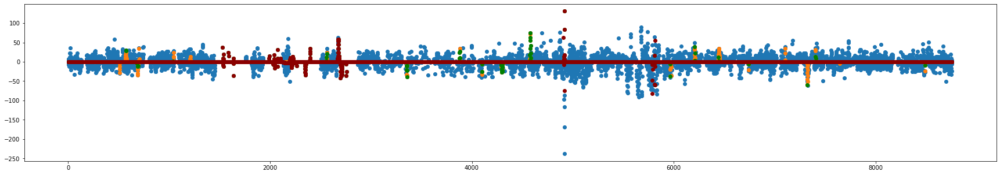

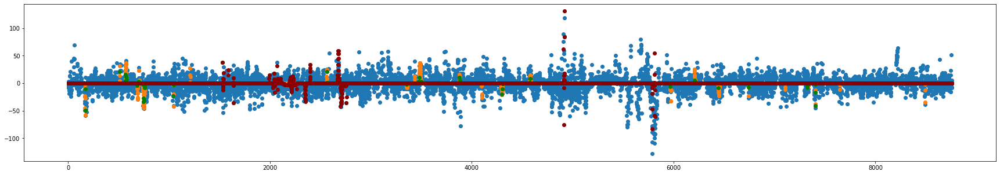

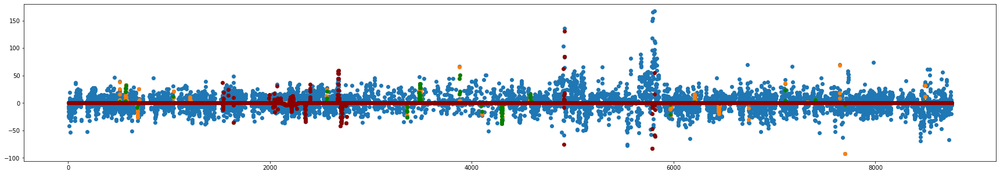

37th additional rbflayer
tensor([[-252.8123, -246.9843, -163.0814, -111.3543,   76.7247,   73.3048,
          -67.6636,   66.9448,  -65.8403,  -64.8301,  178.3012,  169.5683,
          168.9843,  165.4701,  154.4468,  126.6840,  124.6423,  114.8478,
          112.4760,  101.2752,   73.2362,  -62.6580,   59.8855,   56.4899,
          -49.8314,  -46.9090,   39.0712,  -36.1939,   35.0686,  -34.8669,
          -33.6558,  -32.9819,  -31.5751,   26.1052,   20.2482,   19.3749,
          -18.8306,  -18.7759,   17.6968,   17.6218,  -52.5881,   48.5436,
           48.2920,   46.0319,   45.4421,  -40.6018,  -39.0251,  -36.0860,
          -35.1464,   33.9844,  -63.1829,   50.0628,   46.9187,  -40.2006,
           39.1704,   38.1540,  -35.1940,   31.8451,  -27.2337,  -26.5057]],
       device='cuda:0', dtype=torch.float64)
37th additional RBFlayer 0th epoch loss: 12.131404701174205
37th additional RBFlayer 999th epoch MSE Loss: 10.995222586304202
37th additional RBFlayer 1999th epoch MSE Loss: 10.9

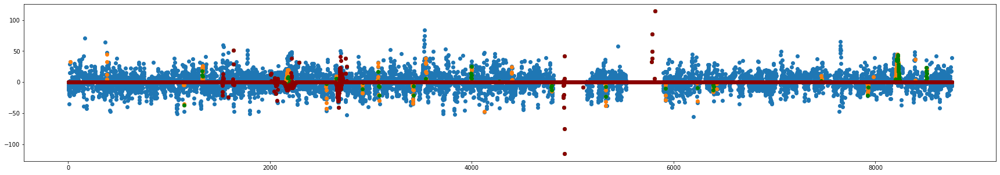

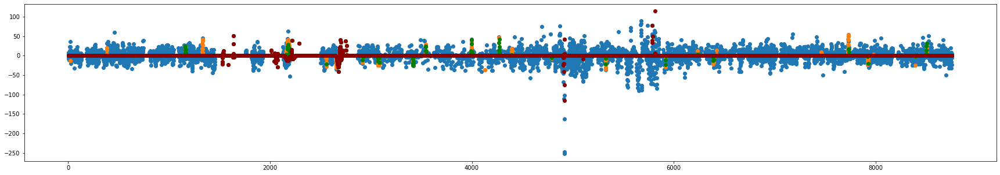

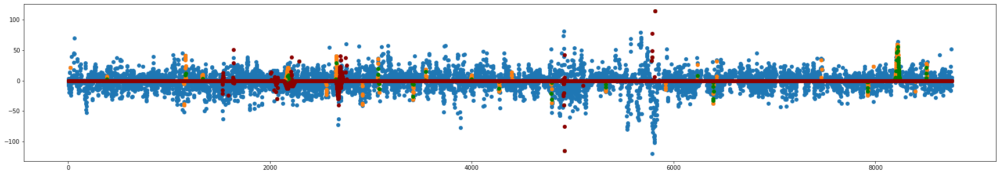

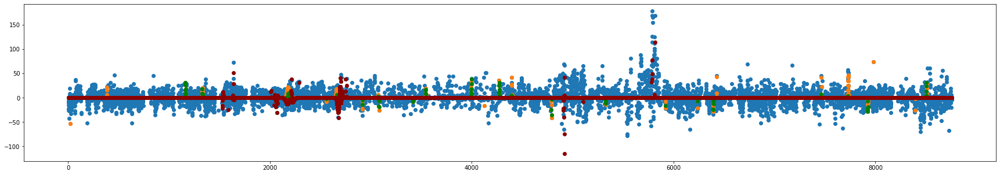

38th additional rbflayer
tensor([[-177.7646, -163.0544, -144.3249, -131.5518, -111.3125,   93.0325,
           76.7247,   66.5221,   65.8403,  -64.8301,  165.4592,  154.4468,
         -146.1063,  126.6823,  124.6423,  119.6954,  114.8478, -108.0075,
         -101.7549,  -99.9065,   71.5000,  -68.2266,  -61.7841,  -61.0081,
           51.0065,   47.1681,   45.7532,  -39.5599,  -36.9160,  -36.1939,
           36.4226,  -35.4382,   26.1014,   25.7087,  -22.9224,  -21.2635,
           19.6232,  -18.5102,  -18.3052,   17.6968,  -60.4838,   56.2909,
           48.5470,   45.8679,  -40.4960,  -36.0499,   35.3368,  -35.1165,
          -33.5621,  -33.4614,  -78.3852,  -69.8058,  -42.7257,  -37.5707,
           36.5107,   33.8036,   33.6961,   31.8451,   31.7551,  -30.6705]],
       device='cuda:0', dtype=torch.float64)
38th additional RBFlayer 0th epoch loss: 11.921668800860584
38th additional RBFlayer 999th epoch MSE Loss: 10.728840432160256
38th additional RBFlayer 1999th epoch MSE Loss: 10.6

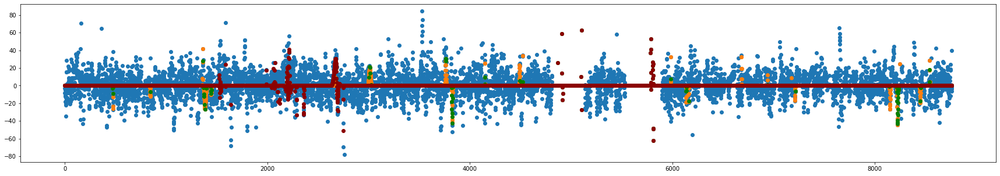

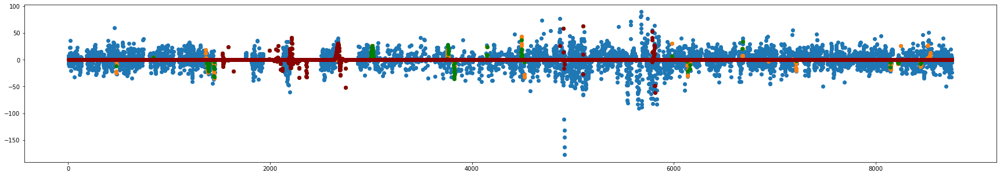

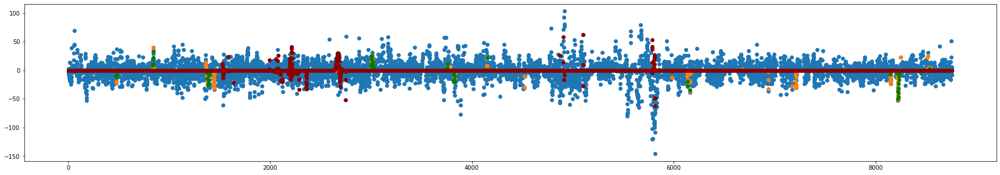

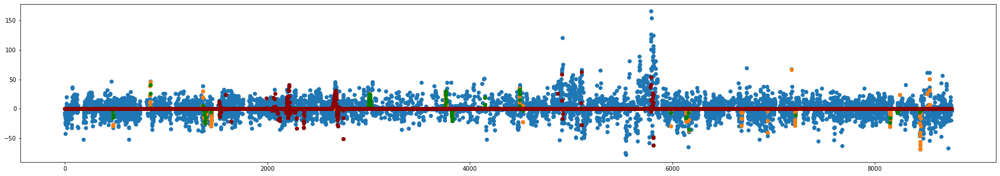

39th additional rbflayer
tensor([[-168.9880, -163.0544, -144.3245, -131.5518, -128.4696, -101.1362,
          -94.9871,   84.5401,   76.7247,  -60.0857,  168.6139,  163.7831,
          154.3411, -134.7894, -126.7294, -122.5034, -110.0028,  105.8185,
          103.8328, -103.1874,  -61.7840,  -58.8340,   47.5667,  -46.8991,
          -46.6658,   45.7761,   44.5295,  -41.3895,  -39.5599,  -36.1734,
          -42.2122,   30.1932,   28.2395,  -25.7380,  -25.4974,   22.9327,
          -21.4014,   19.6232,  -18.8172,  -17.9311,  -75.7106,  -65.2499,
          -58.4423,  -49.6301,  -48.8077,   45.5695,  -40.4892,   36.5912,
          -35.4564,   35.4233,  -78.3852,   59.2113,  -51.0640,  -39.7039,
          -33.0765,   31.8451,   28.1149,  -27.5847,  -26.8339,   26.6081]],
       device='cuda:0', dtype=torch.float64)
39th additional RBFlayer 0th epoch loss: 12.02561043100275
39th additional RBFlayer 999th epoch MSE Loss: 10.42987033356686
39th additional RBFlayer 1999th epoch MSE Loss: 10.376

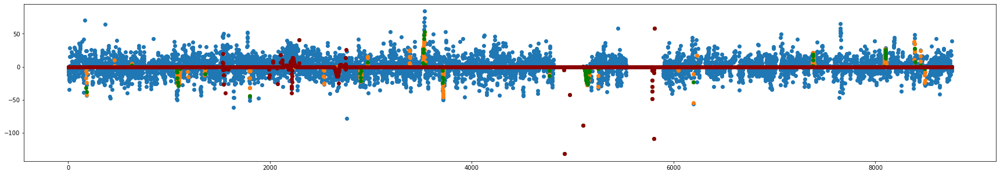

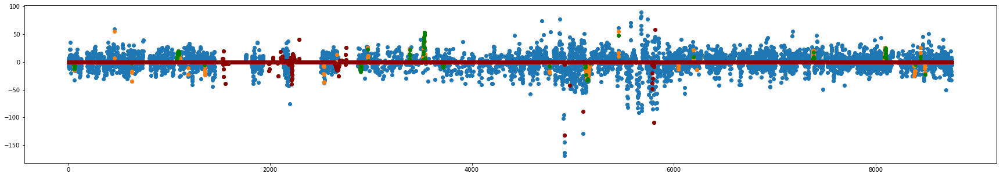

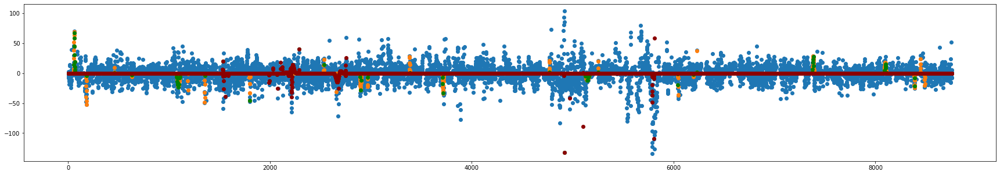

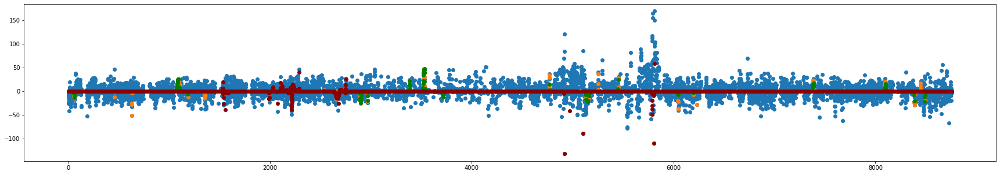

40th additional rbflayer
tensor([[ 235.4284, -168.9880, -158.6667, -144.3245, -101.1362,  -94.9871,
           93.0325,   92.2284,   84.6436,   76.7247,  172.6156,  165.1235,
          160.9150,  154.3502,  150.1224,  146.3659,  125.8846, -111.9882,
          110.3603, -104.9465,   77.2676,  -67.3906,  -61.7840,  -60.4395,
           47.5008,  -46.8991,  -46.6451,   41.7852,  -36.9160,  -36.1464,
          -25.6846,  -25.5265,  -25.4974,  -22.9224,  -21.4450,  -21.4014,
           21.0000,  -20.0242,  -18.5101,   18.1890,  -73.5275,   46.9655,
          -40.5684,   38.3162,  -37.5602,   36.0797,  -35.1334,  -35.0030,
          -33.9392,  -32.8718,  -78.3852,  -61.3787,   33.1749,  -32.0280,
           31.8451,   31.5711,  -28.4966,  -25.7853,   25.7063,  -25.3175]],
       device='cuda:0', dtype=torch.float64)
40th additional RBFlayer 0th epoch loss: 11.752324686413484
40th additional RBFlayer 999th epoch MSE Loss: 10.29484379117571
40th additional RBFlayer 1999th epoch MSE Loss: 10.20

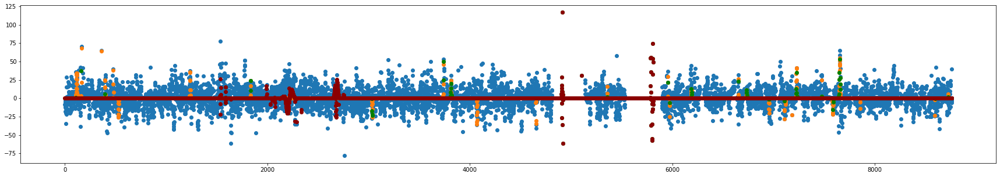

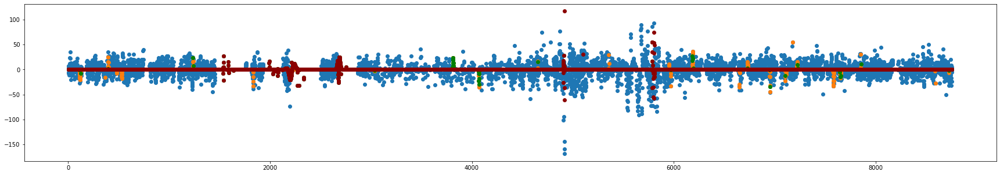

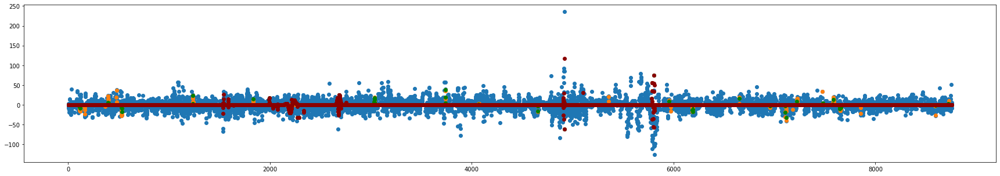

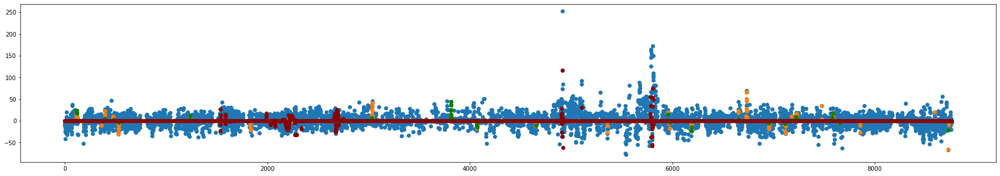

41th additional rbflayer
tensor([[-169.2518,  135.5972,  121.8789,  -93.6797,   86.0348,  -83.0002,
           76.7247,  -74.6003,  -70.1953,   64.4064,  154.4287, -141.2831,
          138.3258, -137.9132, -112.2416,  110.2416,  108.9577,  103.8387,
          100.6275,  -99.6664,  -61.7840,   54.0724,   49.3683,   47.3217,
          -46.8991,   46.7381,  -46.6307,   45.7757,  -41.3320,   37.0512,
          -26.9510,  -26.6347,  -25.6829,   23.7160,  -21.5015,   21.3448,
          -20.0242,  -20.0000,   18.3017,  -18.2365,   58.5503,  -54.8994,
           53.3347,   50.8738,   46.8533,   46.4296,  -45.8146,   39.9865,
           37.7655,   37.4776,   43.1768,  -43.1668,   42.0297,  -36.6636,
          -35.4431,   33.5429,  -33.4069,  -32.6652,  -32.0851,   31.8451]],
       device='cuda:0', dtype=torch.float64)
41th additional RBFlayer 0th epoch loss: 10.975479894701902
41th additional RBFlayer 999th epoch MSE Loss: 10.020975860706631
41th additional RBFlayer 1999th epoch MSE Loss: 9.98

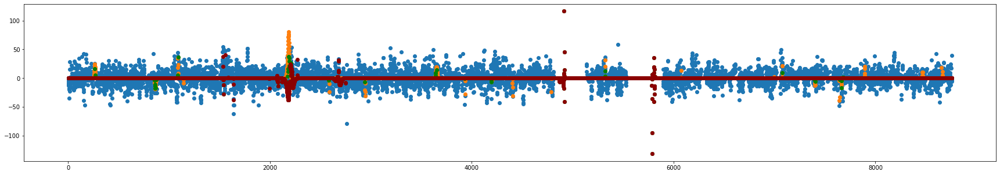

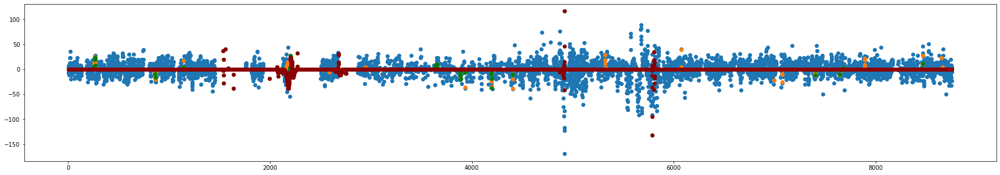

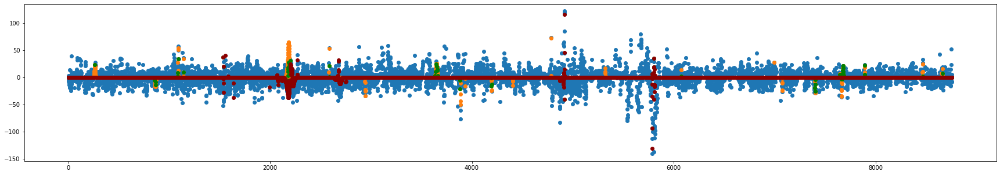

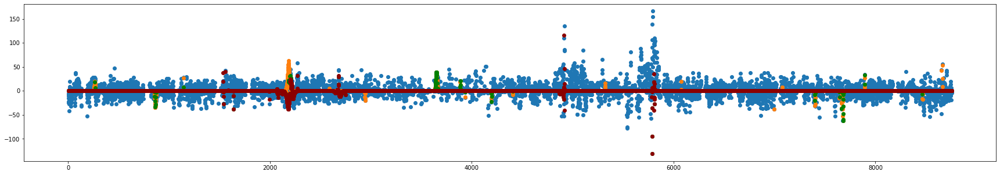

42th additional rbflayer
tensor([[-162.0173, -128.1331,  -97.5565,  -76.6237,   75.1500,  -70.1953,
           68.7880,   65.7277,  -64.6115,   57.1136,  161.8932, -127.0400,
          122.8323, -107.3202,  104.9126, -100.5935, -100.2880,  -98.2566,
          -97.2459,   93.8008,  -90.0352,   78.2557,   47.6667,  -45.9829,
           38.9147,   34.1080,  -33.3763,   32.7127,   32.5419,  -32.4846,
           37.0289,   27.6429,   21.6890,  -20.0242,  -19.9616,   19.3968,
           18.7667,  -18.5101,   18.0732,  -17.6834,  -57.6272,  -42.1324,
          -42.0147,   37.2654,   36.6910,   36.2741,  -35.4098,   32.2072,
          -32.0198,   31.8421,  -78.3852,  -44.0214,   43.0461,  -32.0823,
           28.9829,   25.0750,  -24.6655,  -24.6516,  -24.2077,   23.5743]],
       device='cuda:0', dtype=torch.float64)
42th additional RBFlayer 0th epoch loss: 10.943391097754898
42th additional RBFlayer 999th epoch MSE Loss: 9.880602410677529
42th additional RBFlayer 1999th epoch MSE Loss: 9.834

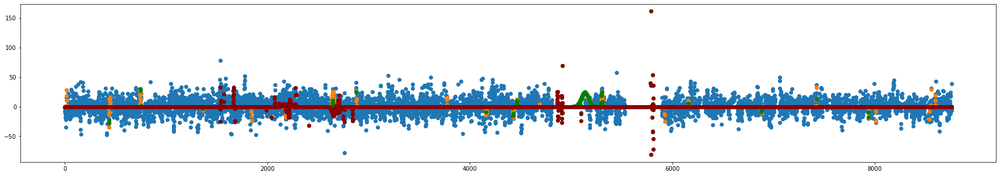

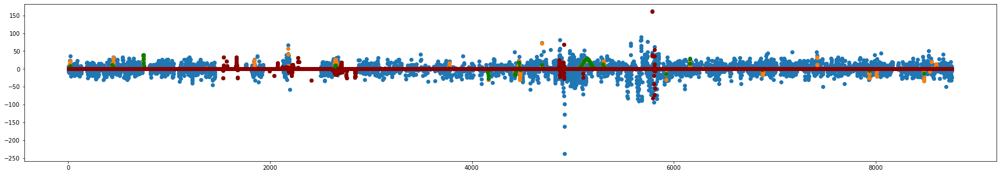

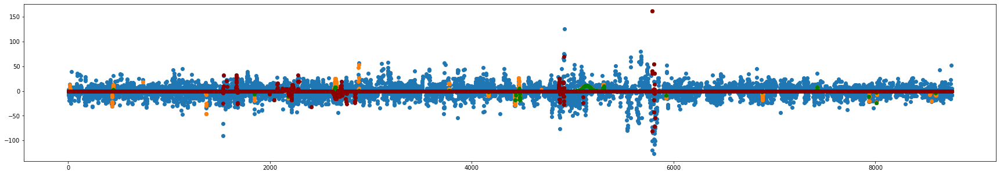

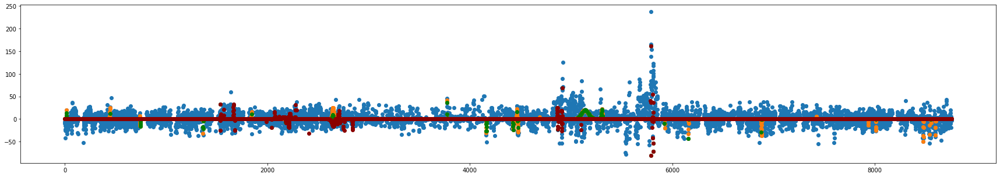

43th additional rbflayer
tensor([[-240.2142, -161.8582, -145.0462, -128.0946,   97.9579,  -97.5486,
          -87.5956,  -82.9684,   76.4835,   73.4973,  219.7355,  190.0322,
         -171.3064,  165.9812,  154.4287,  119.2193, -118.7724,  112.8838,
         -101.4846,  -99.9338,  -64.8953,   59.8385,   47.6667,  -46.3281,
          -45.9829,   45.7757,   37.0512,  -36.1417,   34.1080,   32.7782,
           33.8586,   27.9674,  -23.9154,   21.5633,   21.4535,  -20.0242,
          -19.9471,  -18.2286,   18.1332,  -17.3348,   53.1489,  -49.4919,
          -42.1807,   41.9410,  -40.5789,   40.1473,  -35.4277,  -34.8867,
           32.2072,  -32.0134,   48.9783,   40.2044,   39.1576,  -36.4566,
           31.3507,   29.8076,  -26.7366,  -24.4483,   23.4030,  -23.1549]],
       device='cuda:0', dtype=torch.float64)
43th additional RBFlayer 0th epoch loss: 10.741544895226065
43th additional RBFlayer 999th epoch MSE Loss: 9.713764307373024
43th additional RBFlayer 1999th epoch MSE Loss: 9.630

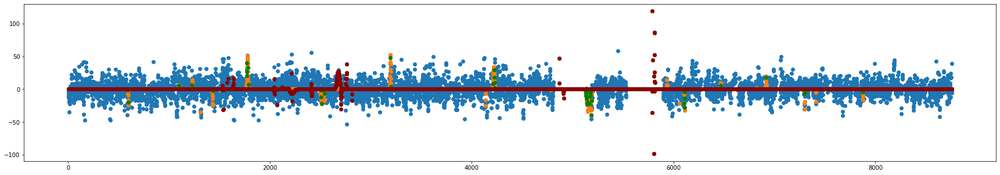

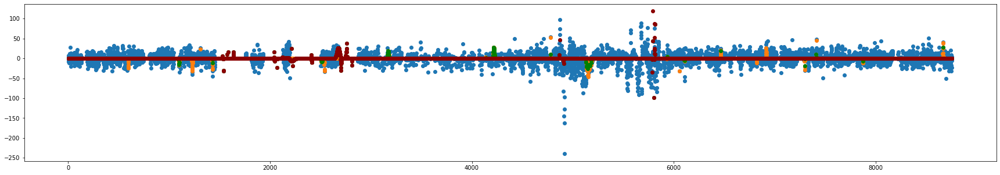

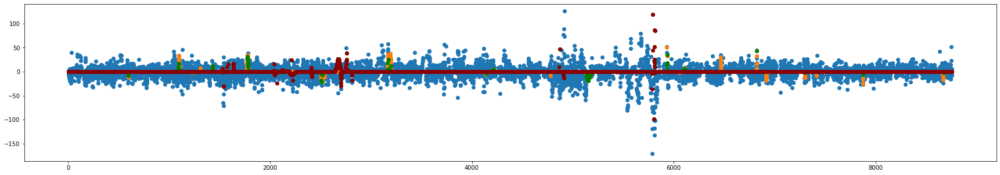

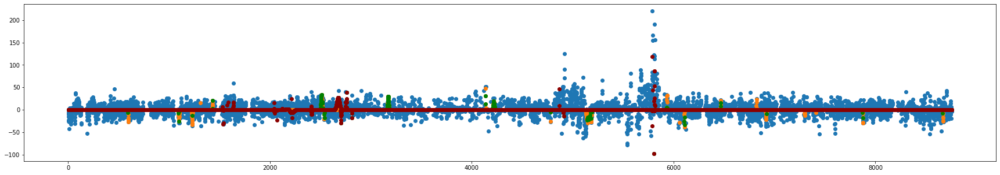

44th additional rbflayer
tensor([[-161.8574, -145.0462, -128.0946,  -97.5486,   91.6703,  -87.5956,
          -78.1607,   72.3043,  -69.5860,  -68.6797, -187.6546, -171.3064,
          154.3498, -152.9867, -152.5029,  145.9220, -142.8156, -137.9137,
         -122.9233,  121.9025,   75.8215,  -63.6004,   52.6380,  -48.5001,
           45.7757,   43.0932,   37.0512,  -36.1417,   34.1080,  -32.3719,
          -37.3461,   25.6574,  -23.0612,   22.5099,  -19.4908,  -19.1632,
           18.3009,   18.2645,  -17.6832,  -17.3348,  -47.3333,  -45.1153,
          -41.9613,  -35.3444,  -34.7892,   33.7255,   32.2072,   31.3451,
           31.3052,   31.1676,  -77.9083,   49.4139,  -40.9813,  -40.5000,
          -39.4885,   39.3715,  -37.4197,  -37.3920,  -36.3424,   33.2836]],
       device='cuda:0', dtype=torch.float64)
44th additional RBFlayer 0th epoch loss: 10.40356883491475
44th additional RBFlayer 999th epoch MSE Loss: 9.449461972402073
44th additional RBFlayer 1999th epoch MSE Loss: 9.3775

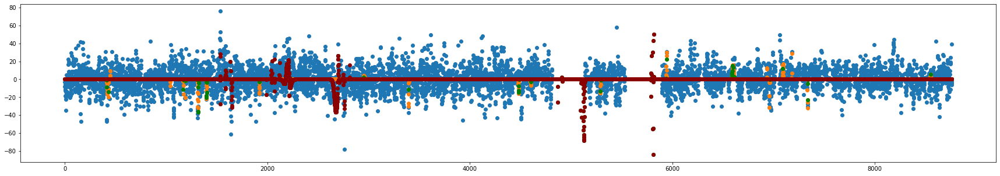

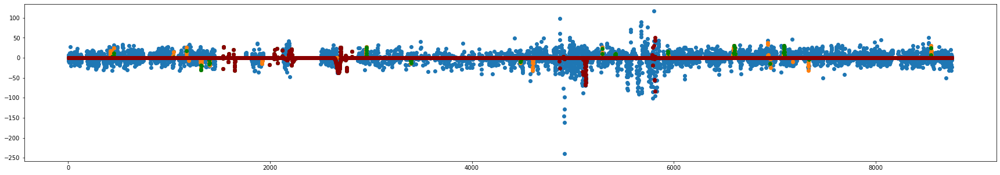

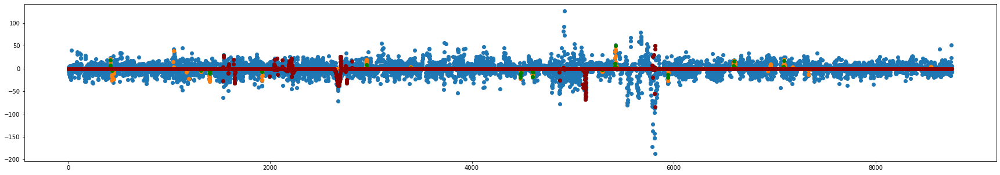

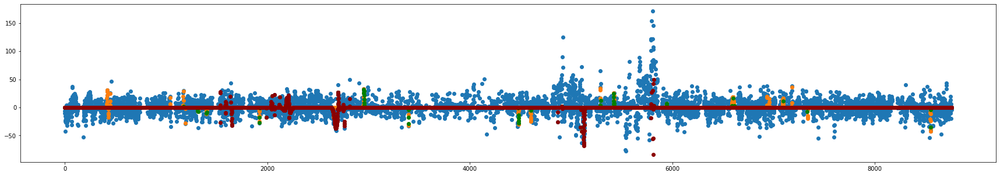

45th additional rbflayer
tensor([[-161.8574, -145.0462, -128.0946,   97.9579,   91.9090,   91.6703,
           81.9808,  -78.3547,   72.3986,   71.4514, -171.3643, -152.4746,
          122.4798, -121.9162,  120.8647,  119.9930,  116.3878,  111.1704,
          107.0234,  103.1536,   70.7475,  -67.3718,  -52.7593,   50.5450,
          -46.7274,   43.0927,   42.1800,  -36.1417,   32.7782,   31.9597,
           37.0289,  -32.6772,   27.9674,  -27.9189,  -24.2609,   21.6655,
           21.0585,   19.5415,  -19.4743,  -19.3336,  -64.7713,   63.0569,
           48.0267,  -41.8318,  -37.0675,  -35.3053,   32.2072,   31.3451,
           30.4809,   30.3092,  -53.3449,   52.2774,   41.3107,  -36.4627,
          -34.0923,   33.2760,   31.4595,   30.9826,  -30.6661,   25.3134]],
       device='cuda:0', dtype=torch.float64)
45th additional RBFlayer 0th epoch loss: 10.429036572248645
45th additional RBFlayer 999th epoch MSE Loss: 9.317111613508473
45th additional RBFlayer 1999th epoch MSE Loss: 9.255

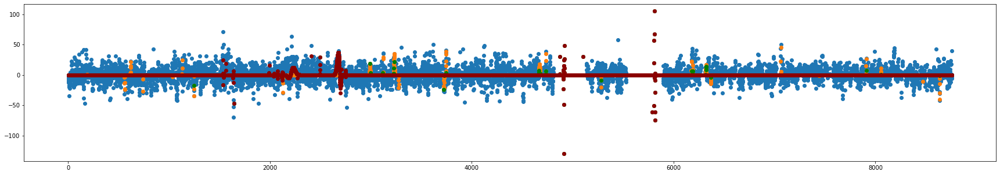

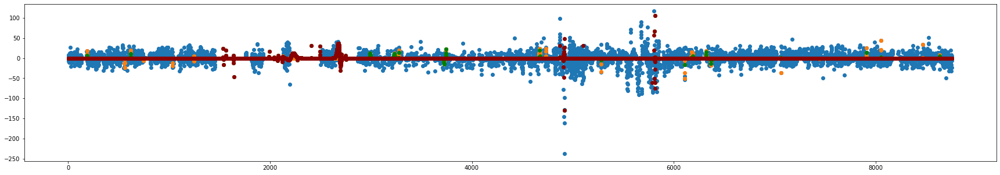

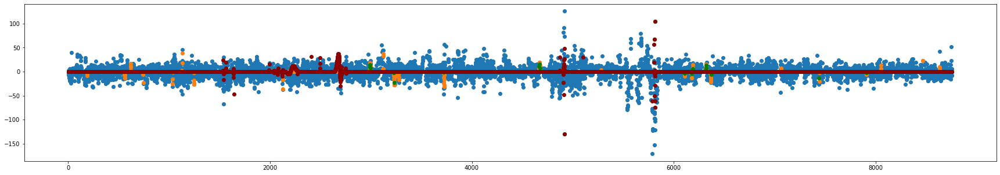

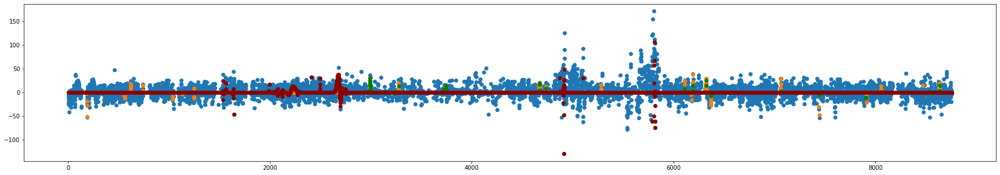

46th additional rbflayer
tensor([[-176.1404, -162.2302,  136.3592, -123.7071,  -96.4119,   75.6044,
          -75.4573,   72.3985,   67.4150,  -63.6985, -208.5237,  154.3852,
         -151.5225,  136.7054,  122.4798,  120.8647, -118.9263,  114.5846,
          106.1301,  105.9685,  -70.2291,   62.2192,   54.8209,  -50.7451,
          -47.2629,   46.7496,  -46.6662,   45.7757,  -40.4085,  -37.8200,
           37.0165,  -32.6716,  -24.0000,  -23.2929,   21.2300,  -21.0769,
           20.0000,  -19.8029,   19.5650,   19.4598,   56.0573,  -44.2093,
           39.5038,  -37.4911,  -36.5392,  -36.0454,  -34.0026,   34.0022,
          -32.4713,   32.2072,  -71.7277,  -53.3449,  -36.2280,   33.6157,
          -32.7035,  -31.8138,  -31.8051,   31.7776,  -31.3550,  -30.0530]],
       device='cuda:0', dtype=torch.float64)
46th additional RBFlayer 0th epoch loss: 9.888551518984588
46th additional RBFlayer 999th epoch MSE Loss: 9.125862952038874
46th additional RBFlayer 1999th epoch MSE Loss: 9.1200

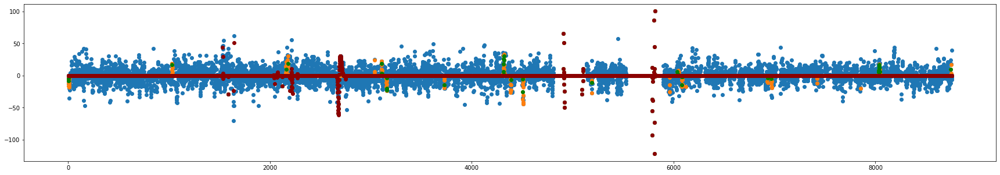

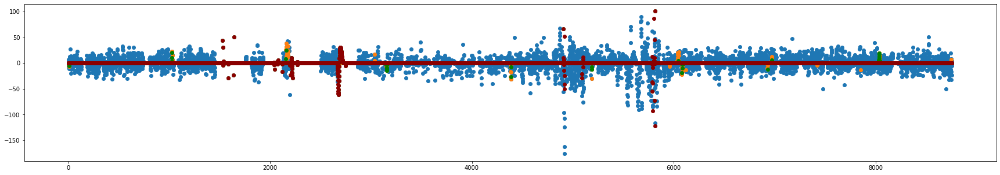

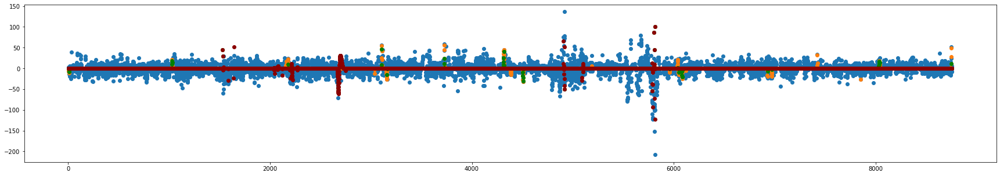

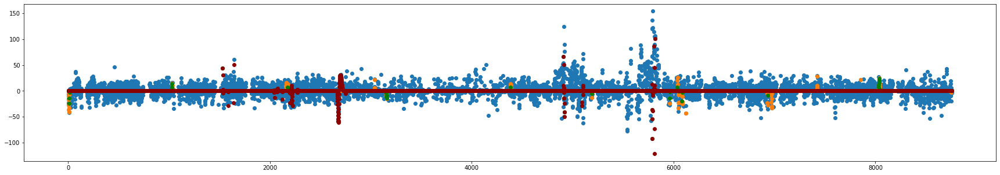

47th additional rbflayer
tensor([[-158.7942,  131.1146,  127.5483, -109.5101,  -97.0744,  -82.2370,
           69.7468,   67.4150,  -66.0463,  -65.9364,  213.0457,  163.5227,
          160.9920, -146.2097, -130.8457, -122.6482,  122.6344,  121.4176,
          112.1531, -107.3842,  -90.3052,  -72.3762,   56.5786,  -53.8594,
          -47.2629,  -46.6764,  -36.1417,   35.4069,   34.1080,   32.7782,
           37.0165,  -22.0429,  -21.9672,  -21.0759,  -20.2036,  -19.9956,
           19.8095,   19.6746,   19.4598,   18.3011,  -61.3674,   45.4425,
          -44.2128,  -38.9849,  -37.2236,   34.5186,  -34.0026,  -31.8622,
           31.3451,  -31.0153,   76.3326,  -53.3449,   47.7835,   42.5738,
           41.9247,  -38.7101,  -36.9342,   35.3336,  -34.7688,   34.0405]],
       device='cuda:0', dtype=torch.float64)
47th additional RBFlayer 0th epoch loss: 10.070014740380541
47th additional RBFlayer 999th epoch MSE Loss: 9.119872879229915
47th additional RBFlayer 1999th epoch MSE Loss: 9.050

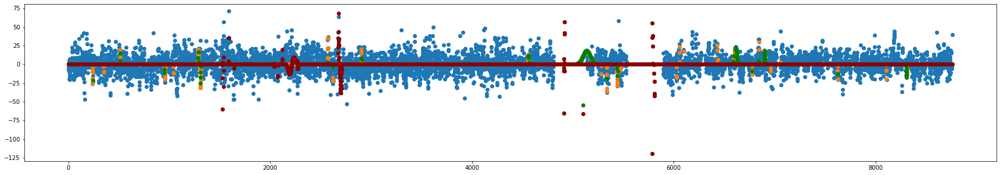

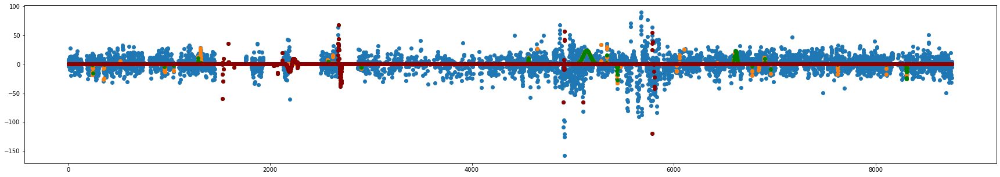

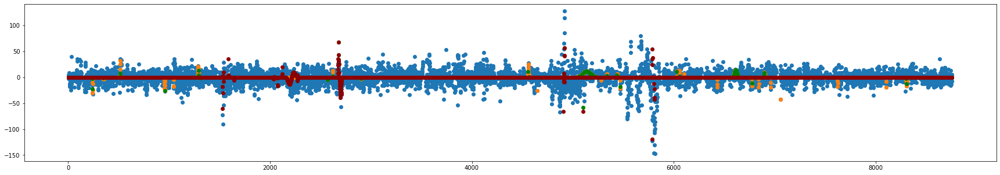

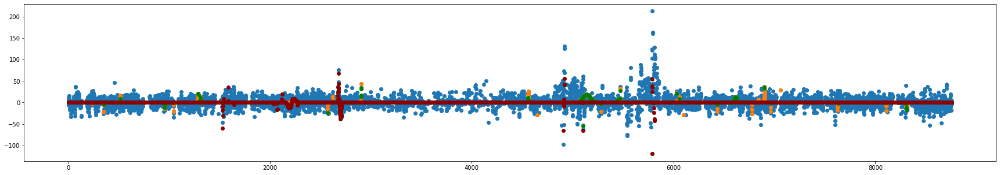

48th additional rbflayer
tensor([[-163.1323, -155.5993,  109.1782,  -87.6445,   86.8405,   82.2972,
          -81.0302,  -75.2851,   75.1285,  -69.2123,  244.3774,  174.9655,
          163.5227,  160.2585, -147.8251,  112.1531,  107.1933,  107.1567,
          106.1301,  101.8610,   61.7108,  -60.3856,   47.3200,  -47.2629,
          -46.6764,  -46.6666,   46.5889,  -40.4085,  -36.1417,   35.7285,
           32.9644,   31.0892,  -21.0757,  -20.6910,  -20.6238,  -20.5880,
          -19.9637,  -19.6646,   19.4171,   19.0844,  -48.3089,   46.7195,
          -46.3824,   43.2979,  -40.2491,  -37.3572,   37.1538,  -35.9190,
          -35.8760,  -33.9496,   55.7599,   38.6551,  -36.3582,  -33.8058,
           33.6157,  -31.8054,   30.8815,  -30.0531,  -29.6342,  -29.5467]],
       device='cuda:0', dtype=torch.float64)
48th additional RBFlayer 0th epoch loss: 9.98062685512292
48th additional RBFlayer 999th epoch MSE Loss: 8.923710709247493
48th additional RBFlayer 1999th epoch MSE Loss: 8.86253

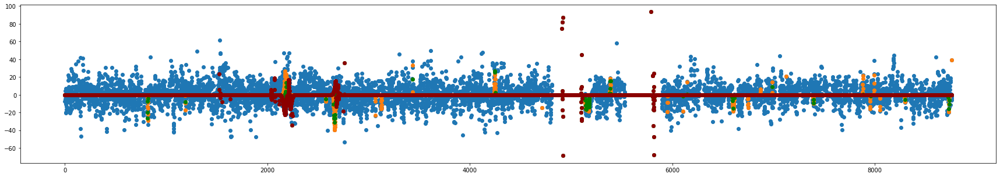

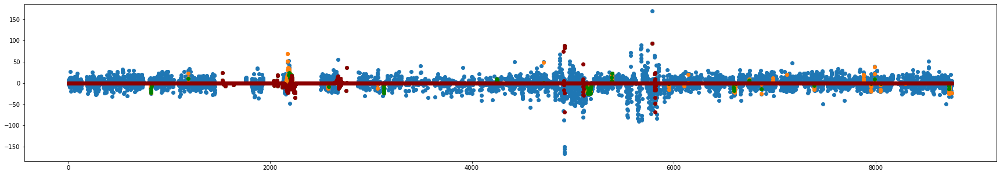

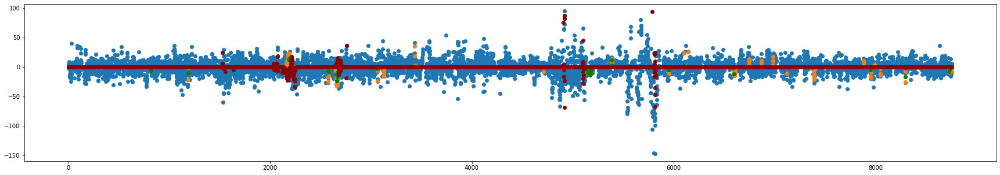

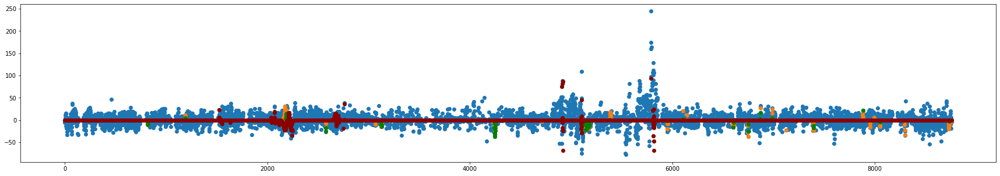

49th additional rbflayer
tensor([[-254.4347, -231.7330, -161.7120, -140.1984,  -89.6495,  -86.7630,
          -76.1329,   75.0981,  -70.3855,  -66.5850,  244.3774, -199.1892,
          174.9655,  163.4658,  160.2585, -143.7459,  114.5673,  102.7707,
          100.0522,   99.7508,   61.7108,  -60.1458,   50.8396,  -47.2629,
           47.1963,  -46.6407,  -44.2715,  -36.1417,  -35.1212,   34.1080,
           37.0165,   24.7206,  -23.9748,  -23.6460,  -21.0785,   19.9499,
           19.6608,  -19.0579,   17.5005,  -17.4618,  -69.1309,  -53.8899,
          -45.8609,   39.1083,   35.1151,  -33.5029,  -33.1210,  -32.9159,
           31.3451,  -31.3339,  -89.2105,   48.8344,   44.8170,  -36.4630,
           33.6157,  -32.1766,  -31.8054,  -27.0000,  -26.6215,   25.5482]],
       device='cuda:0', dtype=torch.float64)
49th additional RBFlayer 0th epoch loss: 10.193358184636649
49th additional RBFlayer 999th epoch MSE Loss: 8.807537473337662
49th additional RBFlayer 1999th epoch MSE Loss: 8.749

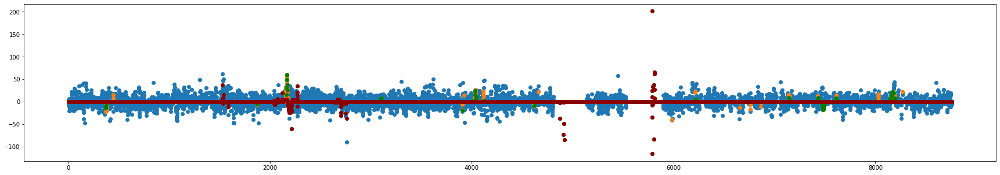

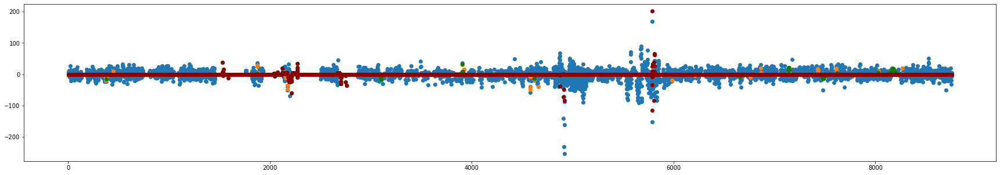

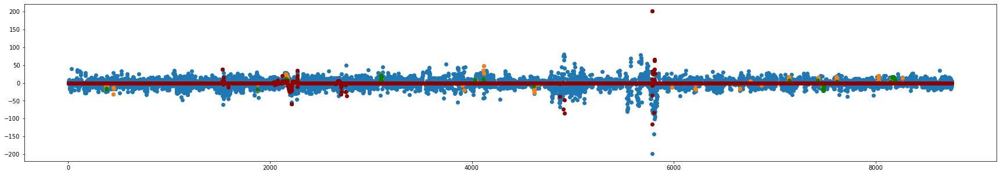

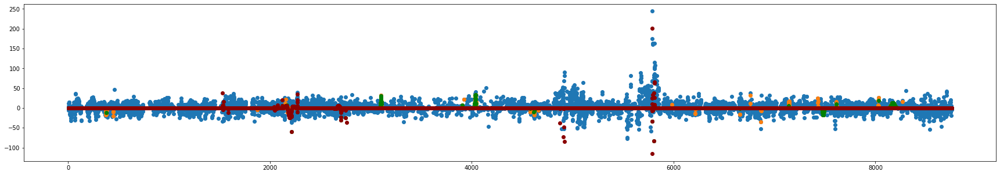

50th additional rbflayer
tensor([[-183.6207, -169.8341, -161.3420,  104.8926,  -89.6495,   82.2586,
           81.5314,   76.1987,  -76.1329,  -69.2268,  168.9629, -151.5970,
          149.8836, -139.4470, -137.4419,  136.5933,  127.2341,  119.7165,
          114.1269,  111.8997,  -56.3300,  -52.6882,  -49.8000,   47.6667,
          -46.6764,  -46.6222,  -35.6623,  -35.3333,  -35.1212,   34.8991,
           37.0165,  -36.7428,   25.3929,  -24.3001,  -22.1580,   22.0327,
          -20.3016,  -20.1213,  -19.3633,  -17.3348,   88.5005,   59.1689,
          -54.8354,  -53.1449,   50.9362,  -45.0049,   43.6347,   42.2847,
           41.2817,   35.1364,   57.3764,  -52.8099,   48.8346,  -41.8229,
           39.5333,   38.8906,   33.6157,   28.1603,   27.5897,  -26.5504]],
       device='cuda:0', dtype=torch.float64)
50th additional RBFlayer 0th epoch loss: 9.647864250722735
50th additional RBFlayer 999th epoch MSE Loss: 8.692277932868175
50th additional RBFlayer 1999th epoch MSE Loss: 8.6392

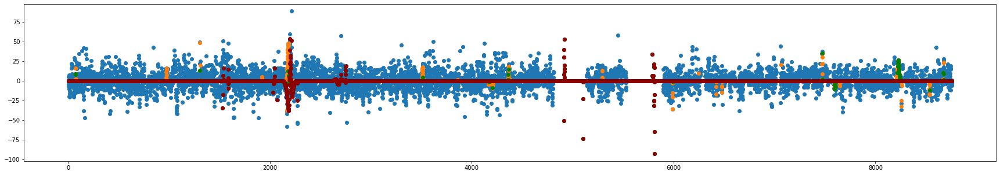

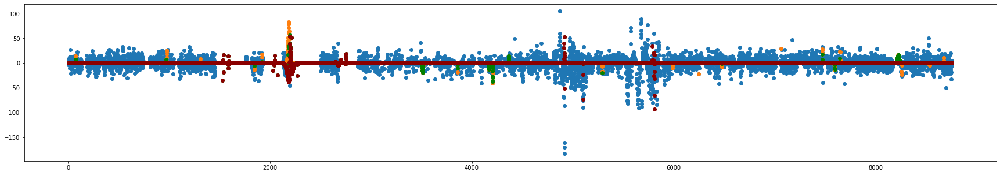

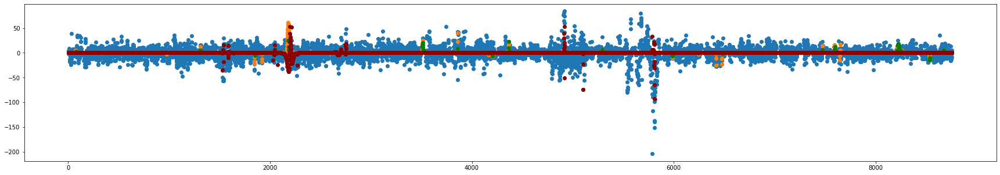

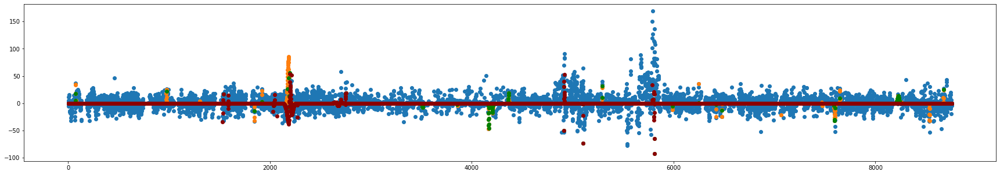

51th additional rbflayer
tensor([[-181.2538, -176.5254, -139.6260, -133.0472, -109.0592,  104.8926,
           94.3424,   76.1987,  -69.2268,  -67.0404,  168.9628,  149.8836,
          136.5565, -122.4415,  119.7110,  113.4437, -108.0326,  107.6067,
          102.1553,  -96.7804,  -73.3738,   57.2507,  -49.8000,  -46.8292,
          -46.6764,  -46.6222,   44.4182,  -38.6071,   36.7371,  -36.1417,
           39.9906,   37.0165,  -36.6245,  -28.7629,  -24.2912,  -21.8157,
           20.7174,  -20.1213,   18.9392,   18.8731,  -53.1066,  -45.9396,
           45.3685,   43.6847,  -37.9530,   37.1631,   36.3620,   34.1949,
           32.2072,   31.3850,   56.6566,  -52.8100,   44.1042,  -37.2977,
           30.2098,  -27.7671,  -26.6884,   26.4233,   24.5215,  -24.0803]],
       device='cuda:0', dtype=torch.float64)
51th additional RBFlayer 0th epoch loss: 9.582492463798328
51th additional RBFlayer 999th epoch MSE Loss: 8.526996357919192
51th additional RBFlayer 1999th epoch MSE Loss: 8.4926

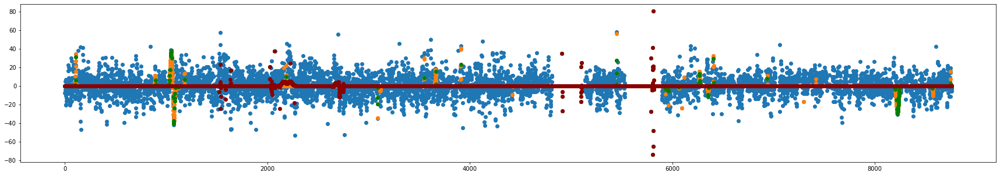

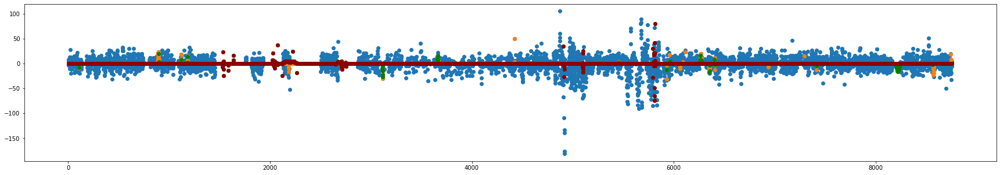

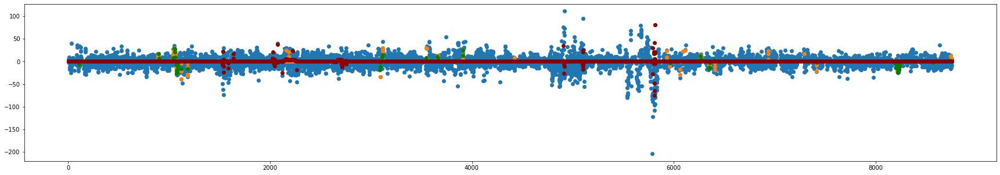

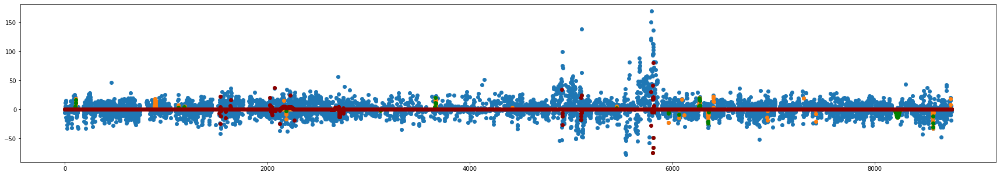

52th additional rbflayer
tensor([[-181.1167, -139.6260, -133.0471,  113.1458, -109.0591,  104.8926,
         -101.9268,   86.8853,   76.1987,  -69.0309, -204.1422, -174.2140,
          169.1975,  150.4516,  143.2566,  131.2845,  119.7920, -119.0211,
          115.6317,  -99.6083,  -85.2237,  -63.6991,   53.1714,  -49.7999,
           47.6667,  -46.6764,   42.9234,  -38.6071,  -36.2972,  -36.1417,
           37.0152,  -35.4963,   30.8228,  -24.1406,  -23.8827,   18.3942,
          -17.8269,  -17.1159,   16.8785,   16.7706,  -54.7228,  -45.6668,
           39.3294,   33.7657,   33.0394,  -32.9029,   32.7240,   32.2072,
           32.2012,  -32.0454,   56.2099,  -52.8100,   40.4523,   36.6170,
           33.6157,  -24.6061,   24.2108,   23.6318,   23.5743,  -23.4872]],
       device='cuda:0', dtype=torch.float64)
52th additional RBFlayer 0th epoch loss: 9.473902596625894
52th additional RBFlayer 999th epoch MSE Loss: 8.444587558634588
52th additional RBFlayer 1999th epoch MSE Loss: 8.3846

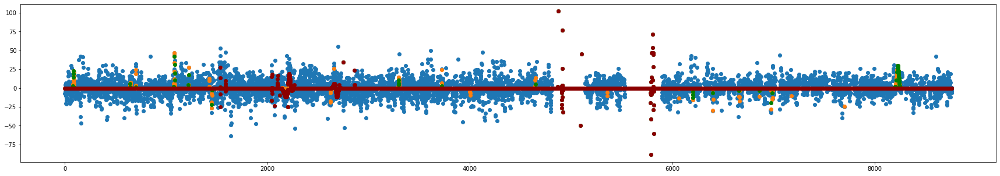

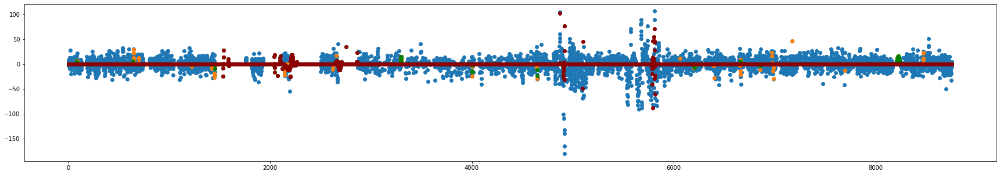

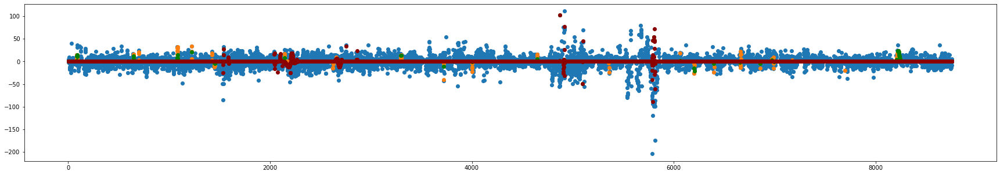

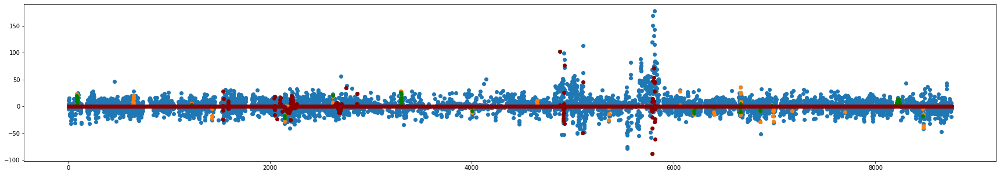

53th additional rbflayer
tensor([[-241.9672, -178.2361, -159.2000, -131.2368, -107.8845,   82.9005,
           74.7227,  -72.7045,  -69.0309,  -67.7549,  208.5713,  155.1043,
         -152.8044,  149.4272, -143.0050, -141.3959, -113.3003, -105.1602,
           98.9226,  -94.7135,  -66.4626,  -63.6991,  -63.0390,  -60.4043,
          -49.7999,  -48.7455,  -46.6764,   44.8790,  -36.2972,  -36.1417,
          -37.4260,   37.0152,   28.4557,  -27.9079,   27.4517,  -24.0705,
           22.3860,   22.3116,  -17.8269,   17.2303,  -53.4650,  -53.2879,
           51.7387,  -49.6464,  -38.7550,   37.0022,  -34.7881,   32.2072,
           31.3451,  -31.1996,   58.8777,  -57.5724,  -52.8100,   44.7869,
          -35.4440,   33.6157,   32.0092,  -31.3552,  -29.9277,   24.4928]],
       device='cuda:0', dtype=torch.float64)
53th additional RBFlayer 0th epoch loss: 9.384410682286918
53th additional RBFlayer 999th epoch MSE Loss: 8.288798868215752
53th additional RBFlayer 1999th epoch MSE Loss: 8.2463

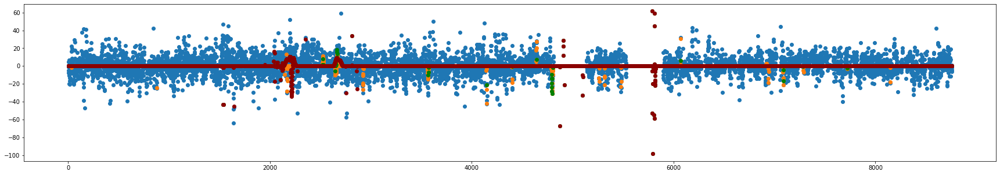

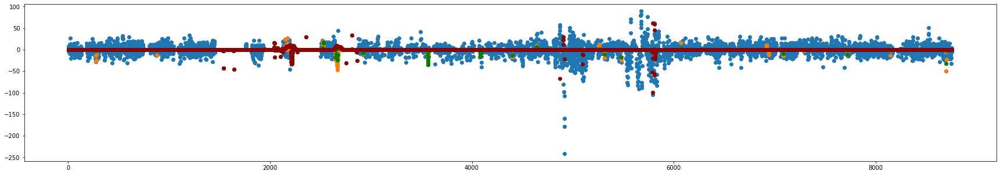

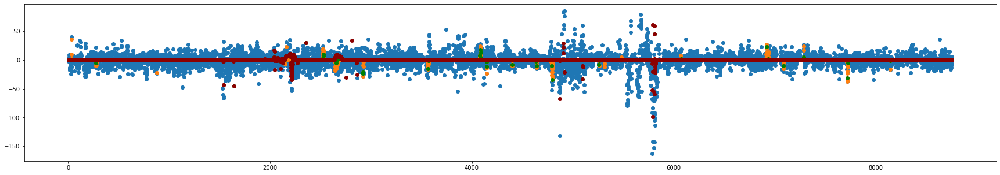

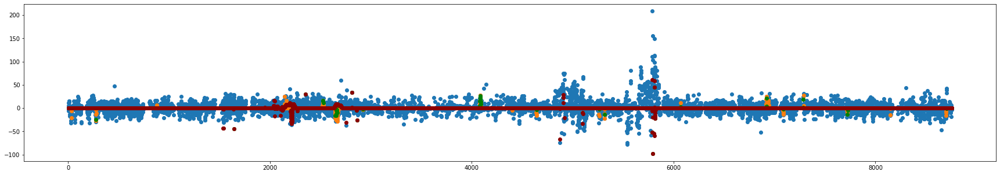

54th additional rbflayer
tensor([[-220.4721, -178.2337, -159.2000, -107.8845, -102.0262,   70.2523,
          -67.7549,   67.5718,  -65.0046,  -64.5101,  202.1243,  175.1709,
          163.9148, -163.2416,  147.0882,  109.5715,  108.9197, -107.2989,
          105.4454, -103.6119,   73.4629,   68.6979,  -63.6991,  -58.3486,
           44.8790,  -35.3333,   34.8035,  -34.4793,   32.2227,   31.8272,
           37.0158,  -27.8718,   24.9063,   22.2569,  -21.5460,  -18.8320,
           17.2303,  -17.2250,   16.6794,  -16.1489,  -55.5454,  -55.3908,
           54.4126,   47.1462,   45.7785,  -43.7720,   39.1885,   37.2475,
           34.6696,  -33.8505,   54.9784,  -52.8100,   43.5597,  -41.1274,
          -34.0858,   32.7886,   25.5975,  -24.8075,   23.5496,   22.7268]],
       device='cuda:0', dtype=torch.float64)
54th additional RBFlayer 0th epoch loss: 9.351351737519472
54th additional RBFlayer 999th epoch MSE Loss: 8.191217504590014
54th additional RBFlayer 1999th epoch MSE Loss: 8.1145

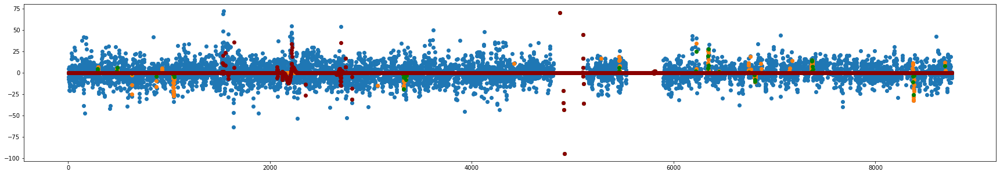

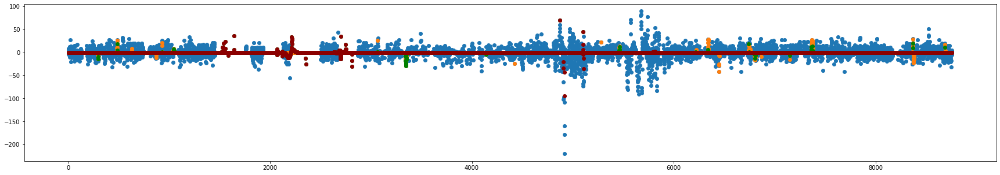

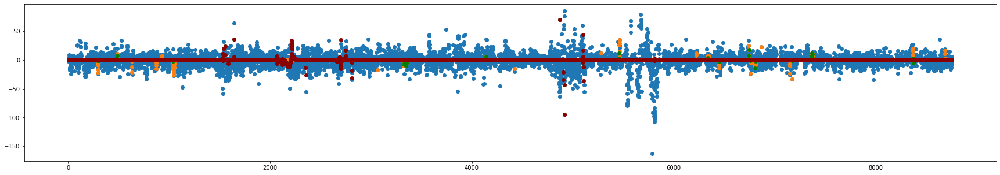

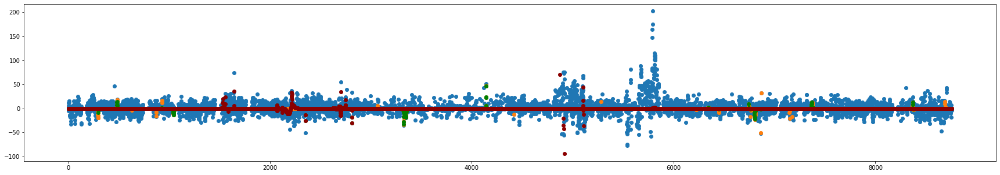

55th additional rbflayer
tensor([[-178.1560,  126.3163,  115.8004,  -97.2315,   74.7673,  -73.6007,
          -72.8538,   70.2348,  -67.2306,  -62.5028,  175.1679,  163.9148,
         -163.2416,  146.8296,  114.2633, -108.6367,  107.5618,  103.3573,
         -102.8198,  101.2733,  -69.3426,  -63.6991,   62.5909,  -59.9949,
          -46.6667,  -43.3294,   37.6400,  -35.3333,   34.4987,  -34.4681,
           37.0111,   24.2206,  -23.9035,   21.4254,   21.4060,   19.0022,
          -18.2472,   17.8511,  -17.2250,  -16.9561,   50.8049,  -42.0335,
          -41.7047,   37.3322,  -36.9053,  -36.1411,  -34.8582,  -34.6560,
           34.3445,  -33.1349,  -52.8101,   51.3821,   43.6553,  -41.4002,
          -36.1118,   32.7879,   25.4409,  -23.8487,   22.7266,   22.5336]],
       device='cuda:0', dtype=torch.float64)
55th additional RBFlayer 0th epoch loss: 9.061030875167058
55th additional RBFlayer 999th epoch MSE Loss: 8.043530699924407
55th additional RBFlayer 1999th epoch MSE Loss: 8.0124

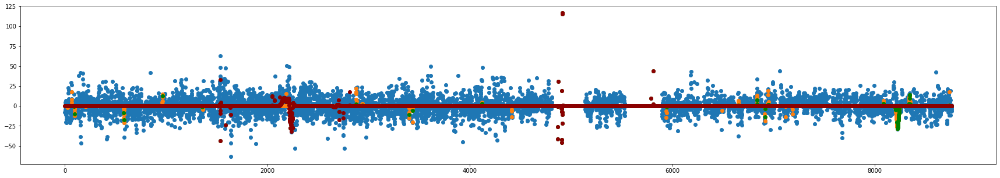

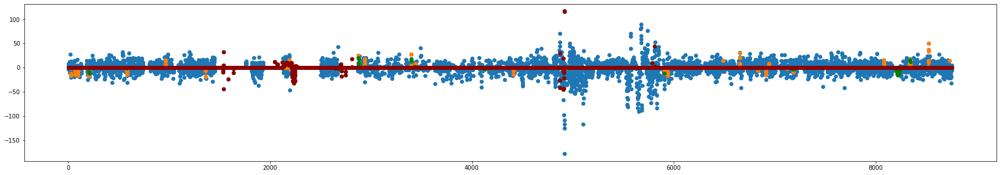

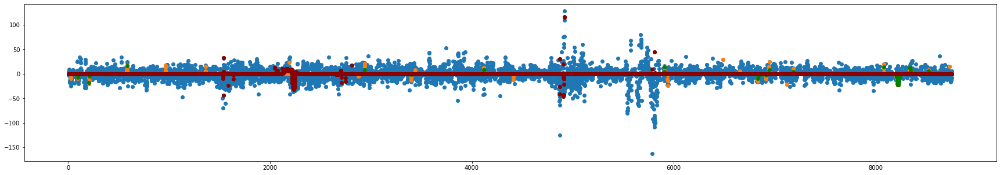

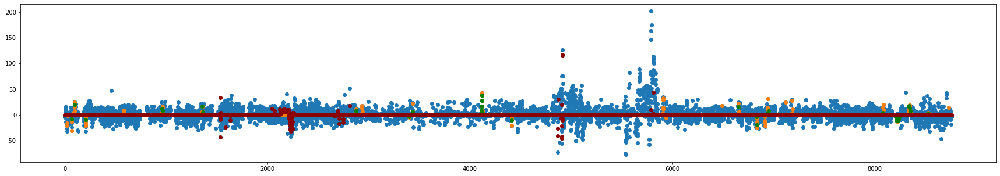

56th additional rbflayer
tensor([[-242.3745, -179.1991,  120.5487, -116.9206, -107.8847,  103.6306,
          -83.2779,   78.3402,  -63.6161,  -62.5028,  201.6376,  175.1679,
          163.9148, -163.2416,  146.8296, -108.6490,  106.3016,  103.3566,
         -102.8198,  -89.4367,   92.3907,   71.5000,  -63.6991,  -62.2560,
          -60.2685,  -49.8039,   37.6400,  -34.4681,   32.5000,  -31.5467,
           37.0084,  -31.8132,  -28.5268,  -24.0218,  -23.8069,   20.2857,
          -18.2484,   18.2437,   17.2303,  -17.2250,  -54.1429,  -52.1599,
          -47.2950,   45.1270,   42.2184,  -35.4529,   34.9600,  -34.1901,
          -33.0516,   32.3483,  -52.8101,   44.1319,  -41.0654,  -36.9515,
           36.4977,   32.7876,  -25.9858,   24.0743,  -23.7450,   22.7265]],
       device='cuda:0', dtype=torch.float64)
56th additional RBFlayer 0th epoch loss: 9.015595027813449
56th additional RBFlayer 999th epoch MSE Loss: 8.009322289765059
56th additional RBFlayer 1999th epoch MSE Loss: 7.9046

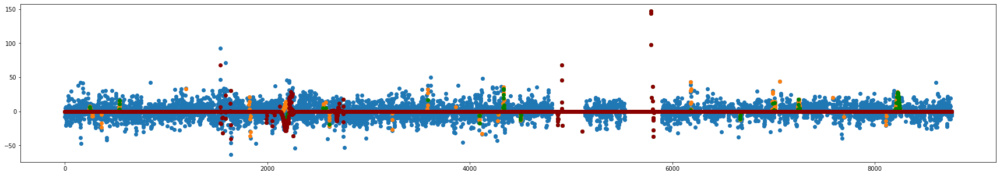

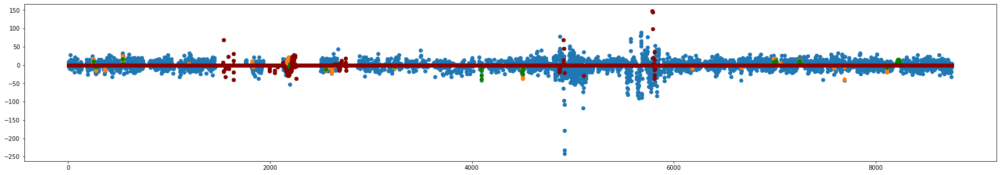

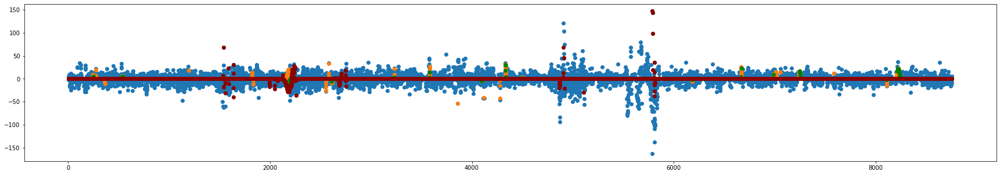

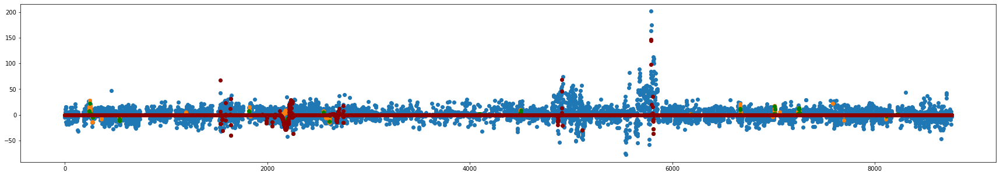

In [14]:
model = MSMRBFNN_ver2(4, 30, 10, device)
model.train(input, target, 2000, 1e-3, 8, 15, 0.2)

In [15]:
real = pd.read_csv("./dataset/pm25_ground.txt").drop(['datetime'], axis = 1)
real = real[real.columns[6:10]].reset_index(drop=True)
real_target = torch.tensor(real.values).T.to(device).reshape(4,len(real))
real_missing = torch.where(real_target.isnan(), 0.0, 1.0)

missing_index = torch.where(real_target.isnan(), 0.0, 1.0) - torch.where(target.isnan(), 0.0, 1.0)
pred_ = model.pred(input)[1]

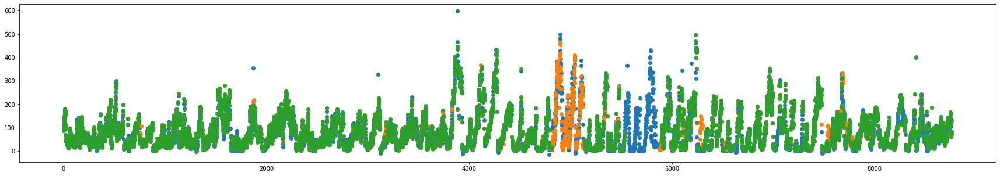

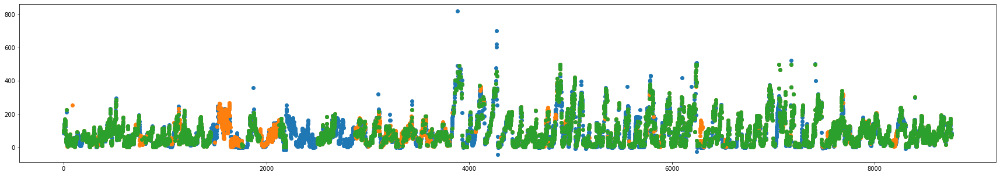

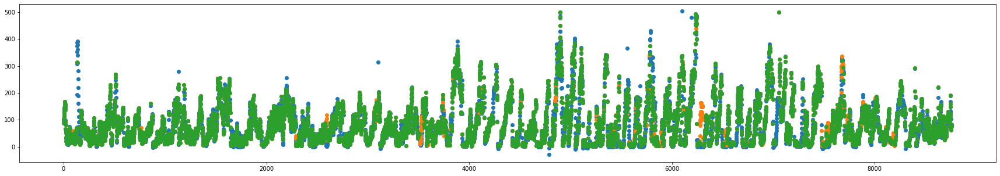

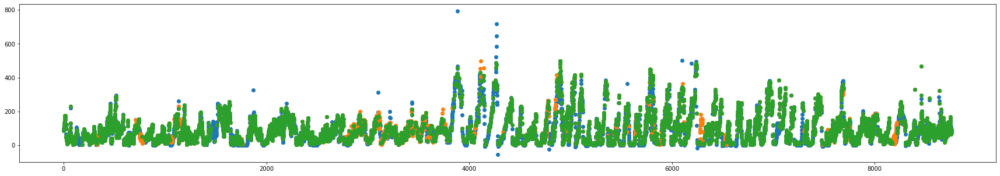

In [24]:
for i in range(4):
    plt.figure(figsize=(30,5))
    plt.scatter(input.cpu().detach().numpy(), pred_[i].cpu().detach().numpy())
    plt.scatter(input.cpu().detach().numpy(), real_target[i].cpu().detach().numpy())
    plt.scatter(input.cpu().detach().numpy(), target[i].cpu().detach().numpy())

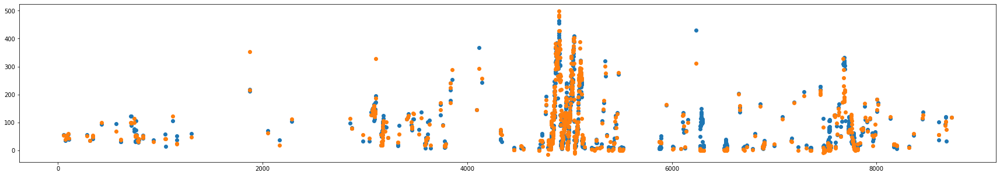

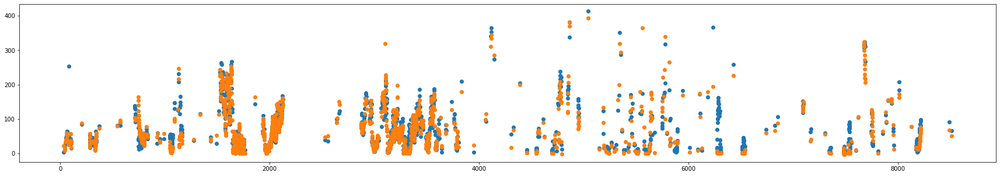

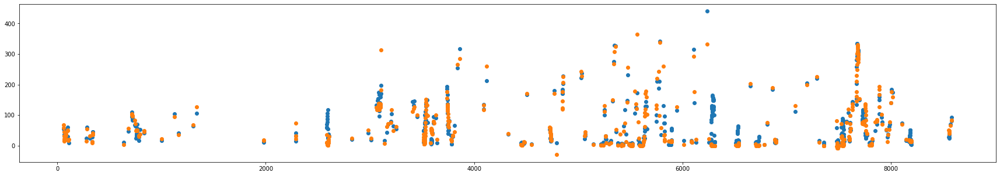

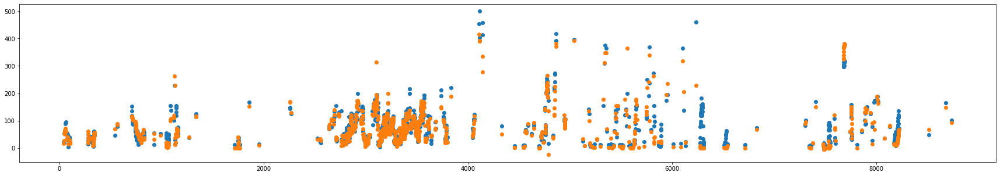

In [17]:
for i in range(4):
    plt.figure(figsize=(30,5))
    plt.scatter(input[missing_index[i] == 1].cpu().detach().numpy(), real_target[i][missing_index[i] == 1].cpu().detach().numpy())
    plt.scatter(input[missing_index[i] == 1].cpu().detach().numpy(), pred_[i][missing_index[i] == 1].cpu().detach().numpy())

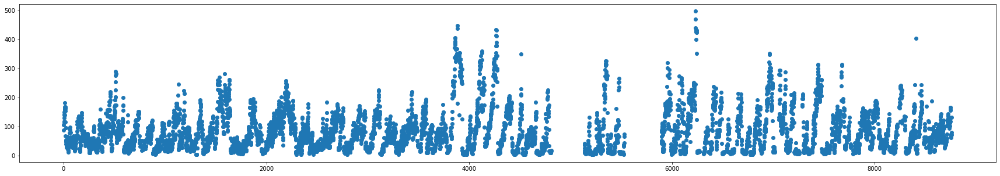

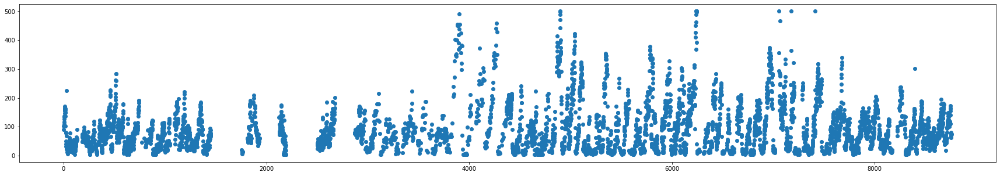

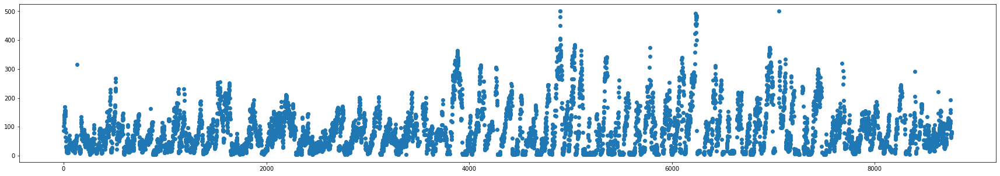

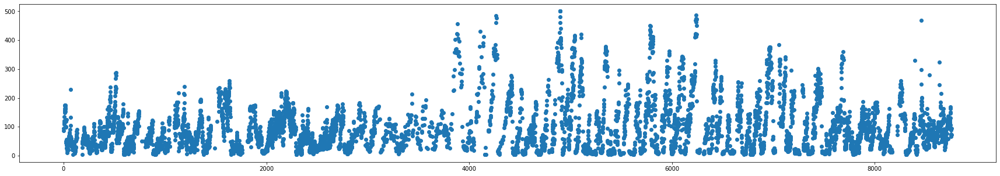

In [28]:
for i in range(4):
    plt.figure(figsize=(30,5))
    # plt.scatter(input.cpu().detach().numpy(), pred_[i].cpu().detach().numpy())
    # plt.scatter(input.cpu().detach().numpy(), real_target[i].cpu().detach().numpy())
    plt.scatter(input.cpu().detach().numpy(), target[i].cpu().detach().numpy())

In [18]:
torch.mean(torch.abs(real_target[[missing_index == 1]] - pred_[[missing_index == 1]]))

tensor(20.9163, device='cuda:0', dtype=torch.float64)

In [25]:
b = torch.abs(real_target[[missing_index == 1]] - pred_[[missing_index == 1]])
b[b < 40].size()

torch.Size([3374])

In [20]:
b.size()

torch.Size([3886])

In [26]:
torch.mean(b[b < 40])

tensor(12.1459, device='cuda:0', dtype=torch.float64)

In [27]:
torch.mean(b[b > 40])

tensor(78.7117, device='cuda:0', dtype=torch.float64)